In [1]:
import sys
# !{sys.executable} -m pip install matplotlib
# !{sys.executable} -m pip install mrcfile
# !{sys.executable} -m pip install numpy
# !{sys.executable} -m pip install pandas
# !{sys.executable} -m pip install Pillow
# !{sys.executable} -m pip install POT
# !{sys.executable} -m pip install scipy
# !{sys.executable} -m pip install seaborn
# !{sys.executable} -m pip install numba
# !{sys.executable} -m pip install Bio
# !{sys.executable} -m pip install tornado==4.5.3
!pip freeze

aiosignal==1.3.1
alabaster==0.7.13
anyio==3.6.2
argon2-cffi==21.3.0
argon2-cffi-bindings==21.2.0
arrow==1.2.3
# Editable install with no version control (aspire==0.12.0)
-e c:\users\artaj\dev\aspire-python-main
asttokens==2.2.1
attrs==22.2.0
Babel==2.13.0
backcall==0.2.0
beautifulsoup4==4.12.2
bio==1.5.9
biopython==1.81
biothings-client==0.3.0
black==23.9.1
bleach==6.0.0
blinker==1.8.2
build==1.0.3
bump2version==1.0.1
bumpversion==0.6.0
cachetools==5.3.1
certifi==2023.5.7
cffi==1.15.1
chardet==5.2.0
charset-normalizer==3.1.0
check-manifest==0.49
click==8.1.7
colorama==0.4.6
comm==0.1.3
ConfigArgParse==1.7
confuse==2.0.1
contourpy==1.0.7
coverage==7.3.2
cycler==0.11.0
dash==2.17.0
dash-core-components==2.0.0
dash-html-components==2.0.0
dash-table==5.0.0
debugpy==1.6.7
decorator==5.1.1
defusedxml==0.7.1
distlib==0.3.7
docutils==0.17.1
EMalign==1.0.5
exceptiongroup==1.1.3
execnet==2.0.2
executing==1.2.0
fastjsonschema==2.16.3
filelock==3.12.4
finufft==2.1.0
flake8==6.1.0
Flask==3.0.3
font

In [2]:
# %matplotlib notebook
import matplotlib.pyplot as plt
import math
import numpy as np
import ot
from matplotlib import collections  as mc
from mpl_toolkits.mplot3d import Axes3D
import random
import time
import seaborn as sns
import json

import mrcfile
import pandas as pd
import trn, coords
import importlib
importlib.reload(trn)

import torch
from unbalancedgw.vanilla_ugw_solver import exp_ugw_sinkhorn
from unbalancedgw.vanilla_ugw_solver import log_ugw_sinkhorn
from unbalancedgw._vanilla_utils import ugw_cost
from unbalancedgw.utils import generate_measure
from unbalancedgw._vanilla_utils import l2_distortion

from scipy.spatial.transform import Rotation

from Bio import PDB
from Bio.PDB.vectors import Vector, rotmat

plt.rcParams["figure.figsize"] = (10,10)

In [3]:
class Term:
    def __init__(self, coef=1, exps=[0,0,0,0]):
        self.coef = coef
        self.exps = exps
        while len(self.exps) < 8:
            self.exps.append(0)
    
    def derivative(self, index):
        new_exps = [0,0,0,0,0,0,0,0]
        for i in range(8):
            if i != index:
                new_exps[i] = self.exps[i]
            else:
                new_exps[i] = self.exps[i] - 1
        return Term(coef=self.coef*self.exps[index], exps=new_exps)
    
    def evaluate(self, vals):
        s = self.coef
        if s == 0:
            return 0
        for i in range(min(len(vals), len(self.exps))):
            if self.exps[i] == 0:
                continue
            elif self.exps[i] == 1:
                s *= vals[i]
            elif self.exps[i] == 2:
                s *= vals[i] * vals[i]
            elif self.exps[i] == 3:
                s *= vals[i] * vals[i] * vals[i]
            else:
                print(self.exps[i])
                s *= vals[i] ** self.exps[i]
        return s
    
    def bunch_evaluate(self, bunch_vals):
        s = self.coef
        for i in range(min(len(bunch_vals), len(self.exps))):
            for j in range(self.exps[i]):
                s = np.multiply(s, bunch_vals[i])
        return s
    
    def __mul__(self, other):
        coef = self.coef * other.coef
        exps = []
        for i in range(8):
            exps.append(self.exps[i] + other.exps[i])
        return Term(coef=coef, exps=exps)
    
    def __neg__(self):
        return Term(coef=-self.coef, exps=self.exps)
    
    def __str__(self):
        s = ""
        for i in range(8):
            if self.exps[i] != 0:
                s += "q" + str(i) + "^" + str(self.exps[i])
        return str(self.coef) + "*" + s
    
    def is_similar(self, other):
        for i in range(8):
            if self.exps[i] != other.exps[i]:
                return False
        return True
    
    def simplify(self, vals):
        new_exps = [0,0,0,0,0,0,0,0]
        coef = self.coef
        for i in range(8):
            if vals[i] != 'x':
                coef *= vals[i]**self.exps[i]
            else:
                new_exps[i] = self.exps[i]
        return Term(coef=self.coef*self.exps[index], exps=new_exps)
        
    
class Polynomial:
    def __init__(self, terms=None):
        if terms is None:
            terms = []
        self.terms = {}
        for term in terms:
            self.terms[tuple(term.exps)] = term
        
    def add_term(self, term):
        if term.coef == 0:
            return
        if tuple(term.exps) not in self.terms:
            self.terms[tuple(term.exps)] = term
        else:
            self.terms[tuple(term.exps)].coef += term.coef

    def get_terms(self):
        terms = []
        for exps in self.terms:
            terms.append(self.terms[exps])
        return terms
        
    def derivative(self, index):
        res = Polynomial()
        for term in self.get_terms():
            res.add_term(term.derivative(index))
        return res
    
    def simplify(self, vals):
        res = ()
        for term in self.get_terms():
            res.add_term(term.simplify(vals))
        return res
    
    def evaluate(self, vals):
        t = 0
        for term in self.get_terms():
            t += term.evaluate(vals)
        return t
    
    def bunch_evaluate(self, bunch_vals):
        t = 0
        for term in self.get_terms():
            t = np.add(t, term.bunch_evaluate(bunch_vals))
        return t
    
    def __add__(self, other):
        res = Polynomial()
        for term in self.get_terms():
            res.add_term(term)
        for term in other.get_terms():
            res.add_term(term)
        return res
    
    def __sub__(self, other):
        res = Polynomial()
        for term in self.get_terms():
            res.add_term(term)
        for term in other.get_terms():
            res.add_term(-term)
        return res
    
    def __neg__(self):
        res = Polynomial()
        for term in self.get_terms():
            res.add_term(-term)
        return res
    
    def __mul__(self, other):
        res = Polynomial()
        for term1 in self.get_terms():
            for term2 in other.get_terms():
                res.add_term(term1*term2)
        return res
    
    def __str__(self):
        s = ""
        terms = self.get_terms()
        for i in range(len(terms)):
            if i > 0:
                s += " + "
            s += str(terms[i])
        return s

class Quaternion:
    def __init__(self, real_pol, i_pol, j_pol, k_pol):
        self.real_pol = real_pol
        self.i_pol = i_pol
        self.j_pol = j_pol
        self.k_pol = k_pol
        
    def conjugate(self):
        return Quaternion(self.real_pol, -self.i_pol, -self.j_pol, -self.k_pol)
    
    def __mul__(self, other):
        return Quaternion(self.real_pol*other.real_pol - self.i_pol*other.i_pol - self.j_pol*other.j_pol - self.k_pol*other.k_pol,
                          self.real_pol*other.i_pol + self.i_pol*other.real_pol + self.j_pol*other.k_pol - self.k_pol*other.j_pol,
                          self.real_pol*other.j_pol + self.j_pol*other.real_pol + self.k_pol*other.i_pol - self.i_pol*other.k_pol,
                          self.real_pol*other.k_pol + self.k_pol*other.real_pol + self.i_pol*other.j_pol - self.j_pol*other.i_pol)
    
    def __str__(self):
        return str(self.real_pol) + " + (" + str(self.i_pol) + ")i + (" + str(self.j_pol) + ")j + (" + str(self.k_pol) + ")k"
    

In [4]:
q = Quaternion(Polynomial([Term(coef=1, exps=[1,0,0,0])]), Polynomial([Term(coef=1, exps=[0,1,0,0])]), 
               Polynomial([Term(coef=1, exps=[0,0,1,0])]), Polynomial([Term(coef=1, exps=[0,0,0,1])]))
qs = q.conjugate()
print('The conjugate of %s is %s.'%(str(q), str(qs)))
print('The multiplication of %s and %s is equal to %s.'%(str(q), str(qs), str(q*qs)))

The conjugate of 1*q0^1 + (1*q1^1)i + (1*q2^1)j + (1*q3^1)k is 1*q0^1 + (-1*q1^1)i + (-1*q2^1)j + (-1*q3^1)k.
The multiplication of 1*q0^1 + (1*q1^1)i + (1*q2^1)j + (1*q3^1)k and 1*q0^1 + (-1*q1^1)i + (-1*q2^1)j + (-1*q3^1)k is equal to 1*q0^2 + 1*q1^2 + 1*q2^2 + 1*q3^2 + (0*q2^1q3^1)i + (0*q1^1q3^1)j + (0*q1^1q2^1)k.


In [5]:
def get_quaternion_vals(theta, ax, ay, az):
    """
    Compute the quaternion representation for a given rotation in angle-axis representation
    params:
        theta: the angle of the rotation in radians
        ax, ay, az: three floats in a way that *ax, ay, az) shows the 3d axis of the rotation

    retrun:
        q: is a list of length 4 that has values of the corresponding quaternion
    """
    
    n = math.sqrt(ax**2 + ay**2 + az**2)
    return [math.cos(theta/2), math.sin(theta/2)*ax/n, math.sin(theta/2)*ay/n, math.sin(theta/2)*az/n]

def convert_to_poly(vals):
    return Quaternion(Polynomial([Term(coef=vals[0], exps=[0,0,0,0])]), Polynomial([Term(coef=vals[1], exps=[0,0,0,0])]), 
                      Polynomial([Term(coef=vals[2], exps=[0,0,0,0])]), Polynomial([Term(coef=vals[3], exps=[0,0,0,0])]))
    

def perform(x, y, z, vals):
    """
    Apply a given rotation on a given point cloud and generate a new point cloud
    params:
        x, y, z: three lists with len(x)=len(y)=len(z) in a way that (x[i], y[i], z[i]) is the 3d coordinates of the i-th point
        vals: a list of length 4 that contains the values of the quaternion correponding the the ritation

    return:
        xr, yr, zr: three lists with len(xr)=len(yr)=len(zr) in a way that (xr[i], yr[i], zr[i]) is the 3d coordinates of the i-th point after the rotation
    """
    
    xr = []
    yr = []
    zr = []
    q = convert_to_poly(vals)
    qs = q.conjugate()
    p = Quaternion(Polynomial([Term(coef=1, exps=[1,0,0,0])]), Polynomial([Term(coef=1, exps=[0,1,0,0])]), 
                   Polynomial([Term(coef=1, exps=[0,0,1,0])]), Polynomial([Term(coef=1, exps=[0,0,0,1])]))
    t = time.time()
    b = q*p*qs
    t = time.time()
    
    bunch_vals = [np.zeros(len(x)), np.array(x), np.array(y), np.array(z)]
    xr = list(b.i_pol.bunch_evaluate(bunch_vals))
    yr = list(b.j_pol.bunch_evaluate(bunch_vals))
    zr = list(b.k_pol.bunch_evaluate(bunch_vals))
    
    return xr, yr, zr


In [6]:
def my_sinkhorn(a, b, M, reg, numItermax=5000, stopThr=1e-3, prev=None):

    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    M = np.asarray(M, dtype=np.float64)

    # init data
    dim_a = len(a)
    dim_b = len(b)
    
    if prev is None:
        u = np.ones(dim_a) / dim_a
        v = np.ones(dim_b) / dim_b
    else:
        u = prev[0]
        v = prev[1]
    
    # Next 3 lines equivalent to K= np.exp(-M/reg), but faster to compute
    K = np.empty(M.shape, dtype=M.dtype)
    np.divide(M, -reg, out=K)
    np.exp(K, out=K)

    tmp2 = np.empty(b.shape, dtype=M.dtype)

    Kp = (1 / a).reshape(-1, 1) * K
    cpt = 0
    err = 1
    while (err > stopThr and cpt < numItermax):
        uprev = u
        vprev = v

        KtransposeU = np.dot(K.T, u)
        v = np.divide(b, KtransposeU)
        u = 1. / np.dot(Kp, v)

        if (np.any(KtransposeU == 0)
                or np.any(np.isnan(u)) or np.any(np.isnan(v))
                or np.any(np.isinf(u)) or np.any(np.isinf(v))):
            # we have reached the machine precision
            # come back to previous solution and quit loop
            print('Warning: numerical errors at iteration', cpt)
            raise Exception('hi')
            u = uprev
            v = vprev
            reg *= 2
            K = np.empty(M.shape, dtype=M.dtype)
            np.divide(M, -reg, out=K)
            np.exp(K, out=K)
        if cpt % 10 == 0:
            # we can speed up the process by checking for the error only all
            # the 10th iterations
            # compute right marginal tmp2= (diag(u)Kdiag(v))^T1
            np.einsum('i,ij,j->j', u, K, v, out=tmp2)
            err = np.linalg.norm(tmp2 - b)  # violation of marginal
        cpt = cpt + 1
        
    return u.reshape((-1, 1)) * K * v.reshape((1, -1)), u, v

def compute_diff_mat(a,b):
    
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    c = a.reshape((1,-1))
    d = b.reshape((1,-1))
    cd = c*d.T
    c2 = np.repeat(c*c,len(a), axis=0)
    d2 = np.repeat(d*d,len(b), axis=0)
    return c2 + d2.T - 2 * cd


def compute_cost_mat(x,y,z,xr,yr,zr):
    return compute_diff_mat(x,xr) + compute_diff_mat(y,yr) + compute_diff_mat(z,zr)

def OT(x,y,z,xr,yr,zr, prev=None, reg=0.1, method='my_sinkh'):
    a = []
    b = []
    for i in range(len(x)):
        a.append(1/len(x))
        b.append(1/len(x))
    
    M = compute_cost_mat(x,y,z,xr,yr,zr)
            
    t = time.time()
          
    if method == 'emd':
        T = ot.emd(a, b, M)
    if method == 'my_sinkh':
        while True:
            try:
                T, u, v = my_sinkhorn(a, b, M, reg, prev=prev)
            except Exception as e:
                reg = reg + 0.1
                print('Reg is now ' + str(reg))
                print(str(e))
                continue
            break
    
    cost = np.sum(np.multiply(M, T))
    
    if method == 'emd':
        return T,cost
    if method == 'my_sinkh':
        return T,cost, u, v

In [7]:
def sample(fname, thresh, M, invalid=False, random_seed=None, verbose=False):
    """
    Sample a given file using a topology representing network and return sampled points
    params:
        fname: the name and address of the mrc file for the input map
        thresh: the thresholding parameter, to be more robust to noise the values in the map with intensity < thresh
                    will be changed to 0
        M: number of point you want to sample

    return:
        x, y, z: the coordinated of the sampled points
        x, y, z are lists so we have len(x)=len(y)=len(z)=M and
        (x[i], y[i], z[i]) shows the 3d coordinates of the i-th point
    """
    
    if invalid:
        with mrcfile.open(fname, mode='r+', permissive=True) as mrc:     
            mrc.header.map = mrcfile.constants.MAP_ID
            mrc.update_header_from_data()
    map_mrc = mrcfile.open(fname)
    map_original = map_mrc.data
    N = map_original.shape[0]
    psize_original = map_mrc.voxel_size.item(0)[0]
    psize = psize_original

    map_th = map_original.copy()
    if verbose:
        print(np.where(np.isnan(map_th)==True))
        print(map_th.sum())
    map_th[map_th < thresh] = 0

    rm0,arr_flat,arr_idx,xyz,coords_1d = trn.trn_rm0(map_th,M,random_seed=random_seed)

    l0 = 0.005*M # larger tightens things up (far apart areas too much to much, pulls together). smaller spreads things out
    lf = 0.5
    tf = M*8
    e0 = 0.3
    ef = 0.05

    rms,rs,ts_save = trn.trn_iterate(rm0,arr_flat,arr_idx,xyz,n_save=10,e0=e0,ef=ef,l0=l0,lf=lf,tf=tf,do_log=True,log_n=10)

    
    N_cube = max(map_mrc.header.tolist()[0],map_mrc.header.tolist()[1],map_mrc.header.tolist()[2])
    N_cube += N_cube%2
    
    x_res = []
    y_res = []
    z_res = []
    for p in rms[10]:
#         x_res.append(p[0])
#         y_res.append(p[1])
#         z_res.append(p[2])
        
        z_res.append(map_mrc.header.tolist()[24][2] + map_mrc.header.tolist()[10][2] * ((p[0] + N_cube//2)) / map_mrc.header.tolist()[2])
        y_res.append(map_mrc.header.tolist()[24][1] + map_mrc.header.tolist()[10][1] * ((p[1] + N_cube//2)) / map_mrc.header.tolist()[1])
        x_res.append(map_mrc.header.tolist()[24][0] + map_mrc.header.tolist()[10][0] * ((p[2] + N_cube//2)) / map_mrc.header.tolist()[0])

    return x_res,y_res,z_res


In [8]:
def ugw(x, y, z, x1, y1, z1, init=None, eps=4000,
                             rho=100000, rho2=100000,
                             nits_plan=100, tol_plan=1e-10,
                             nits_sinkhorn=100, tol_sinkhorn=1e-10):
    a = [1/len(x)] * len(x)
    b = [1/len(x1)] * len(x1)
    n = len(x)
    dx = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            dx[i][j] = (x[i] - x[j])**2 + (y[i] - y[j])**2 + (z[i] - z[j])**2

    n = len(x1)
    dy = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            dy[i][j] = (x1[i] - x1[j])**2 + (y1[i] - y1[j])**2 + (z1[i] - z1[j])**2

    a = torch.from_numpy(np.array(a))
    b = torch.from_numpy(np.array(b))
    dx = torch.from_numpy(np.array(dx))
    dy = torch.from_numpy(np.array(dy))

    pi, gamma = log_ugw_sinkhorn(a, dx, b, dy, init=init, eps=eps,
                                 rho=rho, rho2=rho2,
                                 nits_plan=nits_plan, tol_plan=tol_plan,
                                 nits_sinkhorn=nits_sinkhorn, tol_sinkhorn=tol_sinkhorn,
                                 two_outputs=True)

    return pi, gamma, float(l2_distortion(pi, gamma, dx, dy))

def build_coup(x, y, z, x1, y1, z1, pi, verbose=False):
    res = np.array(pi)
    all_coup = []
    for i in range(len(x1)):
        maxi = None
        maxx = 0
        s = 0
        for j in range(len(x)):
            s += res[j,i]
            if res[j,i] > maxx:
    #             print(maxx, res[i,j])
    #             print(i,j)
                maxx = res[j,i]
                maxi = j
    #     print('!')
        if verbose:
            print(i,maxi, maxx, s)
    #     if maxi/maxx >0.8:
        if maxi is not None:
    #     if i == 0 and maxi >1e-4:
            all_coup.append((i, maxi))
    return all_coup

def find_optimal_alignment(x, y, z, x1, y1, z1, all_coup, verbose=False):
    A = []
    B = []
    for i in range(len(all_coup)):
        X = [x[all_coup[i][1]], y[all_coup[i][1]], z[all_coup[i][1]]]
        X = np.array(X)
        A.append(X)
    #     print(all_coup[i][1])
        X = [x1[all_coup[i][0]], y1[all_coup[i][0]], z1[all_coup[i][0]]]
        X = np.array(X)
        B.append(X)
    Abar = np.array([0., 0., 0.])
    Bbar = np.array([0., 0., 0.])
    for i in range(len(all_coup)):
        Abar += 1/len(all_coup) * A[i]
        Bbar += 1/len(all_coup) * B[i]
    if verbose:
        print(Abar)
        print(Bbar)
    H = np.zeros((3,3))
    for i in range(len(all_coup)):
        H += np.outer(A[i] - Abar, (B[i] - Bbar))
    # print(H)
    U, S, V = np.linalg.svd(H)
    # print(U,S,V)
    # R = np.matmul(np.transpose(V), np.transpose(U))
    R = np.matmul(U,V)
    d = np.linalg.det(R)
    R = np.matmul(np.matmul(U,np.diag([1,1,d])),V)
    if verbose:
        print(H)
        print(np.diag(S))
        print(np.matmul(np.matmul(U,np.diag(S)),V))
        print(V)
        print(R)
        print(np.linalg.det(R))
    r = Rotation.from_matrix(R)
    return Abar, Bbar, r

def change_quat_format(vals):
    return [vals[3], vals[0], vals[1], vals[2]]

def plot_alignment(x, y, z, x1, y1, z1, Abar, Bbar, r, all_coup):
    x2 = []
    y2 = []
    z2 = []
    x3 = []
    y3 = []
    z3 = []
    for i in range(len(x)):
        x2.append(x[i] - Abar[0])
        y2.append(y[i] - Abar[1])
        z2.append(z[i] - Abar[2])
        x3.append(x1[i] - Bbar[0])
        y3.append(y1[i] - Bbar[1])
        z3.append(z1[i] - Bbar[2])
        
    x3, y3, z3 = perform(x3, y3, z3, change_quat_format(r.as_quat()))
    
    plt.rcParams["figure.figsize"] = (20,20)
    fig = plt.figure()
    # ax = fig.gca(projection='3d', adjustable='box')
    ax = fig.add_subplot(projection='3d')
    ax.scatter(x3, y3, z3,  marker='o')
    ax.scatter(x2, y2, z2,  marker='o')
    for i in range(len(all_coup)):
        ax.plot([x2[all_coup[i][1]], x3[all_coup[i][0]]], [y2[all_coup[i][1]], y3[all_coup[i][0]]], zs=[z2[all_coup[i][1]], z3[all_coup[i][0]]], c='k', alpha=0.05)
    ax.set_xlim(-60,60)
    ax.set_ylim(-60,60)
    ax.set_zlim(-60,60)
    plt.show()

In [9]:
def align_pointcloud(x, y, z, x1, y1, z1, num=1, verbose=True):
    alignments = []
    for i in range(num):
        if verbose:
            print(i)
            
        t_perm  = None
        if num > 1:
            perm = np.random.permutation(len(x))
            t_perm = np.zeros((len(x), len(x)))
            for i in range(len(x)):
                t_perm[i, perm[i]] = 1/len(x)
            t_perm = torch.from_numpy(t_perm)
        
        pi, gamma, dist = ugw(x, y, z, x1, y1, z1, init=t_perm)
        
        all_coup = build_coup(x, y, z, x1, y1, z1, pi)
        
        Abar, Bbar, r = find_optimal_alignment(x, y, z, x1, y1, z1, all_coup)
        
        if verbose:
            plot_alignment(x, y, z, x1, y1, z1, Abar, Bbar, r, all_coup)
        
        covering = [0] * len(x)
        for i in range(len(all_coup)):
            covering[all_coup[i][1]] += 1
        
        alignments.append({'Abar':Abar, 'Bbar':Bbar, 'r':r, 'score':dist, 'covering':covering})
    return alignments

In [10]:
def align_substruct(x, y, z, structs, num=1, num_points=500):
    # structs is the list of possible structures came from prediction of alphafold for a chain
    # the format is struct = [('mrc address', threshold value, 'pdb address'), ...]
    alignments = []
    for struct in structs:
        x1, y1, z1 = sample(struct[0], struct[1], num_points)
        struct_alignments = align_pointcloud(x, y, z, x1, y1, z1, num=num)
        for struct_alignment in struct_alignments:
            struct_alignment['struct'] = struct
        alignments += struct_alignments
    return alignments

In [11]:
def choose_alignments(x, y, z, possible_alignments, verbose=False):
    num_structs = len(possible_alignments)
    num_comb = 1
    for i in range(num_structs):
        num_comb *= len(possible_alignments[i])
    best_overlaps = float('inf')
    best_score = float('inf')
    best_alignments = None
    for i in range(num_comb):
        alignments = []
        comb_number = i
        if verbose:
            print('!')
        for j in range(num_structs):
            if verbose:
                print(comb_number%len(possible_alignments[j]))
            alignments.append(possible_alignments[j][comb_number%len(possible_alignments[j])])
            comb_number = comb_number//len(possible_alignments[j])
        if verbose:
            print('!')
        overlaps = 0
        score = 0
        covering = [0] * len(alignments[0]['covering'])
        x_ov = []
        y_ov = []
        z_ov = []
        for alignment in alignments:
            score += alignment['score']
            for j in range(len(alignment['covering'])):
                if covering[j] > 0  and alignment['covering'][j] > 0:
                    overlaps += 1
                    x_ov.append(x[j])
                    y_ov.append(y[j])
                    z_ov.append(z[j])
                covering[j] += alignment['covering'][j]
        if verbose:
            print('###')
            print(overlaps)
            print(score)
            print(best_overlaps)
            print(best_score)
        if verbose:
            fig = plt.figure()
            # ax = fig.gca(projection='3d', adjustable='box')
            ax = fig.add_subplot(projection='3d')
            ax.scatter(x_ov, y_ov, z_ov,  marker='o')
            ax.scatter(x, y, z,  marker='o', alpha=0.5)
            plt.show()
        if (overlaps < best_overlaps) or ((overlaps == best_overlaps) and (score <= best_score)):
            best_alignments = alignments
            best_overlaps = overlaps
            best_score = score
            if verbose:
                print('BEST!!!!!!!!!!!!!!!!!!')
    return best_alignments

In [12]:
def generate_pdb(mrcname_in, mrcname_out, pdbname_in, pdbname_out, alignment):
    Abar = alignment['Abar']
    Bbar = alignment['Bbar']
    r = alignment['r']
    
    map_mrc_in = mrcfile.open(mrcname_in)
    N_cube_in = max(map_mrc_in.header.tolist()[0],map_mrc_in.header.tolist()[1],map_mrc_in.header.tolist()[2])
    N_cube_in += N_cube_in%2
    
    map_mrc_out = mrcfile.open(mrcname_out)
    N_cube_out = max(map_mrc_out.header.tolist()[0],map_mrc_out.header.tolist()[1],map_mrc_out.header.tolist()[2])
    N_cube_out += N_cube_out%2
    
    parser = PDB.PDBParser()
    io = PDB.PDBIO()
    print(pdbname_in)
    struct = parser.get_structure('6n52', pdbname_in)

    x_ins = []
    y_ins = []
    z_ins = []

    x_outs = []
    y_outs = []
    z_outs = []

    for model in struct:
        for chain in model:
            for residue in chain:
                for atom in residue:
                    coord = atom.get_coord()

#                     x_in = (coord[2] - map_mrc_in.header.tolist()[24][2]) * map_mrc_in.header.tolist()[2] / map_mrc_in.header.tolist()[10][2] - N_cube_in//2
#                     y_in = (coord[1] - map_mrc_in.header.tolist()[24][1]) * map_mrc_in.header.tolist()[1] / map_mrc_in.header.tolist()[10][1] - N_cube_in//2
#                     z_in = (coord[0] - map_mrc_in.header.tolist()[24][0]) * map_mrc_in.header.tolist()[0] / map_mrc_in.header.tolist()[10][0] - N_cube_in//2
                    
                    x_in = coord[0]
                    y_in = coord[1]
                    z_in = coord[2]
                
                    x_ins.append(x_in)
                    y_ins.append(y_in)
                    z_ins.append(z_in)

                    x_in -= Bbar[0]
                    y_in -= Bbar[1]
                    z_in -= Bbar[2]


                    x_temp, y_temp, z_temp = perform([x_in], [y_in], [z_in], change_quat_format(r.as_quat()))

                    x_out = x_temp[0] + Abar[0]
                    y_out = y_temp[0] + Abar[1]
                    z_out = z_temp[0] + Abar[2]

                    x_outs.append(x_out)
                    y_outs.append(y_out)
                    z_outs.append(z_out)

#                     z_temp = map_mrc_out.header.tolist()[24][2] + map_mrc_out.header.tolist()[10][2] * ((x_out + N_cube_out//2)) / map_mrc_out.header.tolist()[2]
#                     y_temp = map_mrc_out.header.tolist()[24][1] + map_mrc_out.header.tolist()[10][1] * ((y_out + N_cube_out//2)) / map_mrc_out.header.tolist()[1]
#                     x_temp = map_mrc_out.header.tolist()[24][0] + map_mrc_out.header.tolist()[10][0] * ((z_out + N_cube_out//2)) / map_mrc_out.header.tolist()[0]

                    x_temp = x_out
                    y_temp = y_out
                    z_temp = z_out
                    
                    atom.set_coord([x_temp, y_temp, z_temp])


    #                 print(coord)
    #                 break

    io.set_structure(struct)
    io.save(pdbname_out)

In [13]:
def generate_pdbs(mrcname, alignments, outputname):
    i = 0
    for alignment in alignments:
        generate_pdb(alignment['struct'][0], mrcname, alignment['struct'][2], outputname + str(i) + '.pdb', alignment)
        i += 1

In [14]:
def sample_pdb(filename, k):
#     parser = PDB.MMCIFParser()
    parser = PDB.PDBParser()
    print(filename)
    struct = parser.get_structure('6n52', filename)
    points = []
    t = 0
    for model in struct:
        for chain in model:
            for residue in chain:
                for atom in residue:
                    coord = atom.get_coord()
                    
                    t += 1
                    if t == k:
                        t = 0
                        points.append([coord[0], coord[1], coord[2]])
    points = np.array(points)
    return points

In [15]:
import numpy as np
import matplotlib.pyplot as plt
# import alphashape
from matplotlib.path import Path
from scipy.spatial import ConvexHull
import ot

In [16]:
def generate_mu(clusters):
    s = 0
    for cluster in clusters:
        s += cluster.shape[0]
    return [1/s]*s

def dist(point1, point2):
    if point1.shape[0] == 2:
        return (point1[0] - point2[0])**2 + (point1[1] - point2[1])**2
    if point1.shape[0] == 3:
        return (point1[0] - point2[0])**2 + (point1[1] - point2[1])**2 + (point1[2] - point2[2])**2
    
def generate_d_graph_1(points, adj):
    n = points.shape[0]
    max_dist = 10.0
    d = np.zeros((n, n)) + max_dist
    for src in range(n):
        not_visited = np.array([True] * n)
        shortest_path = np.array([max_dist] * n)
        shortest_path[src] = 0
        while not_visited.sum() > 0:
#             print(shortest_path)
#             print(not_visited)
            current_min = np.argmin((shortest_path - max_dist)*(not_visited))
            if shortest_path[current_min] >= max_dist:
                break
            if not_visited[current_min] == False:
                break
            for neigh in adj[current_min]:
                dis = math.sqrt(dist(points[current_min], points[neigh]))
#                 print(current_min, neigh, dis)
                if shortest_path[current_min] + dis < shortest_path[neigh]:
                    shortest_path[neigh] = shortest_path[current_min] + dis
            not_visited[current_min] = False
        for i in range(n):
            d[src, i] = shortest_path[i]
    return d

def generate_d_graph(clusters, adjs):
    s = 0
    for cluster in clusters:
        s += cluster.shape[0]
    n = s
    ix = np.zeros((n,n))
    d = np.zeros((n,n))
        
    s = 0
    for k in range(len(clusters)):
        dc = generate_d_graph_1(clusters[k], adjs[k])
        for i in range(clusters[k].shape[0]):
            for j in range(clusters[k].shape[0]):
                ix[i+s, j+s] = 1
                d[i+s, j+s] = dc[i, j]**2
        s += clusters[k].shape[0]
    return d, ix
            
                
    

def generate_d(clusters):
    s = 0
    for cluster in clusters:
        s += cluster.shape[0]
    n = s
    ix = np.zeros((n,n))
    d = np.zeros((n,n))
        
    s = 0
    for cluster in clusters:
        for i in range(cluster.shape[0]):
            for j in range(cluster.shape[0]):
                ix[i+s, j+s] = 1
                d[i+s, j+s] = dist(cluster[i], cluster[j])
        s += cluster.shape[0]
    return d, ix

In [17]:
def gamma(mu, d_x, i_x, d_y):
#     print(mu.shape)
#     print(d_x.shape)
#     print(i_x.shape)
#     print(d_y.shape)
    return np.matmul(np.matmul(i_x, mu), d_y*d_y) - 2*np.matmul(np.matmul(d_x, mu), d_y)

In [18]:
def cost(gamma, mu):
    if mu.shape[0] != gamma.shape[0]:
        print(mu.shape)
        print(gamme.shape)
    s = 0
    for i in range(mu.shape[0]):
        for j in range(mu.shape[1]):
            s += mu[i,j] * gamma[i,j]
    return s

In [30]:
mu_y = []
points_y = []
labels = []
for i in range(100):
    mu_y.append(1/200)
    points_y.append([i/100, i/1000])
    labels.append(1)
for j in range(10):
    for k in range(10):
        mu_y.append(1/200)
        points_y.append([1.5+j/100, 0.1+k/100])
        labels.append(2)
points_y = np.array(points_y)

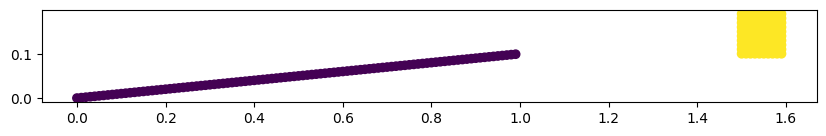

In [31]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1], c=labels)
ax.set_aspect('equal', 'box')
plt.show()

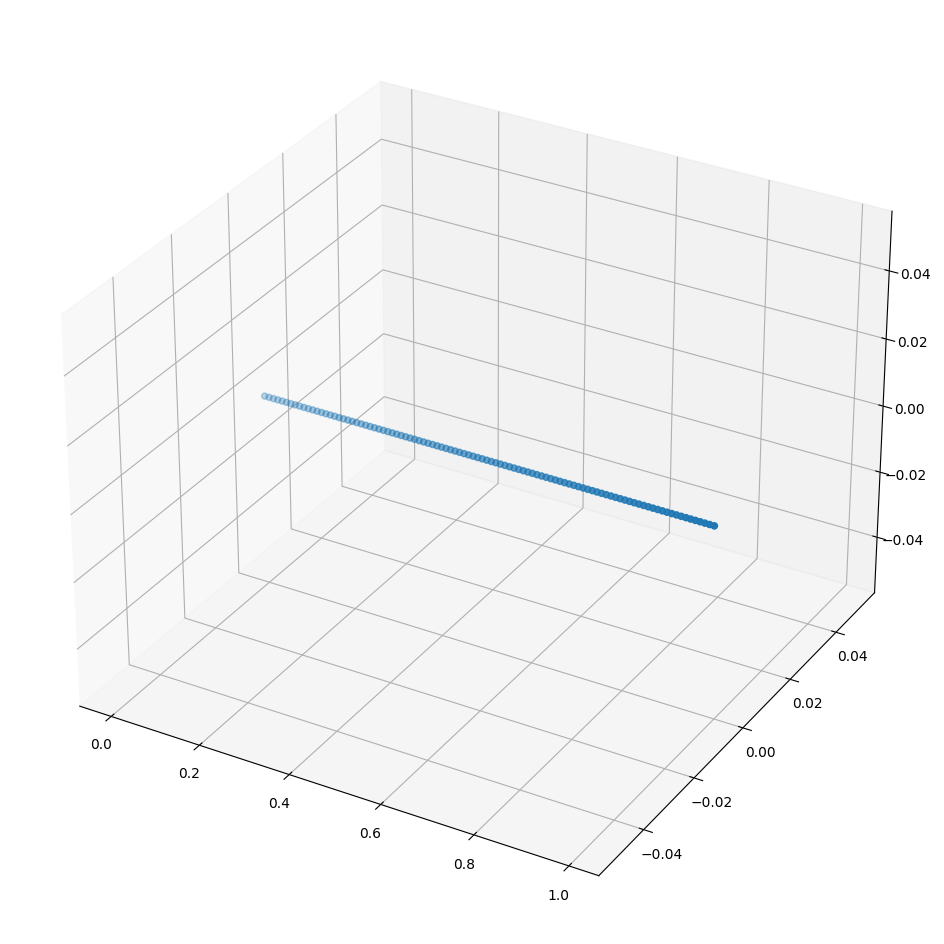

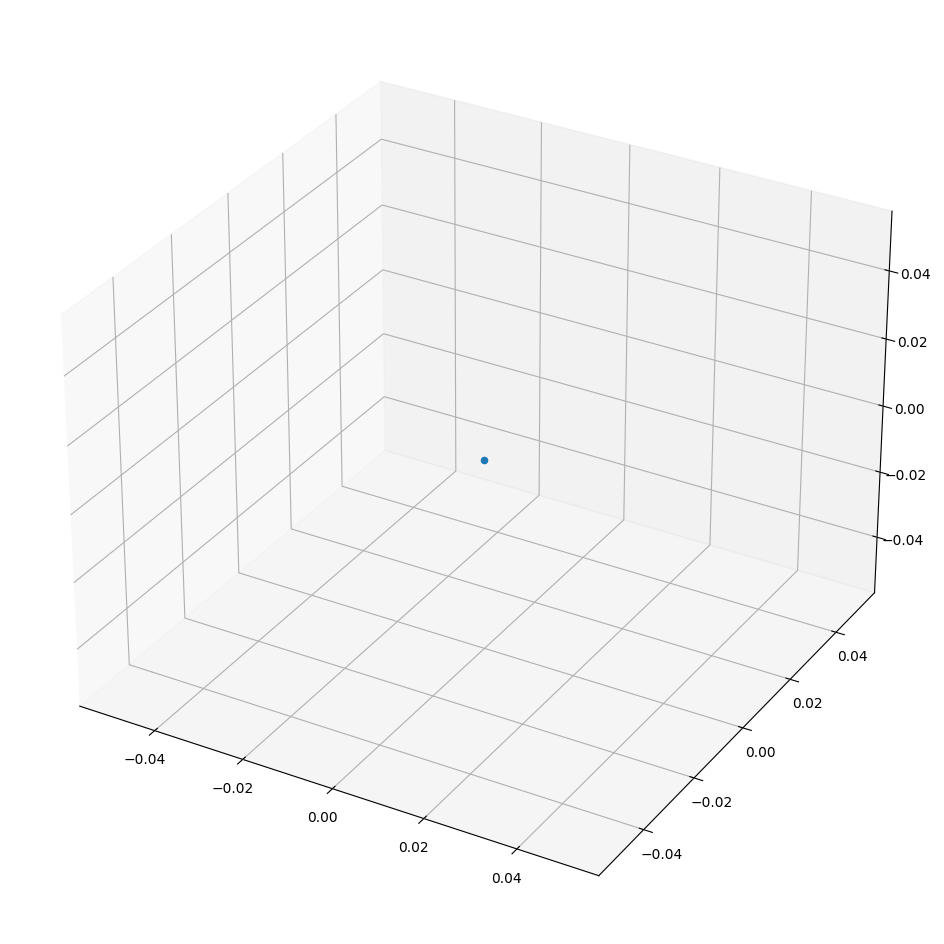

In [35]:
points_x = [[], []]
volumes = [1, 1]
    
volumes = np.array(volumes)

index = []
for i in range(100):
    points_x[0].append([i/100, 0])
points_x[0] = np.array(points_x[0])
points_x[1].append([0,0])
points_x[1] = np.array(points_x[1])
# print(points_x)
for i in range(2):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(projection='3d')
    ax.scatter(points_x[i][:,0], points_x[i][:,1])
    plt.show()

In [36]:
d_y, i_y = generate_d([points_y])
mu_y = [1/d_y.shape[0]] * d_y.shape[0]
mu_y = np.array(mu_y)

In [37]:
d_x, i_x = generate_d(points_x)
mu_x = [1/200]*100 + [1/2]
# mu_x = [1/d_x.shape[0]] * d_x.shape[0]
mu_x = np.array(mu_x)

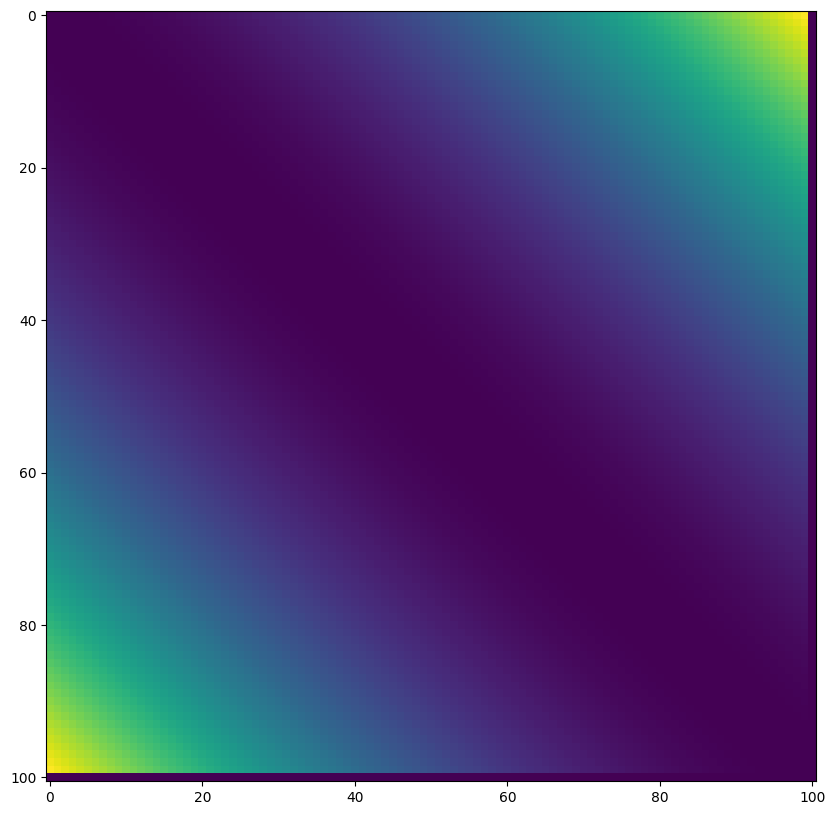

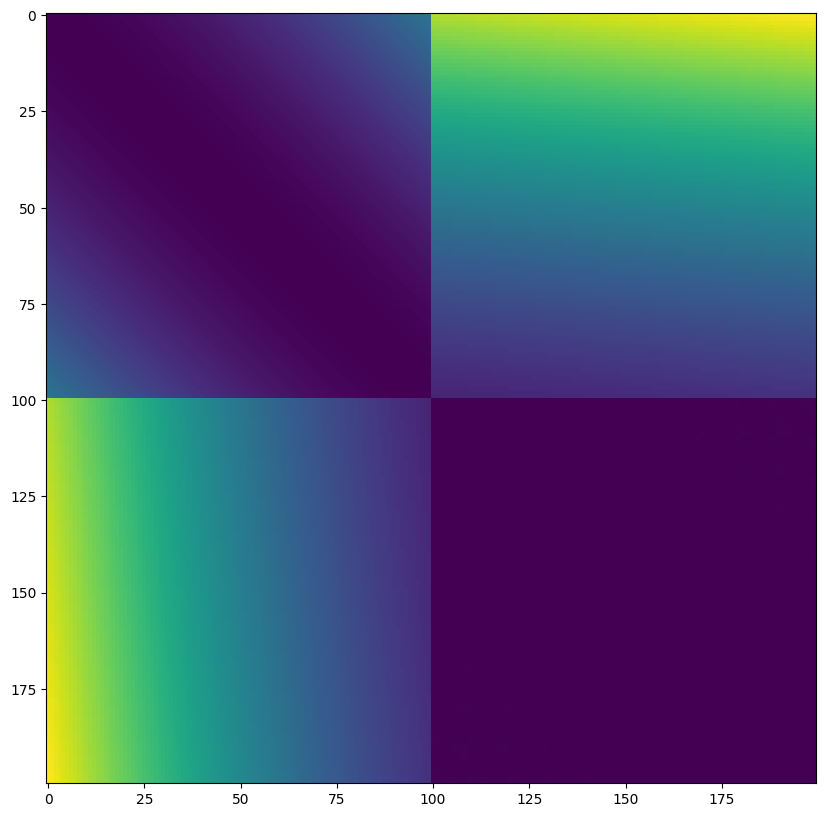

In [38]:
plt.imshow(d_x)
plt.show()
plt.imshow(d_y)
plt.show()

In [26]:
mu_y.shape

(2471,)

1.0000000000000002
#####
0
2.552413919267749
0.6445236894274933
1.0


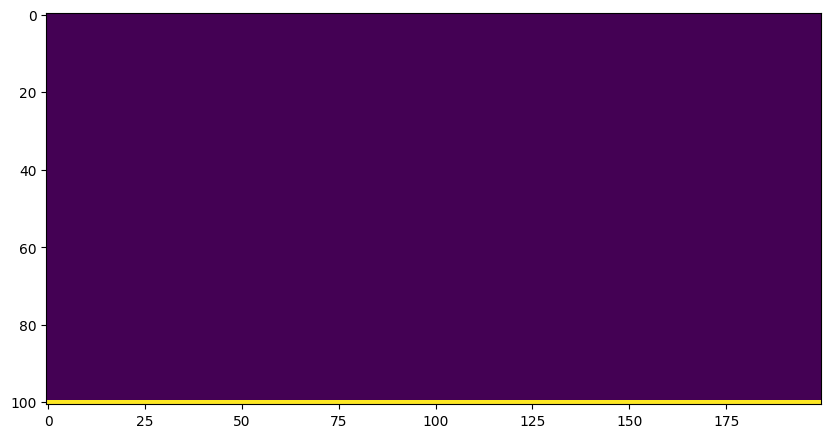

0.40442347526550293


C:\Users\artaj\AppData\Local\Programs\Python\Python310\lib\site-packages\ot\bregman.py:535: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn("Sinkhorn did not converge. You might want to "


#####
1
1.9391277464741379
0.9660754119883568
1.0


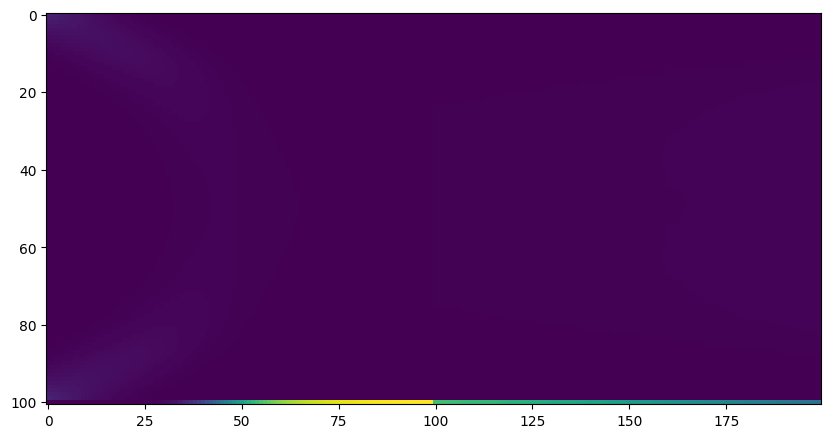

0.9669604301452637
#####
2
2.6592264545321767
0.34481045143987354
0.9999999999999994


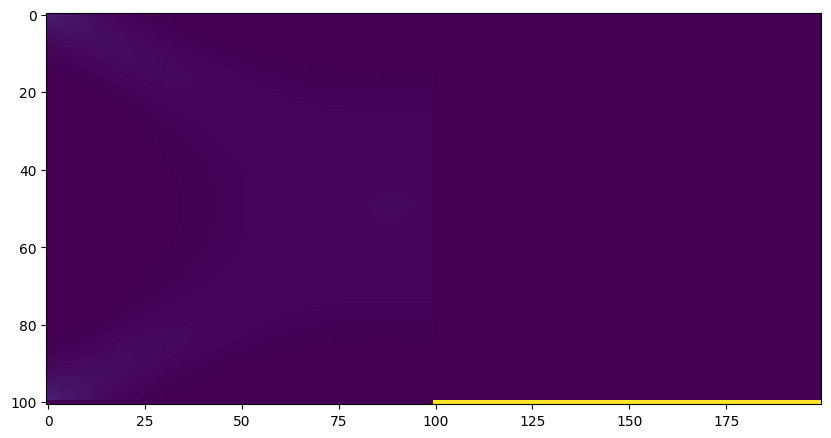

0.919196605682373
#####
3
2.6128170757889793
3.88060306788673e-05
0.9999999999999998


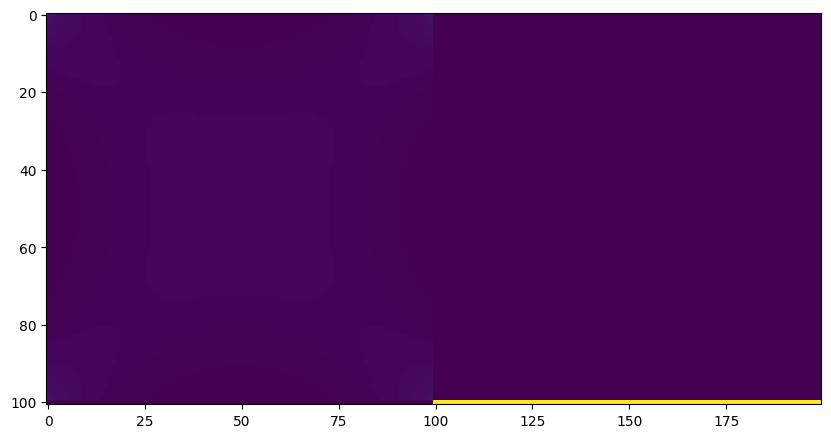

0.8401505947113037
#####
4
2.6127738104057334
1.37281086131283e-05
1.0000000000000007


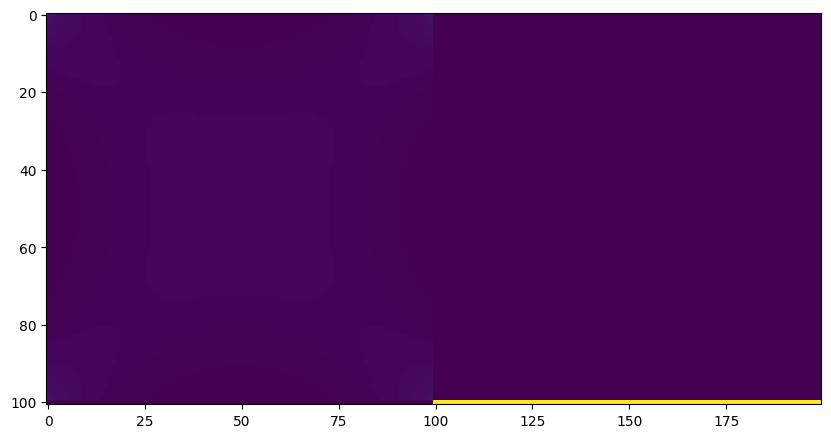

0.8849437236785889
#####
5
2.612771144911095
4.422461014207667e-09
1.0000000000000004


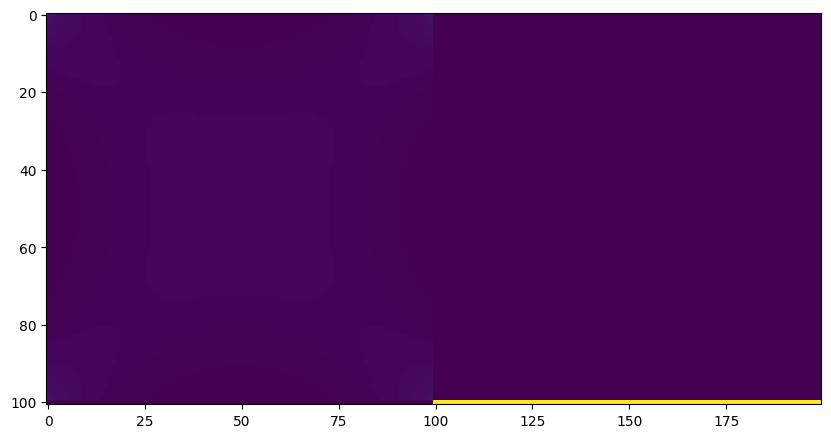

0.8506038188934326
#####
6
2.6127711404871525
1.3234384944644317e-09
0.9999999999999996


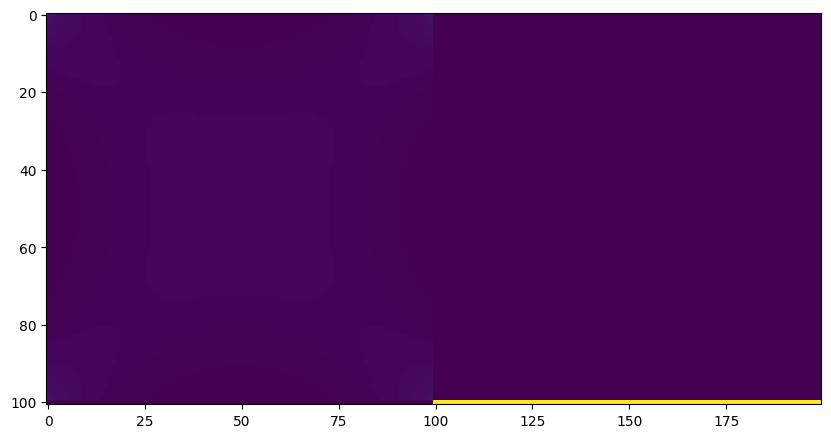

0.9421250820159912
#####
7
2.612771140229705
7.723072800747611e-13
1.0000000000000004


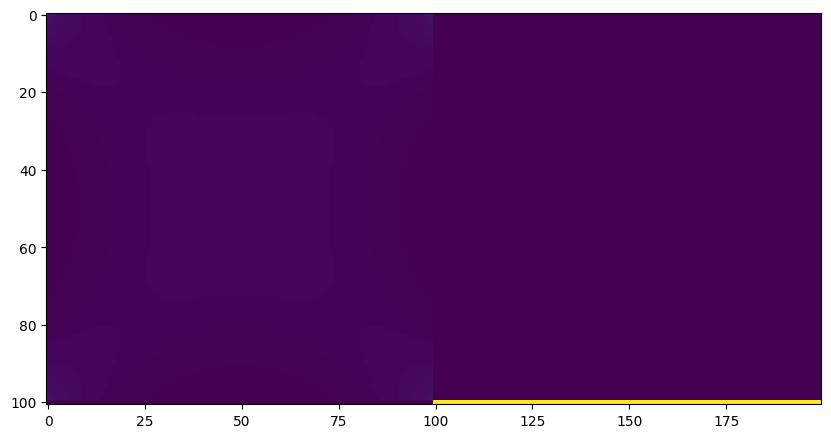

0.9330074787139893
#####
8
2.612771140228775
1.8502745118127807e-12
1.0000000000000004


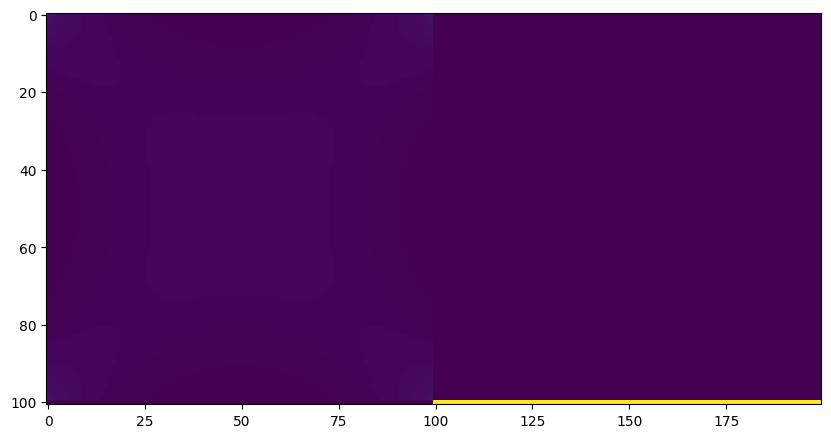

0.8842658996582031
#####
9
2.6127711402268847
7.198488925598726e-12
1.0000000000000004


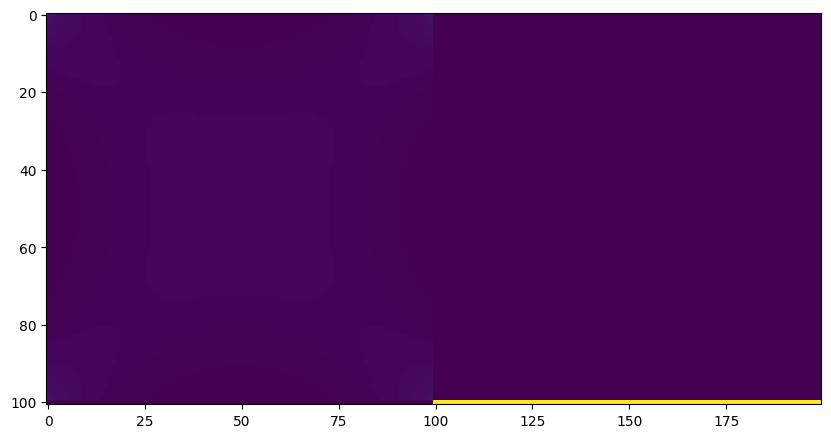

0.7414929866790771
#####
10
2.6127711402196114
2.8066731699450364e-11
0.9999999999999999


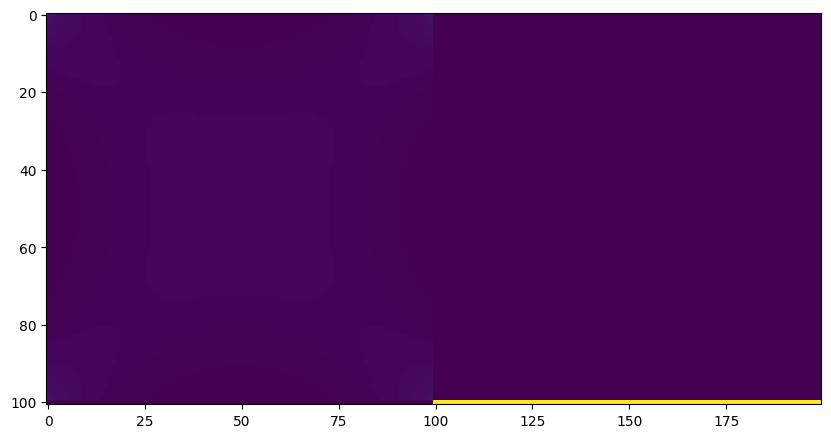

0.8306169509887695
#####
11
2.6127711401912515
1.0942894027545891e-10
0.9999999999999998


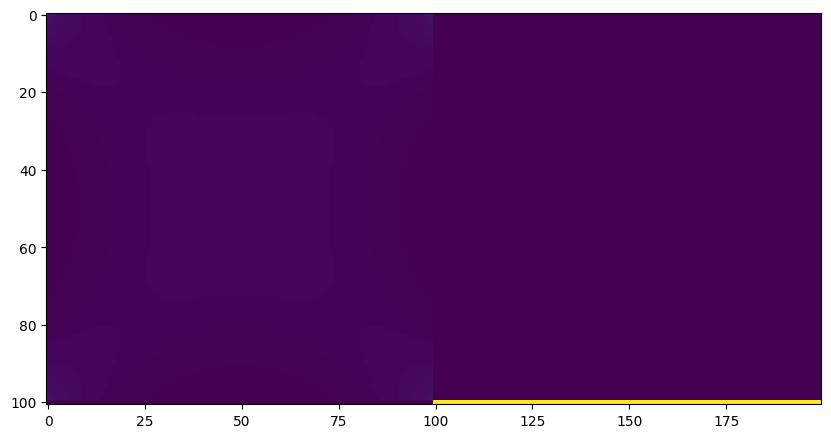

0.9912645816802979
#####
12
2.6127711400806795
4.2665575452643064e-10
1.0000000000000007


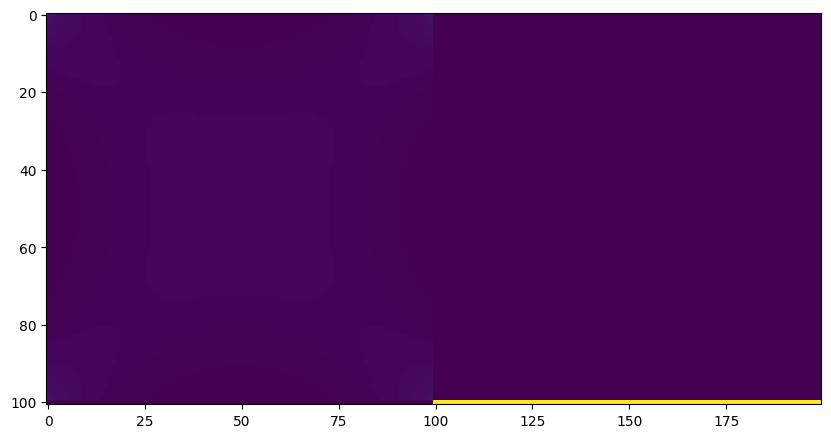

0.948925256729126
#####
13
2.612771139649567
1.6635003089654558e-09
1.0000000000000004


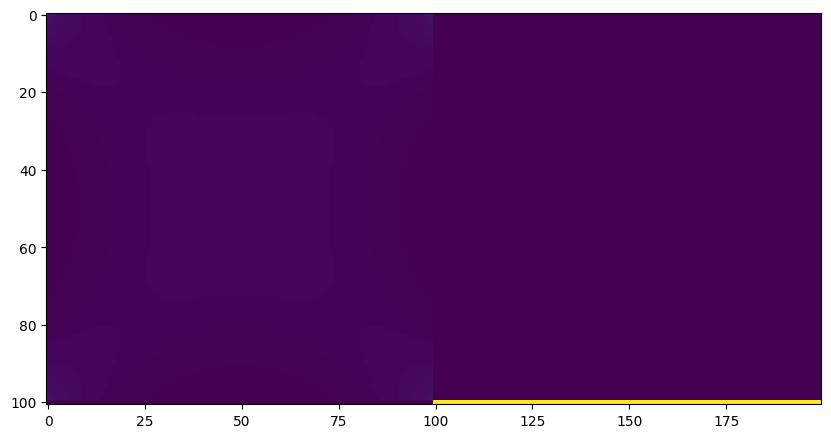

0.8768911361694336
#####
14
2.6127711379686853
6.485880610855322e-09
1.0000000000000007


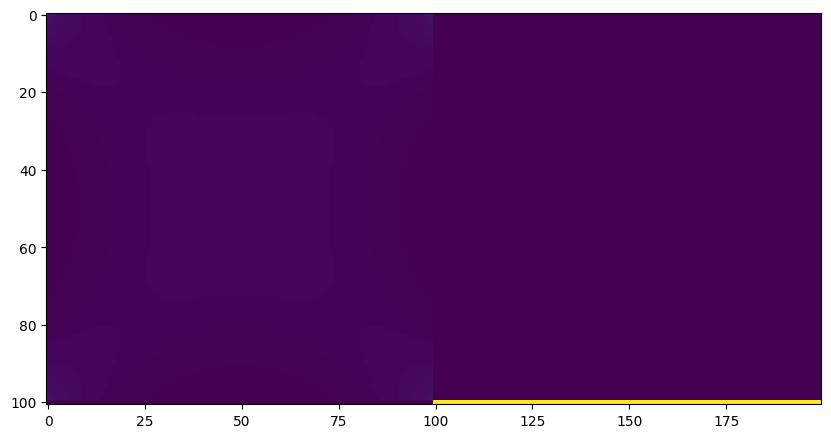

0.8566024303436279
#####
15
2.612771131415035
2.5288032290262135e-08
0.9999999999999998


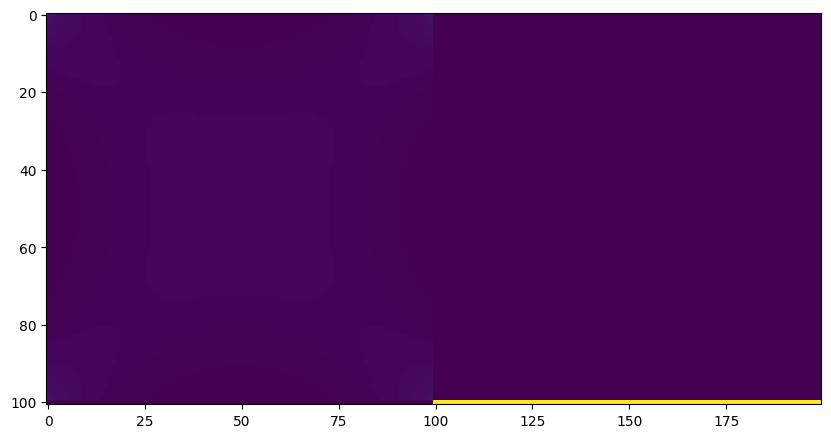

0.91290283203125
#####
16
2.6127711058627754
9.859641152400239e-08
1.0000000000000004


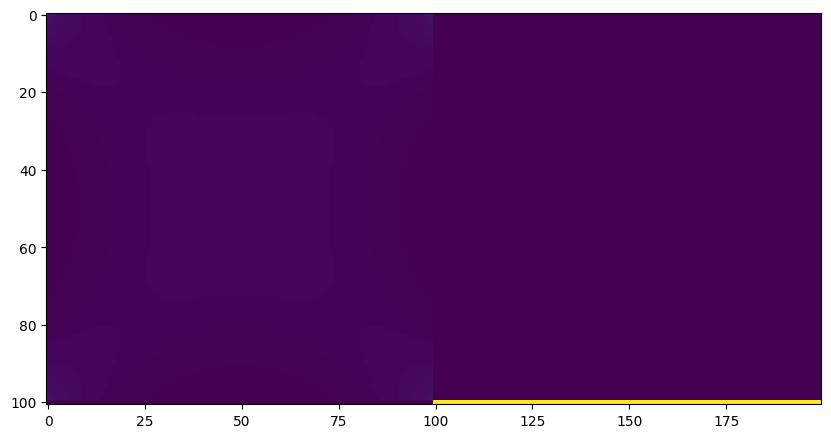

0.857691764831543
#####
17
2.6127710062361595
3.8442107269674397e-07
1.0000000000000004


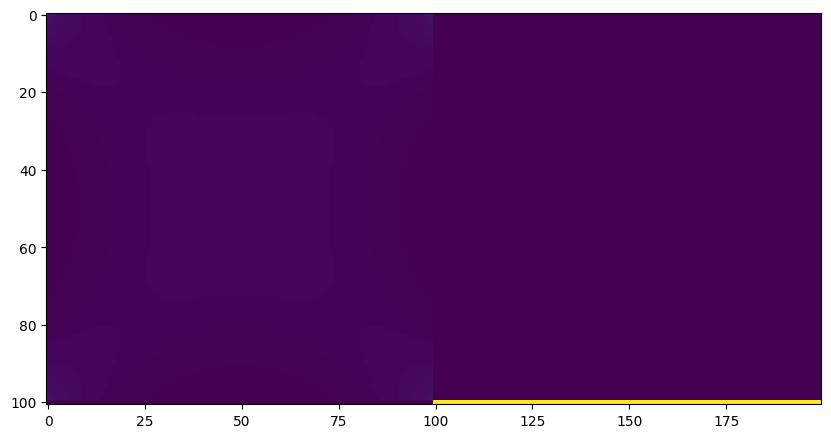

0.8578016757965088
#####
18
2.6127706177984575
1.4988330705229686e-06
0.9999999999999998


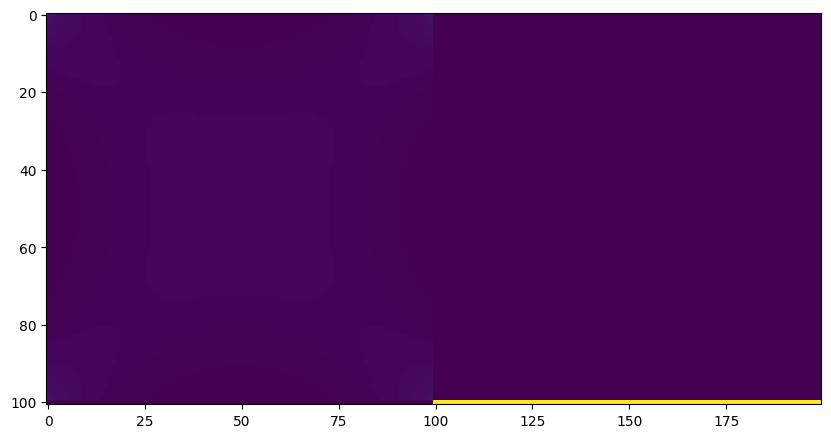

0.843717098236084
#####
19
2.612769103305911
5.843853880604526e-06
0.9999999999999994


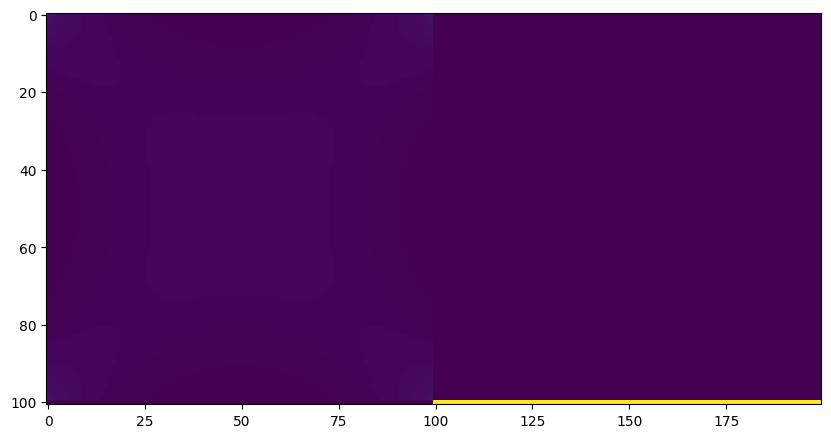

0.8480668067932129
#####
20
2.6127631984135307
2.2784810966812865e-05
1.0000000000000002


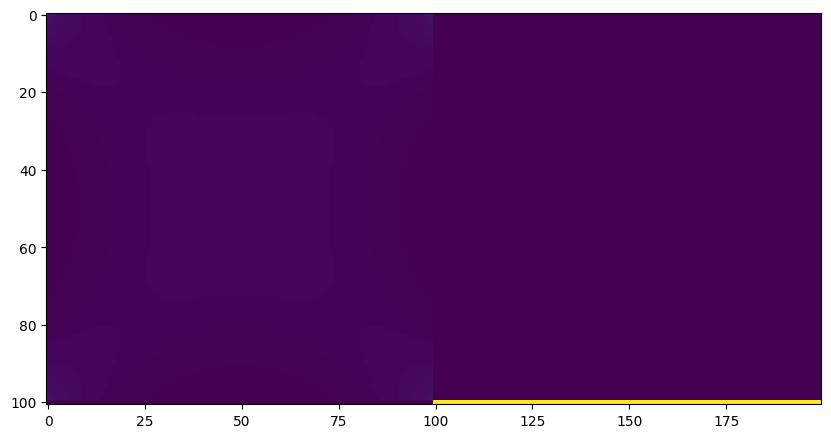

0.884514570236206
#####
21
2.612740175872661
8.883650831034006e-05
1.0000000000000002


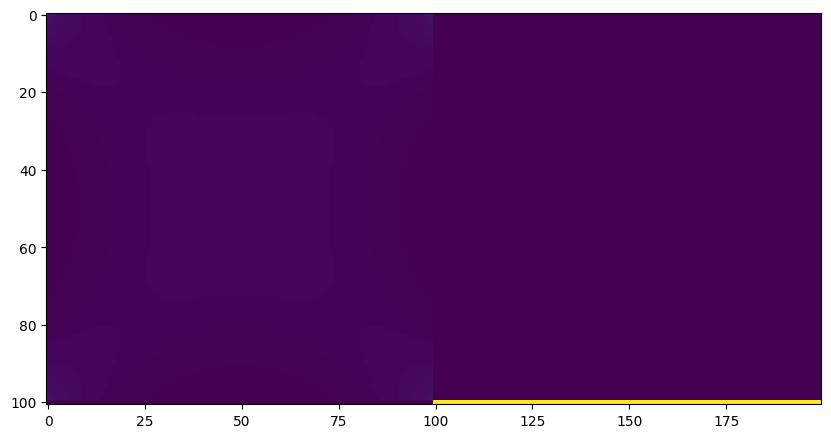

0.882781982421875
#####
22
2.6126504163532687
0.00034636733892362624
1.0


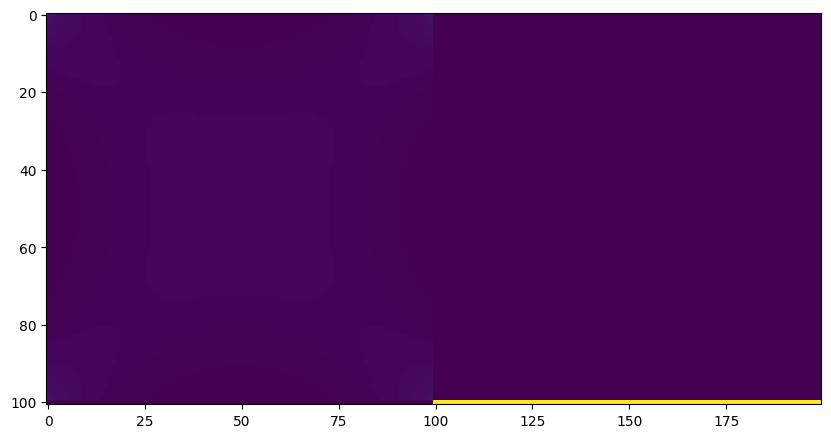

0.8791124820709229
#####
23
2.6123005093790628
0.0013504331509250917
0.9999999999999994


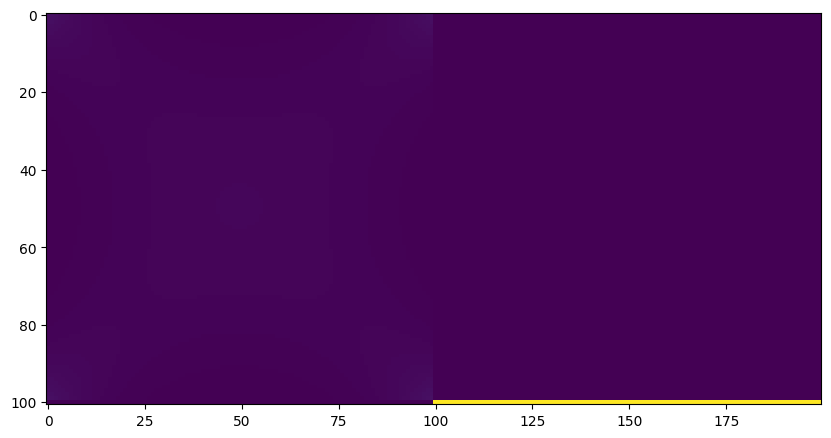

0.9233789443969727
#####
24
2.6109371812947275
0.005263435153835186
1.0000000000000004


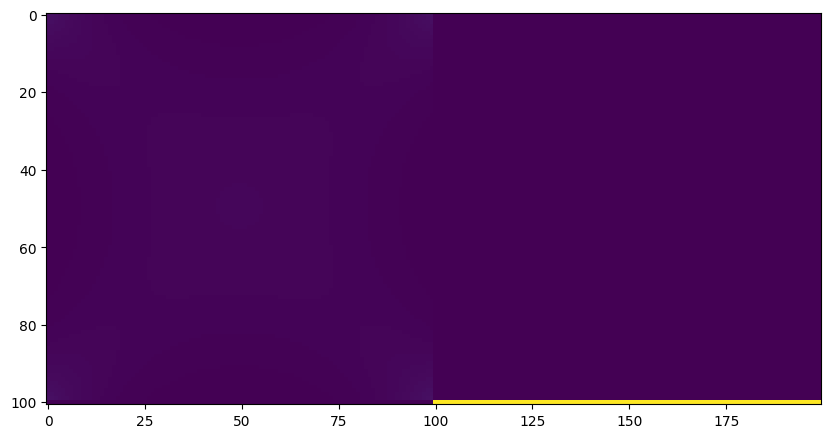

0.8333272933959961
#####
25
2.6055068433244126
0.0204187644265255
1.0000000000000002


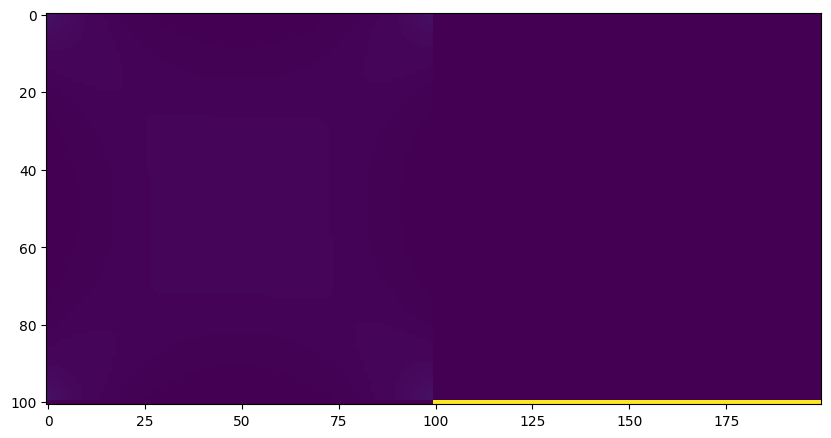

0.7837939262390137
#####
26
2.5833507625640575
0.0740836877418791
0.9999999999999998


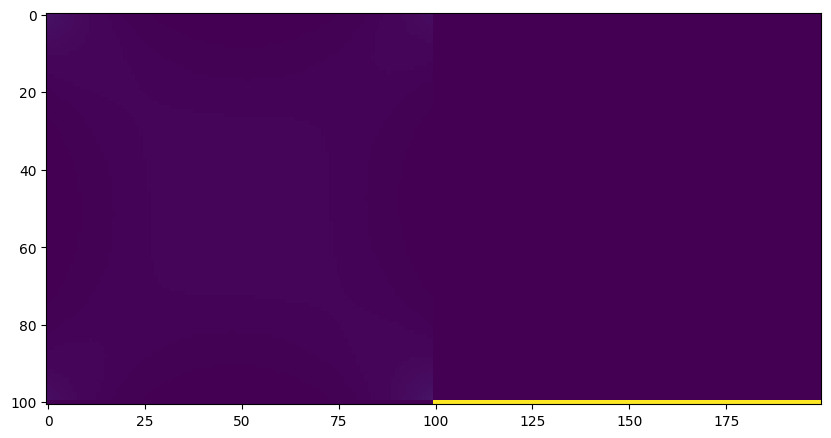

0.8208489418029785
#####
27
2.4962019491787046
0.15962593263252453
1.0000000000000004


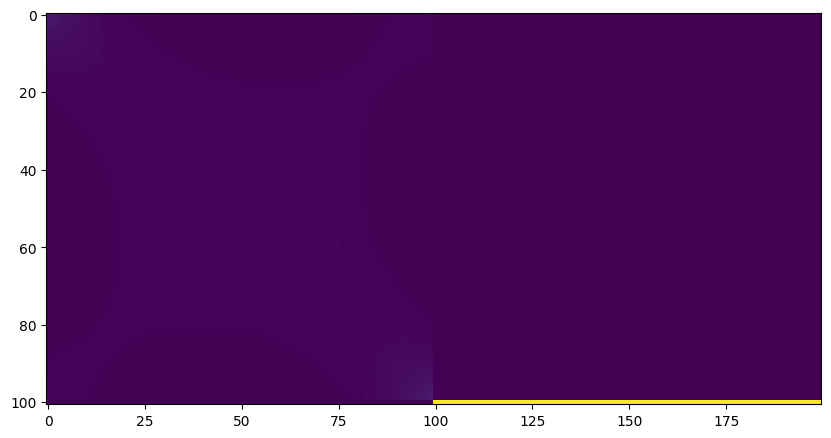

0.867196798324585
#####
28
2.334747449961873
0.11251056252355096
1.0000000000000002


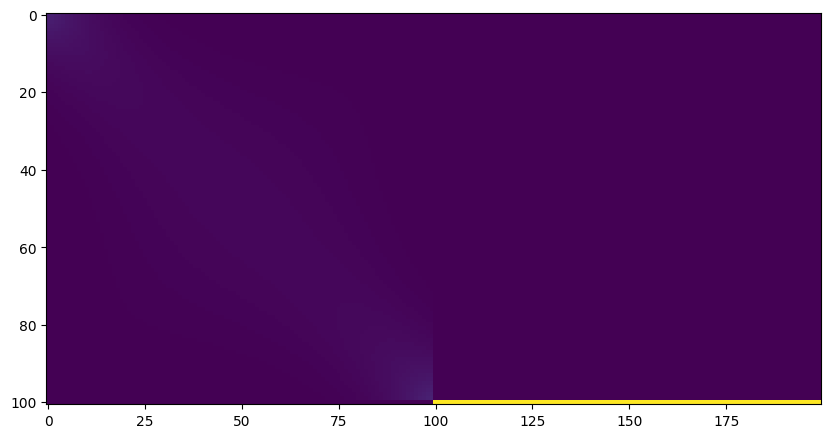

0.8325810432434082
#####
29
2.2772482088923205
0.02592790548302733
1.0000000000000004


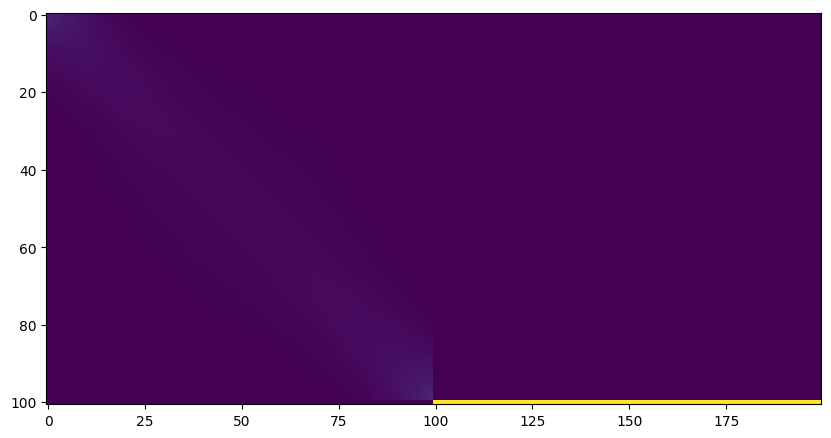

0.8282289505004883
#####
30
2.269460355583055
0.003232680071778331
1.0


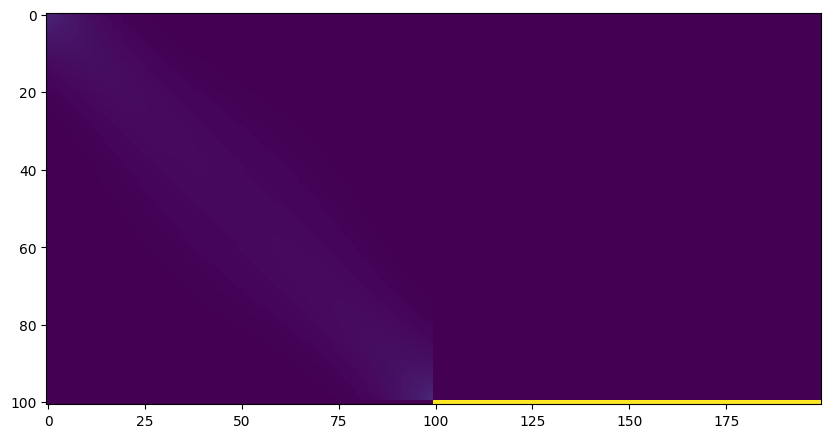

0.8481364250183105
#####
31
2.268588242385148
0.00035958345126196406
1.0000000000000004


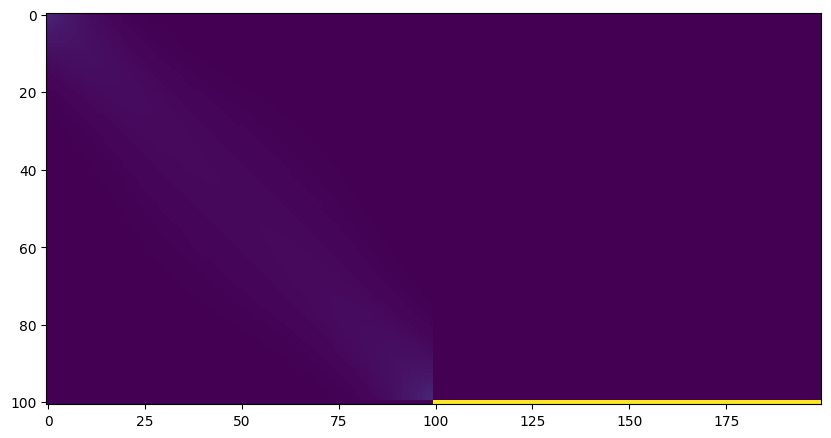

0.9696781635284424
#####
32
2.2684924589496576
3.9462498380807566e-05
1.0


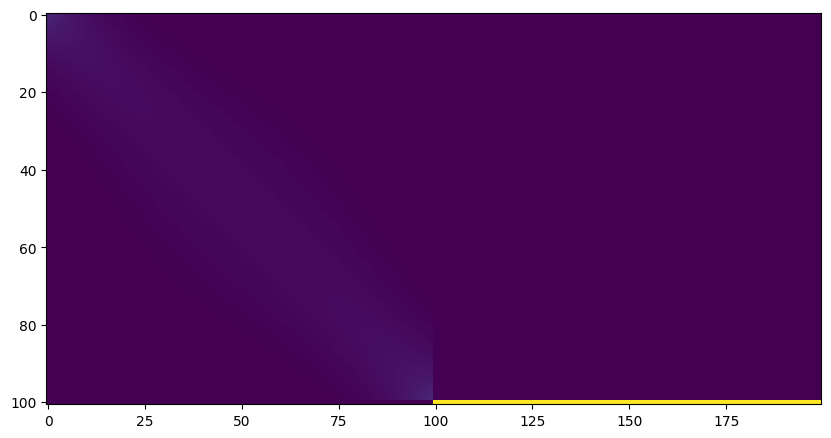

0.8497085571289062
#####
33
2.2684819619748815
4.324372218707554e-06
1.0000000000000007


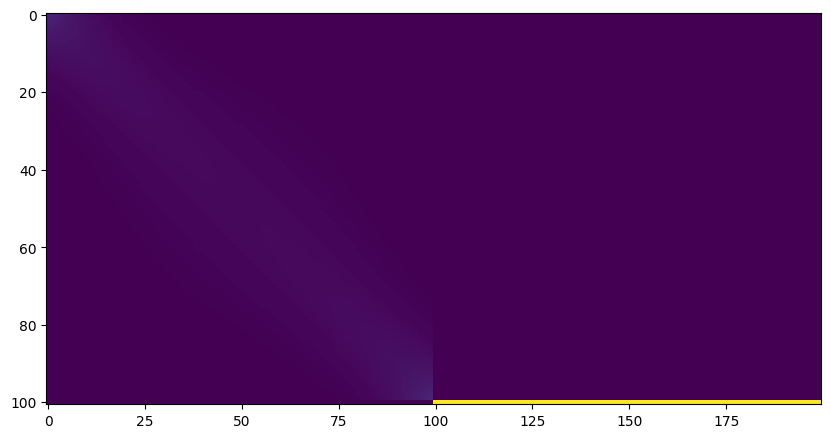

0.809361457824707
#####
34
2.2684808118748028
4.737952303140155e-07
1.0


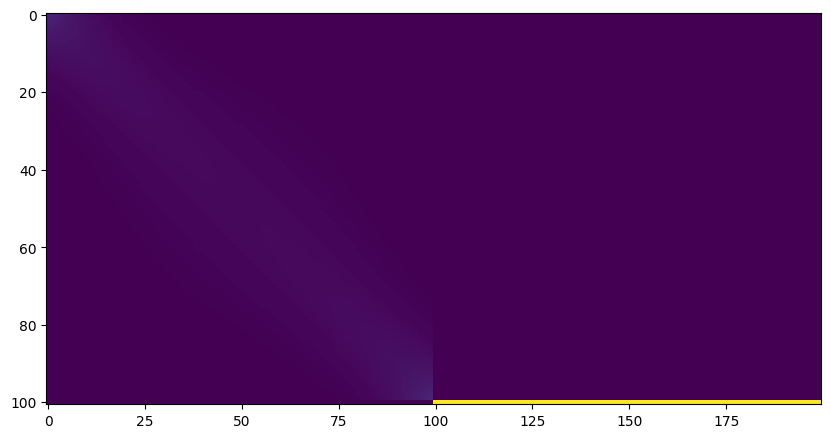

0.7865927219390869
#####
35
2.2684806858674444
5.19099410282017e-08
0.9999999999999997


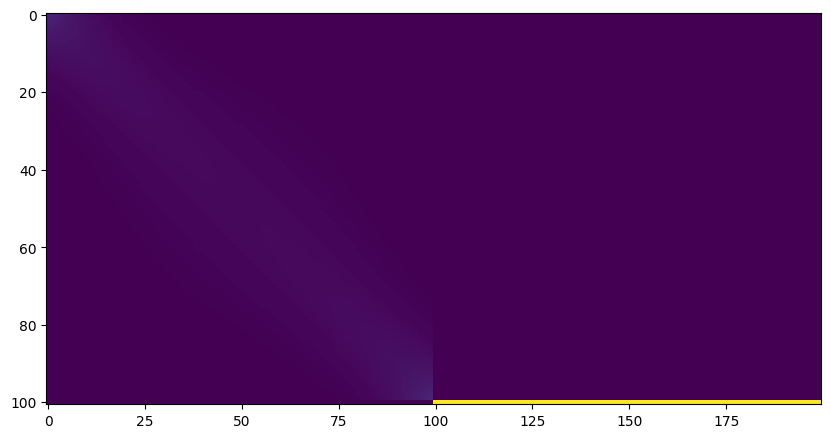

0.8975048065185547
#####
36
2.2684806720618544
5.6873442292515926e-09
0.9999999999999997


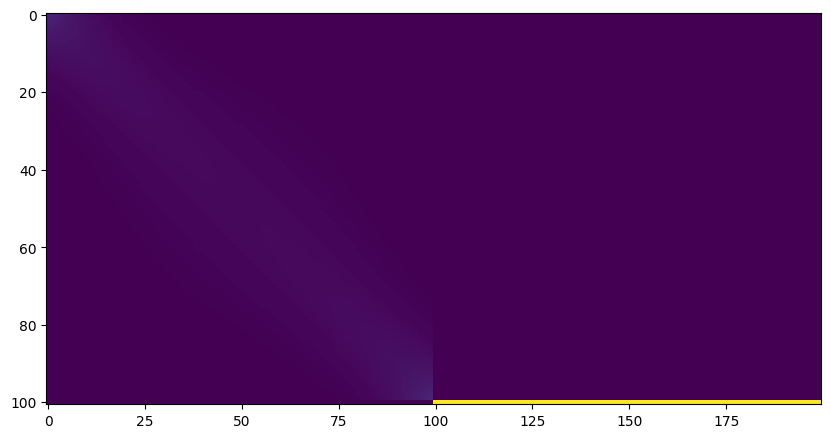

0.908599853515625
#####
37
2.2684806705492906
6.231154360121842e-10
0.9999999999999997


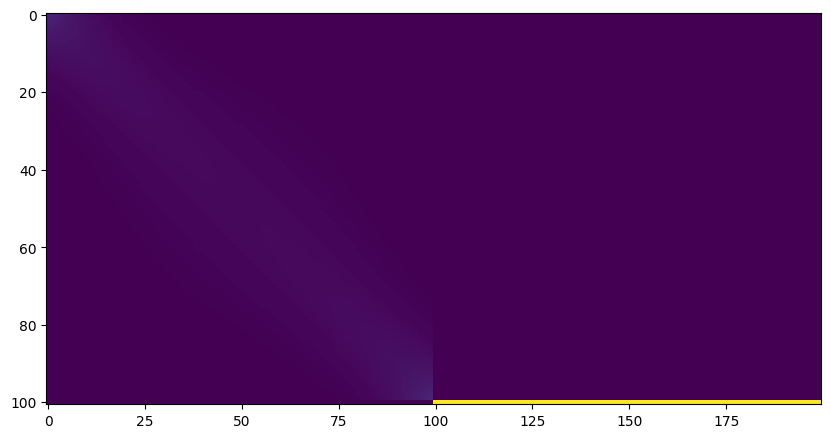

0.9382281303405762
#####
38
2.2684806703835707
6.82699307226205e-11
1.0


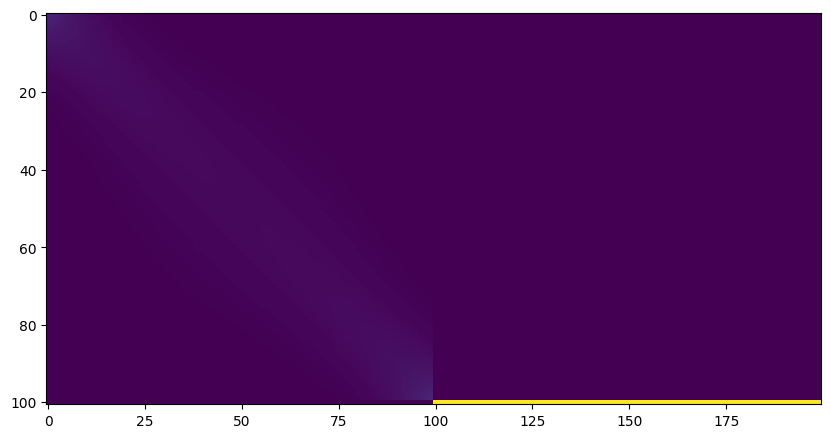

0.858741283416748
#####
39
2.2684806703654137
7.479742667769518e-12
1.0


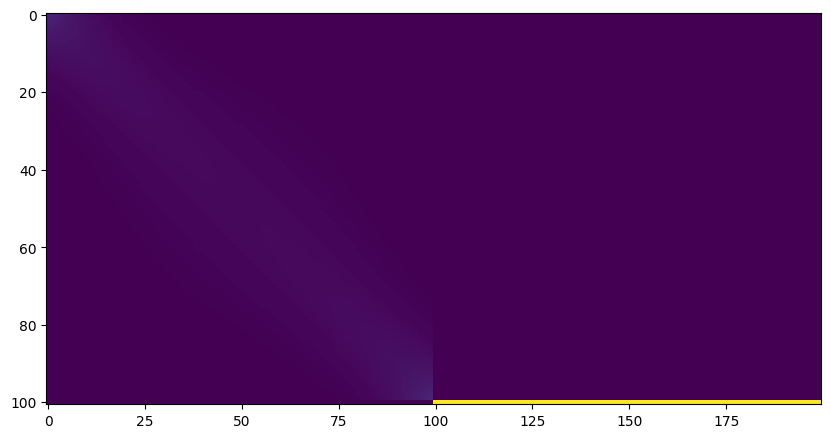

0.8787353038787842
#####
40
2.2684806703634246
8.195754074104061e-13
0.9999999999999998


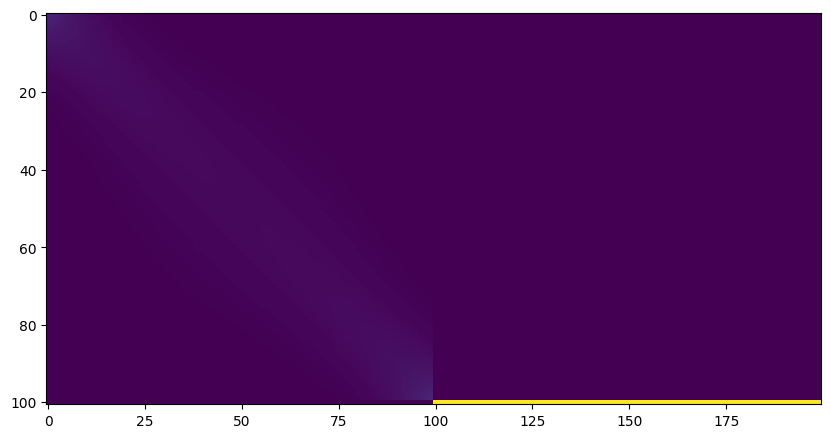

1.2614150047302246
#####
41
2.2684806703632066
8.984339000133027e-14
0.9999999999999999


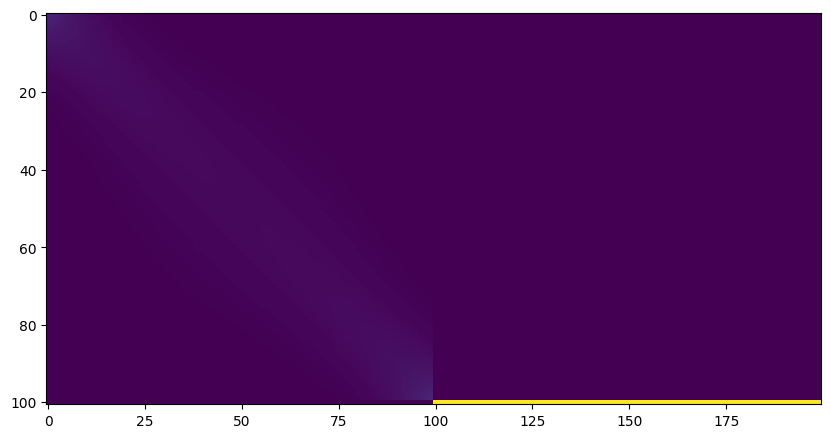

1.2473554611206055
#####
42
2.268480670363183
9.982072460254248e-15
0.9999999999999999


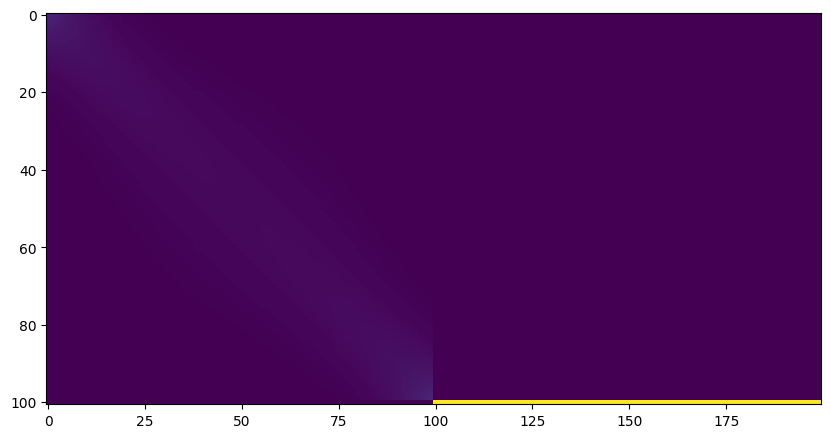

0.8474600315093994
#####
43
2.268480670363181
1.5552506909855135e-15
0.9999999999999999


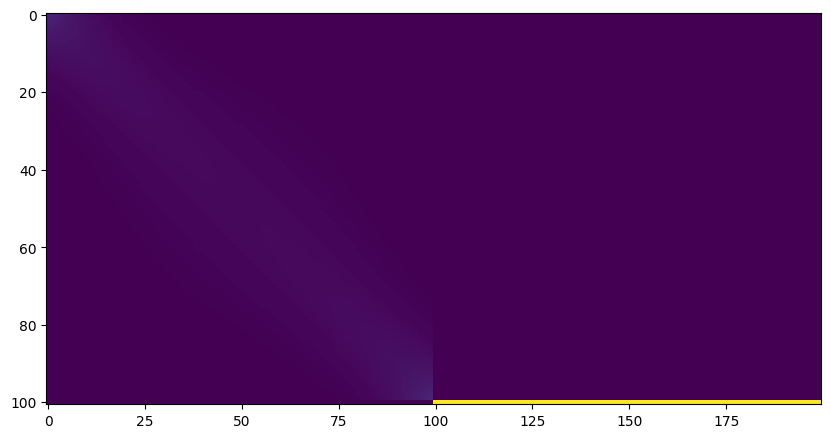

0.8136513233184814
#####
44
2.268480670363181
6.416200040343849e-16
0.9999999999999999


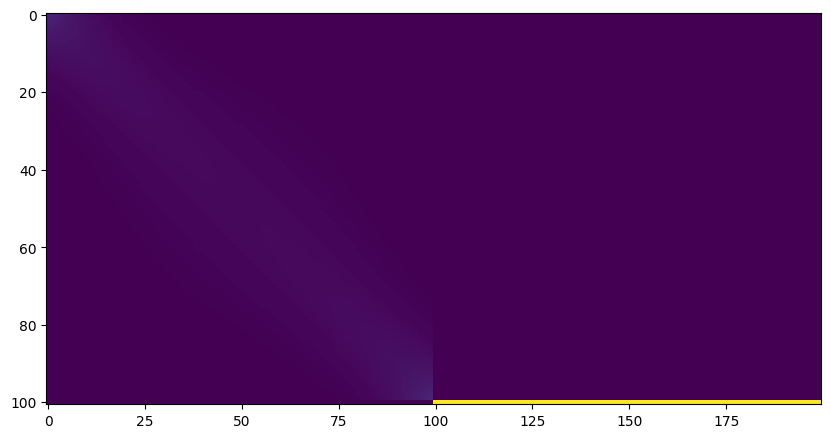

0.9105081558227539
#####
45
2.268480670363181
5.994973164217755e-16
0.9999999999999999


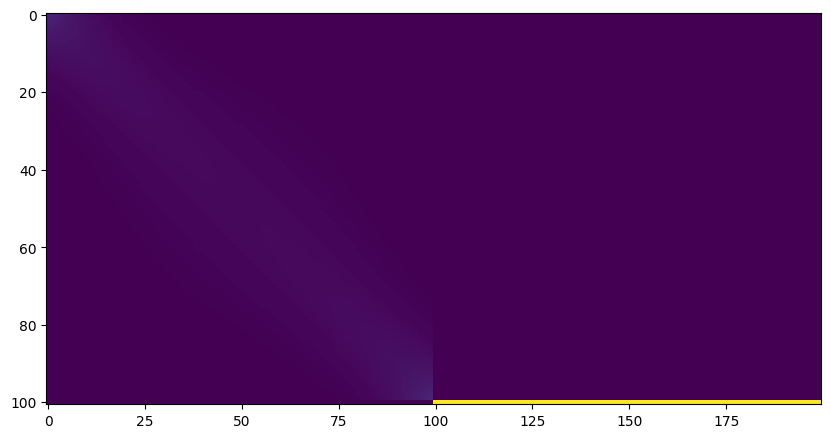

0.897465705871582
#####
46
2.268480670363181
5.894581659358679e-16
0.9999999999999999


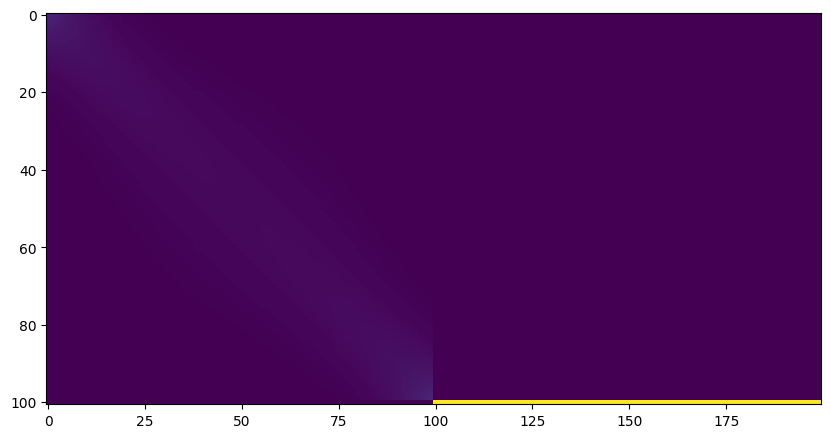

0.93210768699646
#####
47
2.26848067036318
5.700559323211116e-16
0.9999999999999999


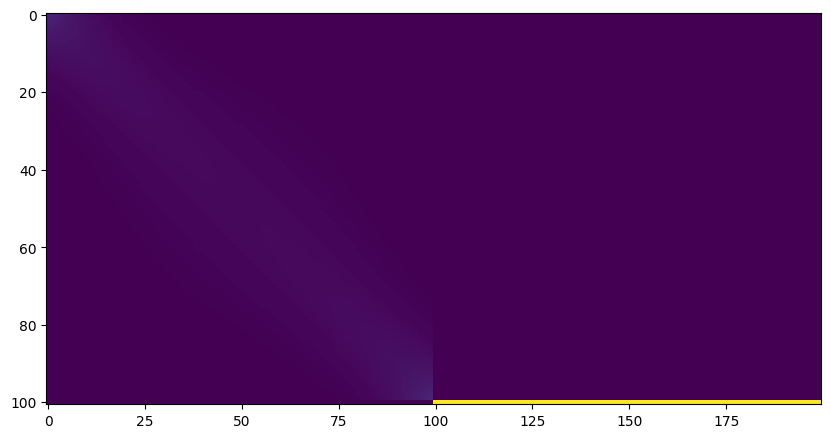

0.9701895713806152
#####
48
2.268480670363181
5.555126710992865e-16
0.9999999999999999


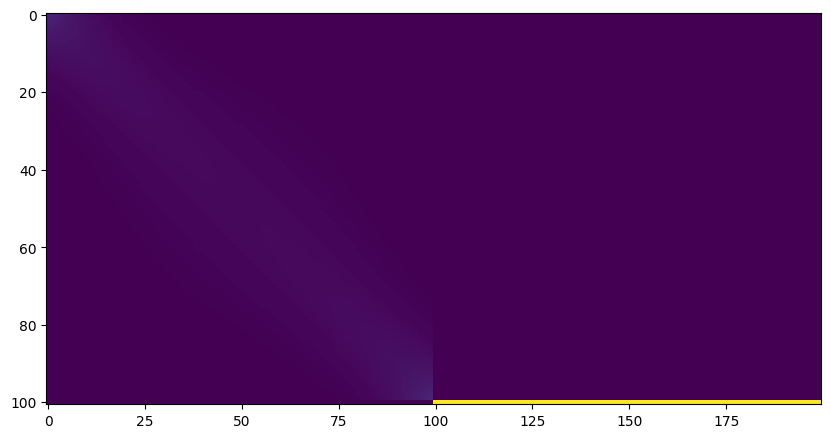

0.8633019924163818
#####
49
2.268480670363181
5.865544224532671e-16
0.9999999999999999


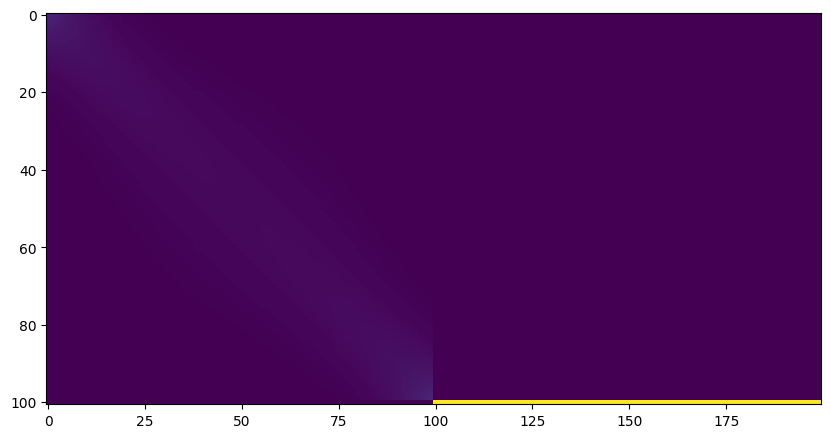

0.9766387939453125


In [61]:
eta = 1
import time
alpha = 1e-2
cur_mu = np.outer(mu_x, mu_y)
print(cur_mu.sum())
dif = []
costs = []
mus = []
for i in range(50):
    t = time.time()
    c = gamma(cur_mu, d_x, i_x, d_y)
    c_o = c
    c -= c.min()
    c = (c**eta) * (cur_mu**(1-eta))
    
#     plt.imshow(c)
#     plt.show()
#     print(c)
    
    
    k = 1/c.sum() *c.shape[0] * c.shape[1]
    c = c*k
    alpha1=alpha*k
    mu = ot.sinkhorn(mu_x, mu_y, c, alpha1)
    print('#####')
    print(i)
    print(k)
    print(abs(mu - cur_mu).sum())
    print(mu.sum())
    dif.append(abs(mu - cur_mu).sum())
    costs.append(cost(c_o, cur_mu))
    plt.imshow(cur_mu)
    plt.show()
#     plt.imshow(c)
    plt.show()
    cur_mu = mu
#     if dif[-1] < 1e-4:
#         cur_mu = np.random.rand(mu.shape[0], mu.shape[1])
#         cur_mu /= cur_mu.sum()
    mus.append(cur_mu)
    print(time.time() - t)

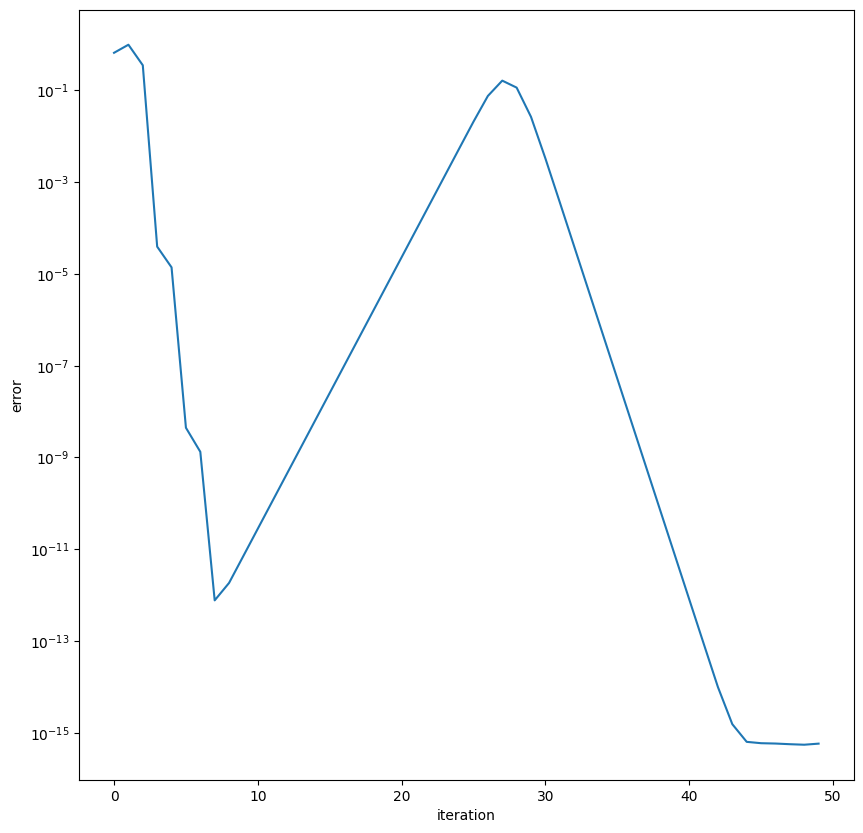

In [62]:
plt.plot(dif)
plt.yscale('log')
plt.ylabel('error')
plt.xlabel('iteration')
plt.show()

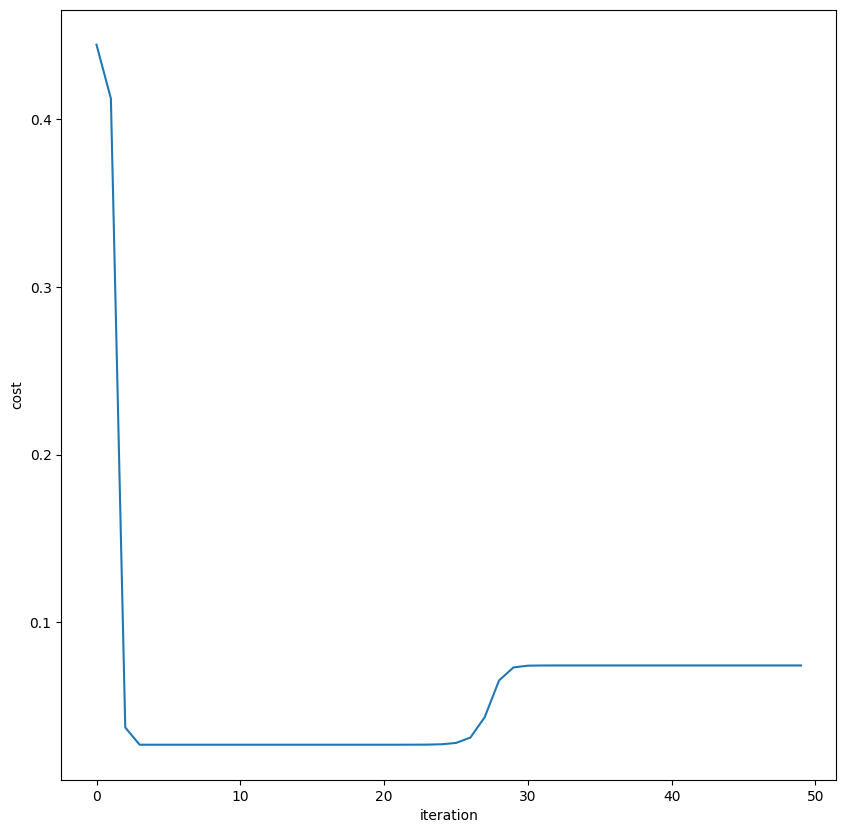

In [63]:
plt.plot(costs)
plt.ylabel('cost')
plt.xlabel('iteration')
plt.show()

In [56]:
mus[-1]

array([[2.50000447e-05, 2.50000434e-05, 2.50000422e-05, ...,
        2.50000006e-05, 2.50000007e-05, 2.50000008e-05],
       [2.50000429e-05, 2.50000417e-05, 2.50000405e-05, ...,
        2.50000006e-05, 2.50000006e-05, 2.50000007e-05],
       [2.50000411e-05, 2.50000400e-05, 2.50000388e-05, ...,
        2.50000005e-05, 2.50000006e-05, 2.50000007e-05],
       ...,
       [2.50000429e-05, 2.50000417e-05, 2.50000405e-05, ...,
        2.50000006e-05, 2.50000006e-05, 2.50000007e-05],
       [2.50000447e-05, 2.50000434e-05, 2.50000422e-05, ...,
        2.50000006e-05, 2.50000007e-05, 2.50000008e-05],
       [2.49999848e-03, 2.49999852e-03, 2.49999857e-03, ...,
        2.49999998e-03, 2.49999998e-03, 2.49999997e-03]])

0.0001


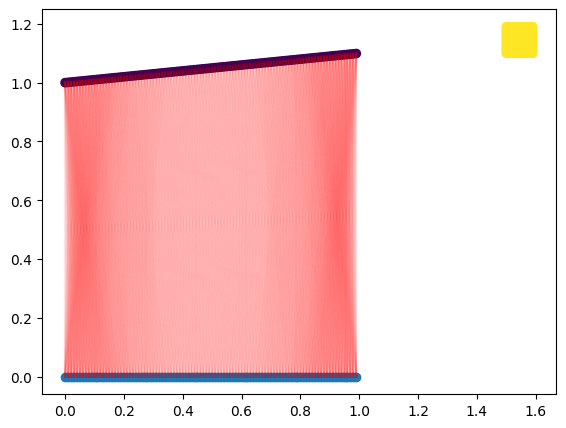

In [70]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 1, c=labels)
ax.scatter(points_x[0][:,0], points_x[0][:,1])
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(mus[-1].shape[0] - 1):
    for j in range(mus[-1].shape[1]):
        if mus[-1][i,j] > thresh:
#             print(i,j)
            ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 1,points_x[0][i, 1]), 'r-', 
                    alpha=1*mus[-1][i][j]/mus[-1].max())

plt.show()

In [76]:
from unbalancedgw.vanilla_ugw_solver import exp_ugw_sinkhorn
from unbalancedgw.vanilla_ugw_solver import log_ugw_sinkhorn
from unbalancedgw._vanilla_utils import ugw_cost
from unbalancedgw.utils import generate_measure
from unbalancedgw._vanilla_utils import l2_distortion

In [ ]:
def ugw(x, y, z, x1, y1, z1, init=None, eps=4000,
                             rho=100000, rho2=100000,
                             nits_plan=100, tol_plan=1e-10,
                             nits_sinkhorn=100, tol_sinkhorn=1e-10):
    a = [1/len(x)] * len(x)
    b = [1/len(x1)] * len(x1)
    n = len(x)
    dx = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            dx[i][j] = (x[i] - x[j])**2 + (y[i] - y[j])**2 + (z[i] - z[j])**2

    n = len(x1)
    dy = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            dy[i][j] = (x1[i] - x1[j])**2 + (y1[i] - y1[j])**2 + (z1[i] - z1[j])**2

    a = torch.from_numpy(np.array(a))
    b = torch.from_numpy(np.array(b))
    dx = torch.from_numpy(np.array(dx))
    dy = torch.from_numpy(np.array(dy))

    pi, gamma = log_ugw_sinkhorn(a, dx, b, dy, init=init, eps=eps,
                                 rho=rho, rho2=rho2,
                                 nits_plan=nits_plan, tol_plan=tol_plan,
                                 nits_sinkhorn=nits_sinkhorn, tol_sinkhorn=tol_sinkhorn,
                                 two_outputs=True)

    return pi, gamma, float(l2_distortion(pi, gamma, dx, dy))

In [75]:
d_x[1:100][1:100].shape

(98, 101)

In [76]:
d_x.shape

(101, 101)

In [77]:
a = [1/points_x[0].shape[0]] * points_x[0].shape[0]
b = [1/points_y.shape[0]] * points_y.shape[0]
n = points_x[0].shape[0]
dx = np.zeros((n, n))
for i in range(n):
    for j in range(n):
        dx[i][j] = np.linalg.norm(points_x[0][i] - points_x[0][j])

n = points_y.shape[0]
dy = np.zeros((n, n))
for i in range(n):
    for j in range(n):
        dy[i][j] = np.linalg.norm(points_y[i] - points_y[j])

a = torch.from_numpy(np.array(a))
b = torch.from_numpy(np.array(b))
dx = torch.from_numpy(np.array(dx))
dy = torch.from_numpy(np.array(dy))

In [83]:
dy.shape

torch.Size([200, 200])

In [107]:
eps=1
rho=10000
rho2=10000
nits_plan=100
tol_plan=1e-10
nits_sinkhorn=100
tol_sinkhorn=1e-10

In [113]:
pi, gamma = log_ugw_sinkhorn(a, dx, b, dy, eps=1e-1, two_outputs=True)

In [114]:
pi

tensor([[1.5911e-04, 1.5587e-04, 1.5268e-04,  ..., 3.2435e-05, 3.2766e-05,
         3.3187e-05],
        [1.4928e-04, 1.4652e-04, 1.4380e-04,  ..., 3.3280e-05, 3.3602e-05,
         3.4010e-05],
        [1.3993e-04, 1.3761e-04, 1.3531e-04,  ..., 3.4139e-05, 3.4450e-05,
         3.4845e-05],
        ...,
        [1.3993e-04, 1.3761e-04, 1.3531e-04,  ..., 3.4139e-05, 3.4450e-05,
         3.4845e-05],
        [1.4928e-04, 1.4652e-04, 1.4380e-04,  ..., 3.3280e-05, 3.3602e-05,
         3.4010e-05],
        [1.5911e-04, 1.5587e-04, 1.5268e-04,  ..., 3.2435e-05, 3.2766e-05,
         3.3187e-05]], dtype=torch.float64)

5e-05


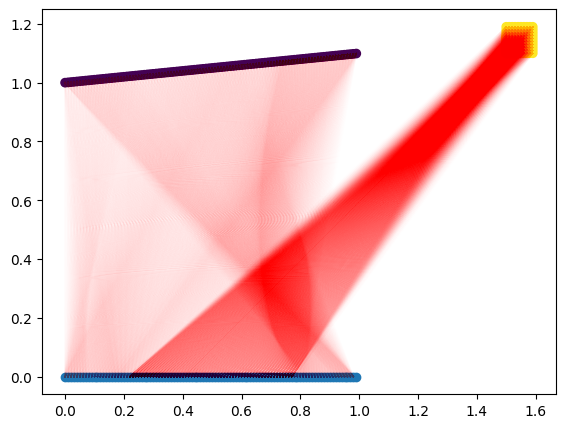

In [120]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 1, c=labels)
ax.scatter(points_x[0][:,0], points_x[0][:,1])
ax.set_aspect('equal', 'box')

thresh = 1/20000
print(thresh)
for i in range(pi.shape[0] - 1):
    for j in range(pi.shape[1]):
        if pi[i,j] > thresh:
#             print(i,j)
            ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 1,points_x[0][i, 1]), 'r-', 
                    alpha=0.01*float(pi[i][j])/float(pi.max()))

plt.show()

In [101]:
pi.max()

tensor(5.1641e-05, dtype=torch.float64)

In [105]:
pi[0][0] > 0

tensor(True)

In [164]:
b = 1
var = 0.1
arc_size = 200
sq_size = 100


theta = np.random.uniform(0, math.pi, arc_size)
r = b*theta + np.random.normal(0, var, arc_size)
x = np.cos(theta)*r
y = np.sin(theta)*r

mu_y = []
points_y = []
labels = []
for i in range(arc_size):
    mu_y.append(1/(arc_size + sq_size))
    points_y.append([x[i], y[i]])
    labels.append(1)
    
x = np.random.normal(0, 0.1, sq_size)
y = np.random.normal(0, 0.1, sq_size)
for i in range(sq_size):
    mu_y.append(1/(arc_size + sq_size))
    points_y.append([1.5+x[i], 0.5+y[i]])
    labels.append(2)
points_y = np.array(points_y)

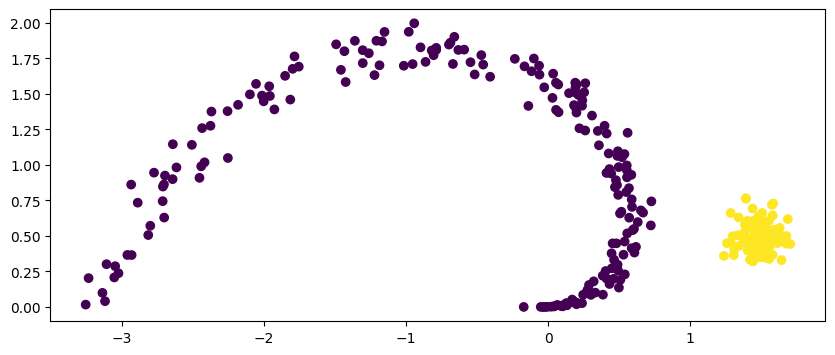

In [165]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1], c=labels)
ax.set_aspect('equal', 'box')
plt.show()

In [166]:
b = 1
var = 0.1
arc_size = 200
sq_size = 100


theta = np.random.uniform(0, math.pi, arc_size)
r = b*theta + np.random.normal(0, var, arc_size)
x = np.cos(theta)*r
y = np.sin(theta)*r

points_x = [[], []]
mu_x=[]
for i in range(arc_size):
    mu_x.append(1/(arc_size + sq_size))
    points_x[0].append([x[i], y[i]])
points_x[1].append([0,0])
mu_x.append(sq_size/(arc_size+sq_size))
points_x[0] = np.array(points_x[0])
points_x[1] = np.array(points_x[1])

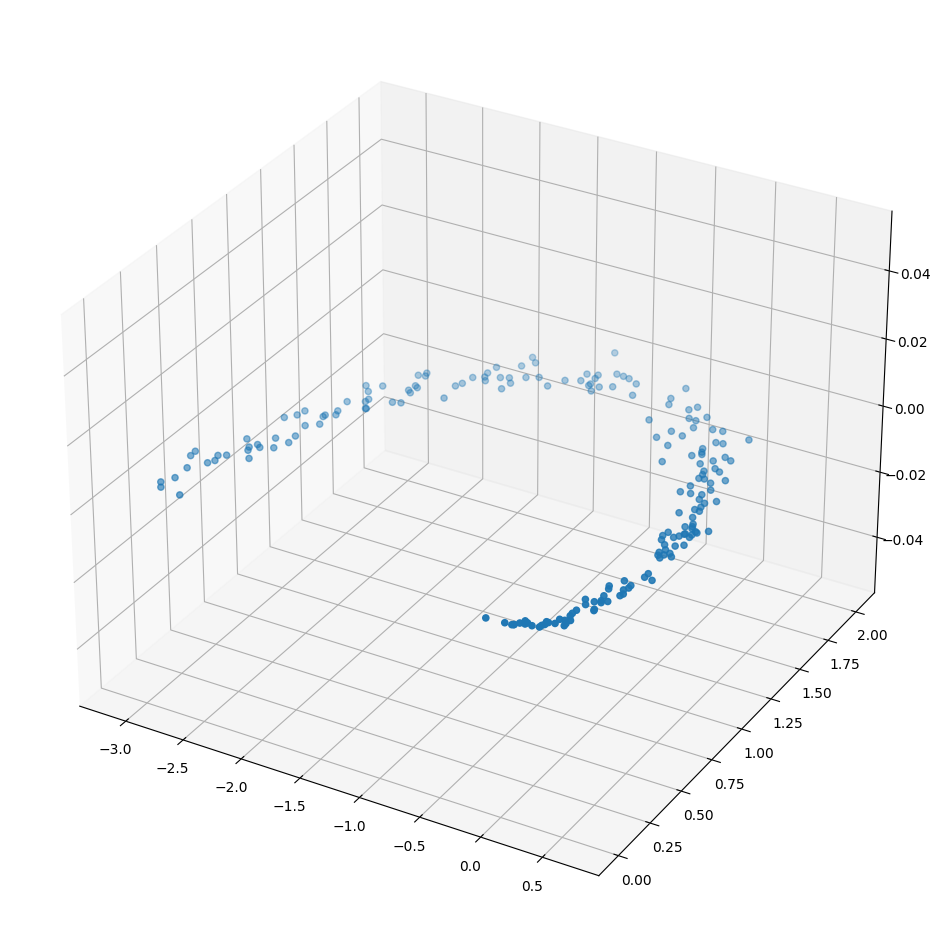

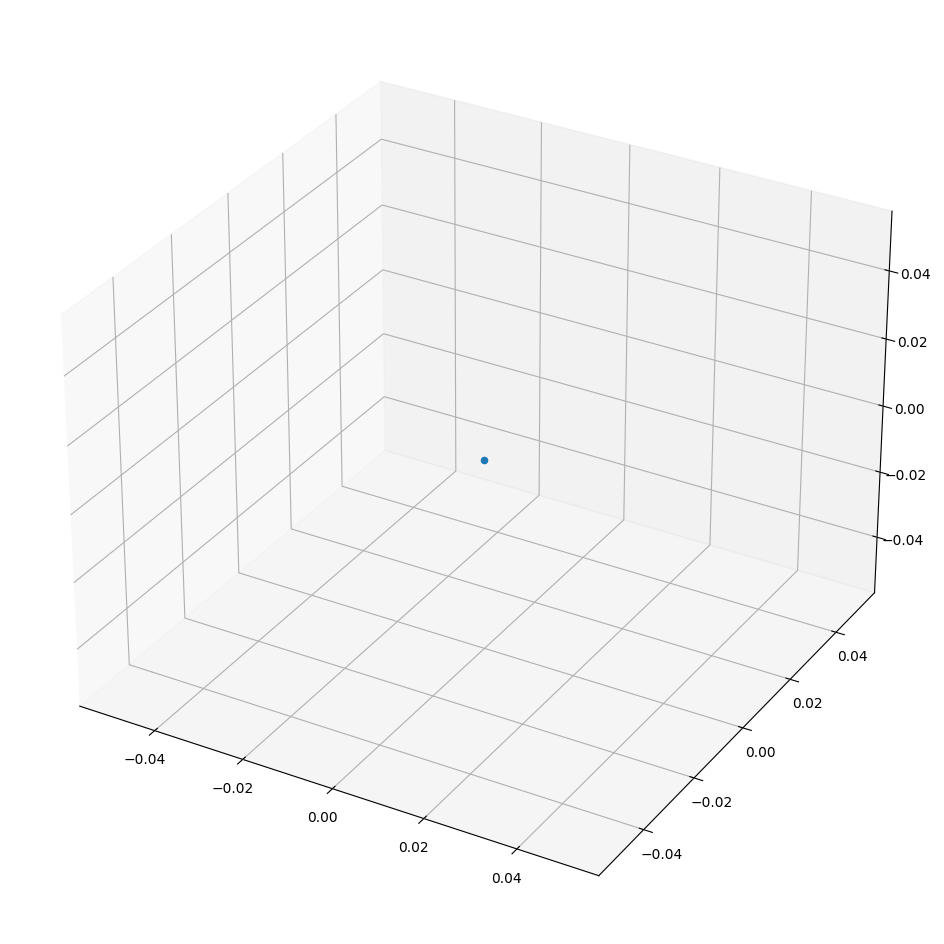

In [167]:
for i in range(2):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(projection='3d')
    ax.scatter(points_x[i][:,0], points_x[i][:,1])
    plt.show()

In [34]:
d_y, i_y = generate_d([points_y])
mu_y = np.array(mu_y)

In [35]:
d_x, i_x = generate_d(points_x)
mu_x = np.array(mu_x)

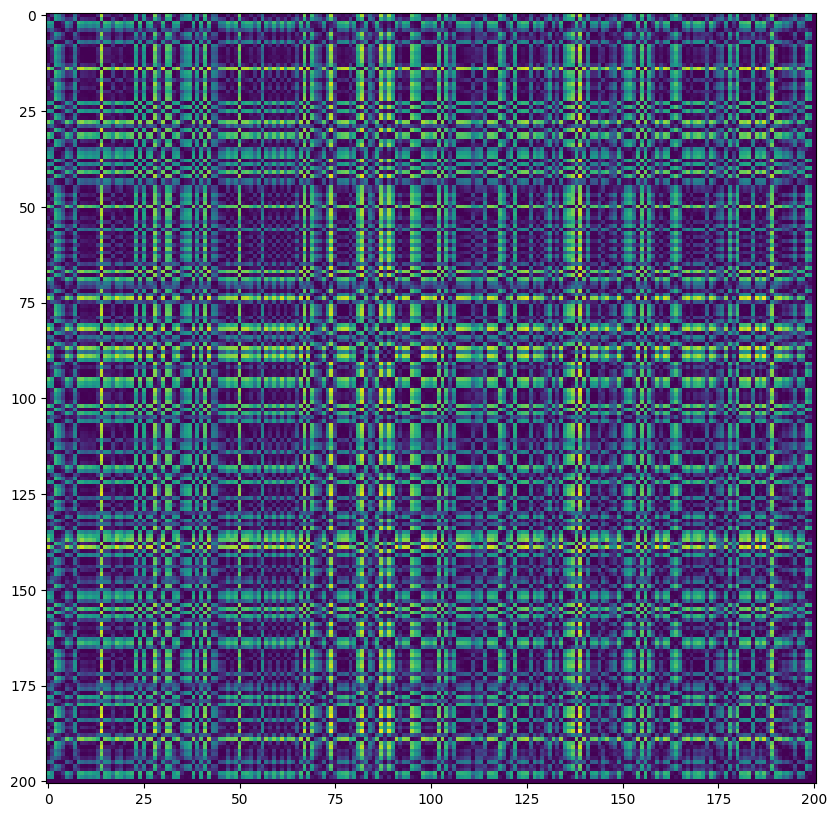

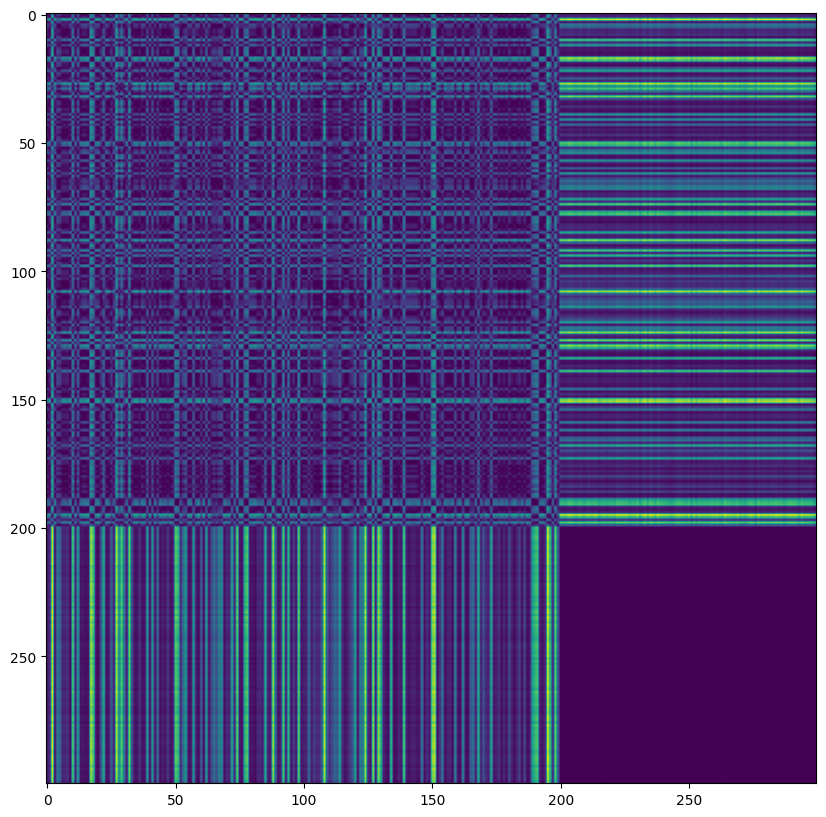

In [39]:
plt.imshow(d_x)
plt.show()
plt.imshow(d_y)
plt.show()

1.0000000000000004
#####
0
0.023951935295266548
1.3874061899114065
1.0000000000000004


C:\Users\artaj\AppData\Local\Programs\Python\Python310\lib\site-packages\ot\bregman.py:502: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
C:\Users\artaj\AppData\Local\Programs\Python\Python310\lib\site-packages\ot\bregman.py:510: UserWarning: Warning: numerical errors at iteration 139
  warnings.warn('Warning: numerical errors at iteration %d' % ii)


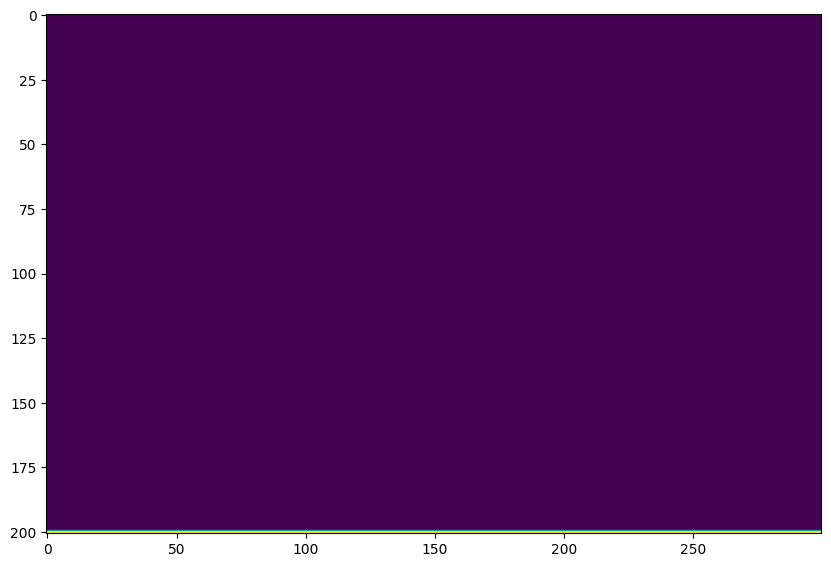

0.6607639789581299


C:\Users\artaj\AppData\Local\Programs\Python\Python310\lib\site-packages\ot\bregman.py:535: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn("Sinkhorn did not converge. You might want to "


#####
1
0.01880271714675958
1.1612705165808748
1.0000000000000002


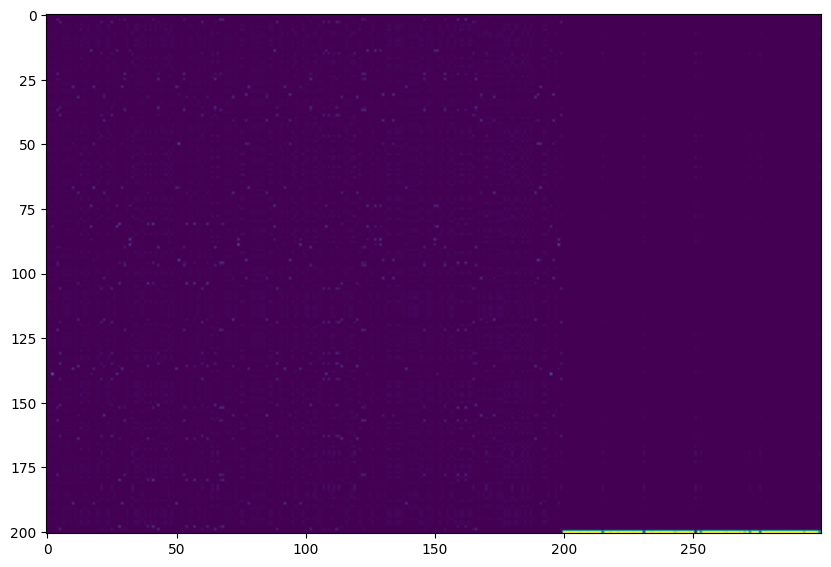

1.783304214477539
#####
2
0.015483260252314808
0.5504039605854537
1.0


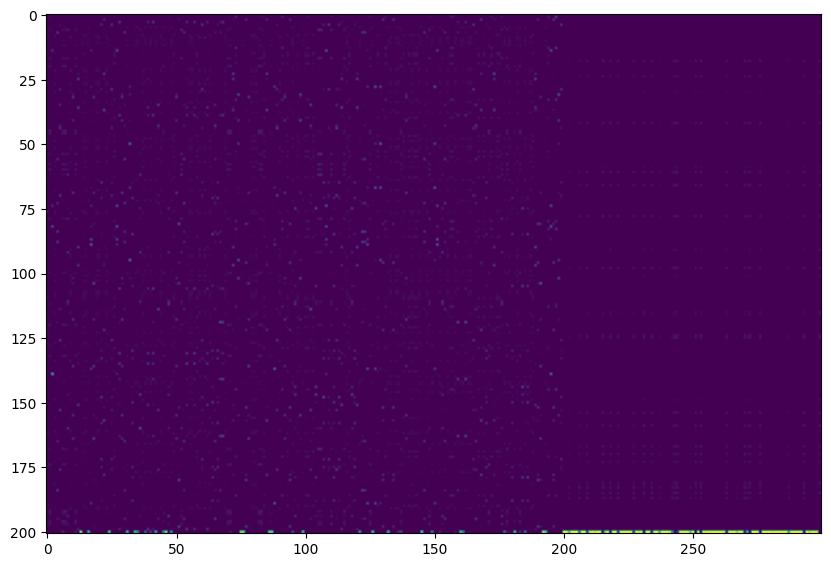

1.9513158798217773
#####
3
0.015488974362729363
0.07616836267143966
0.9999999999999999


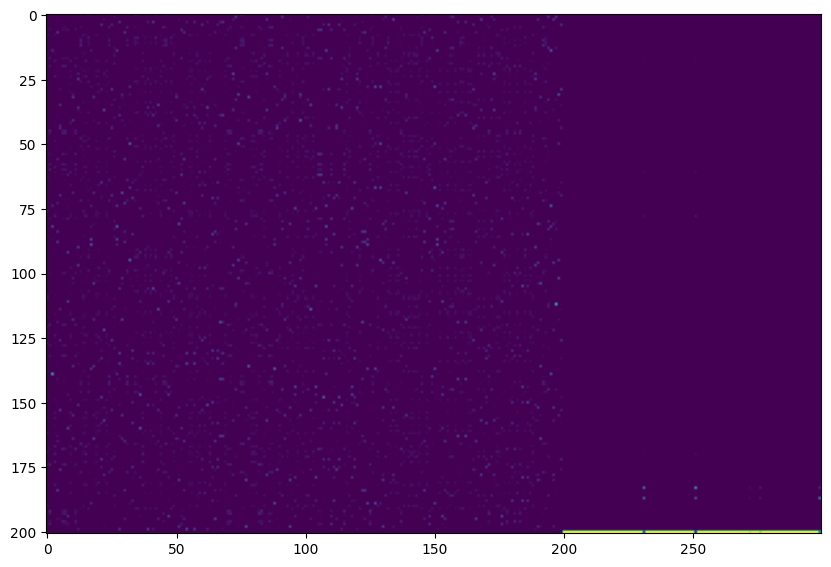

2.1386115550994873
#####
4
0.015464469020223106
0.006352708811409159
1.0


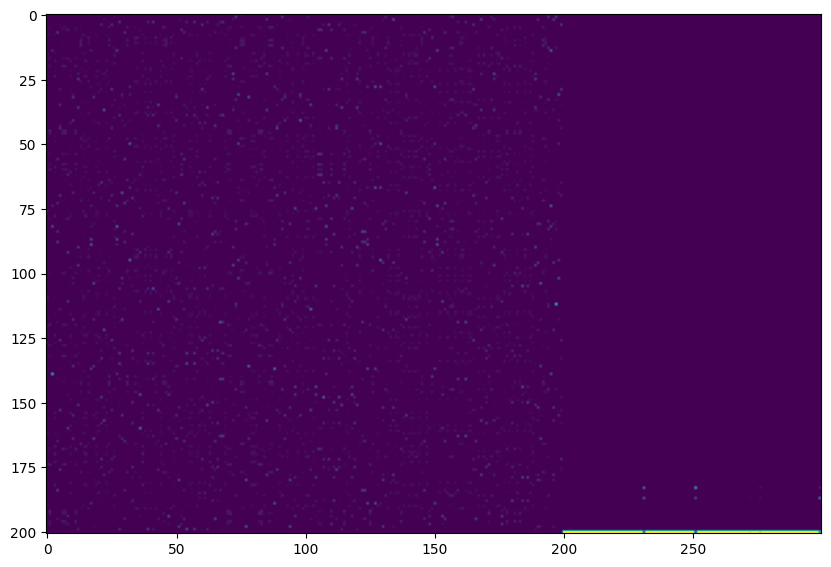

2.508543014526367
#####
5
0.015462718074655542
0.00048345785148372496
0.9999999999999999


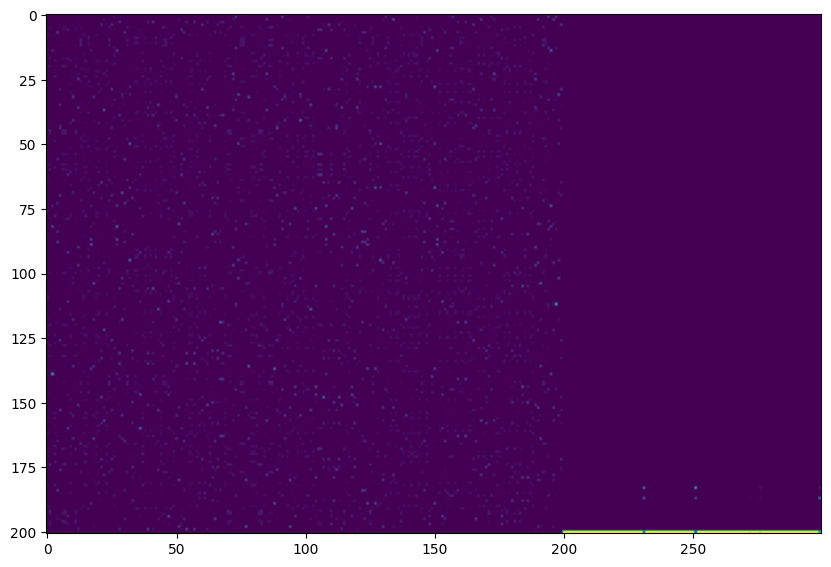

2.464785575866699
#####
6
0.015462590475396385
3.781429853811323e-05
0.9999999999999999


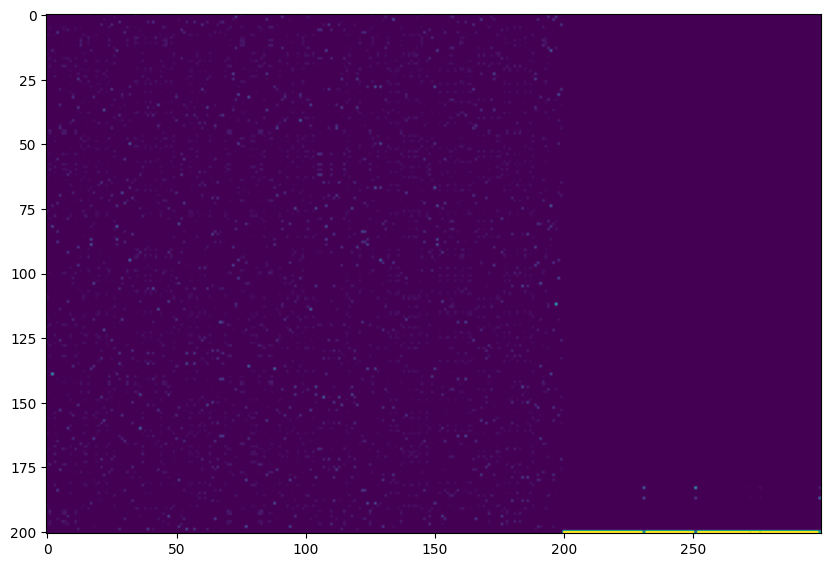

2.1434221267700195
#####
7
0.015462580545053835
2.9816878931724883e-06
1.0


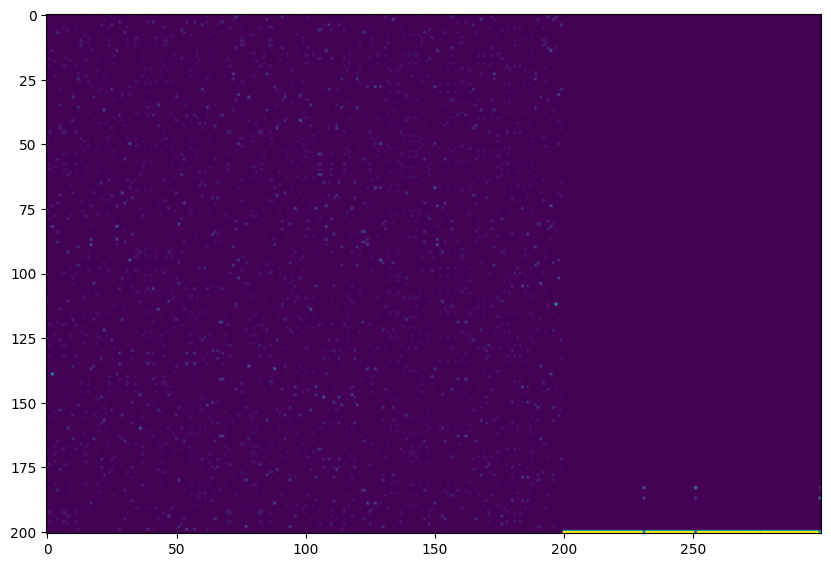

2.444148302078247
#####
8
0.015462579762822282
2.3537650698024255e-07
1.0


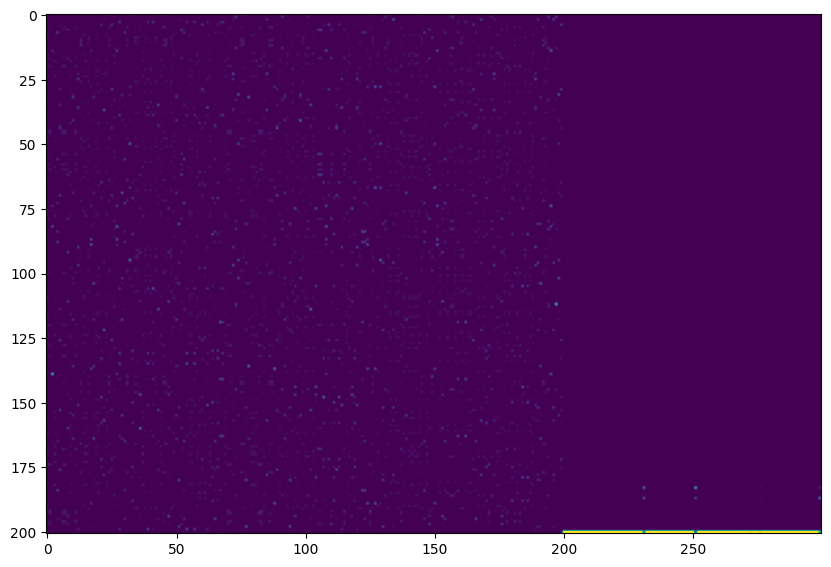

2.123877763748169
#####
9
0.015462579701092978
1.8583609765078345e-08
1.0


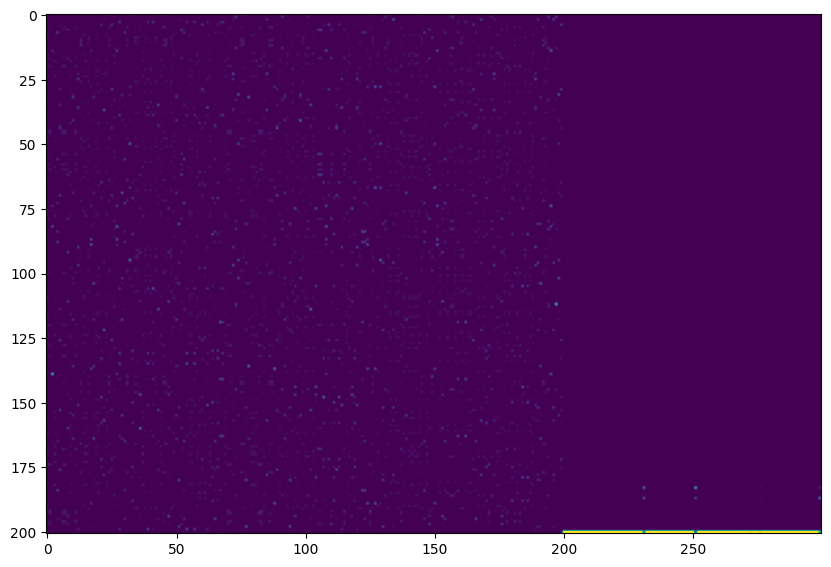

2.349637269973755
#####
10
0.01546257969621975
1.4672757922170579e-09
1.0000000000000002


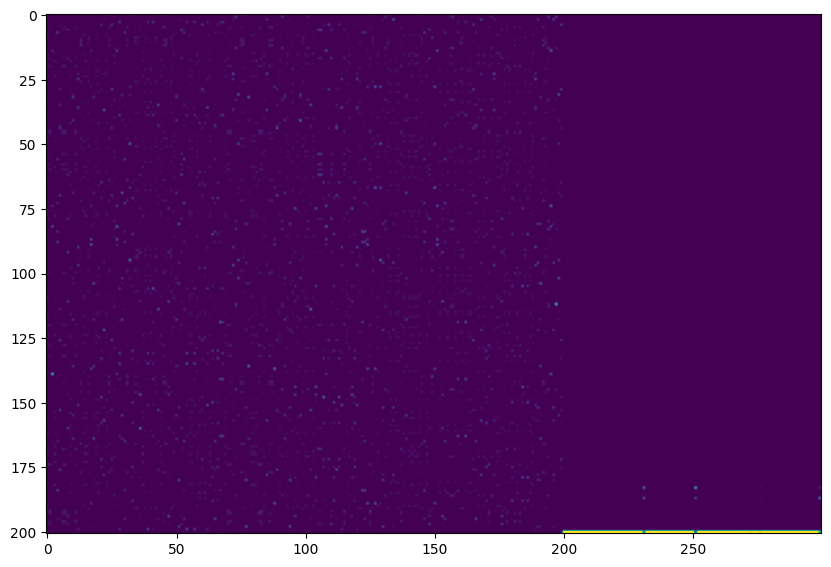

2.48922061920166
#####
11
0.015462579695835001
1.1585094557246679e-10
1.0


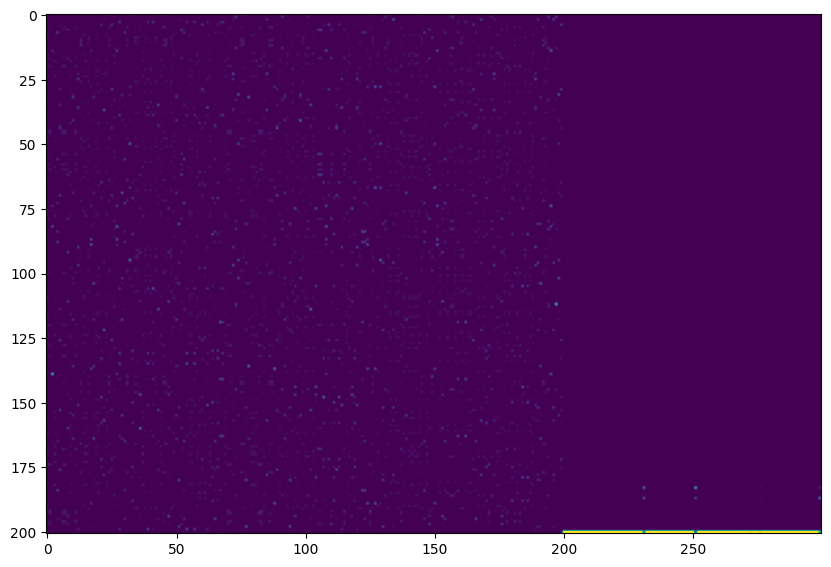

2.28728985786438
#####
12
0.015462579695804623
9.14831748287925e-12
1.0000000000000002


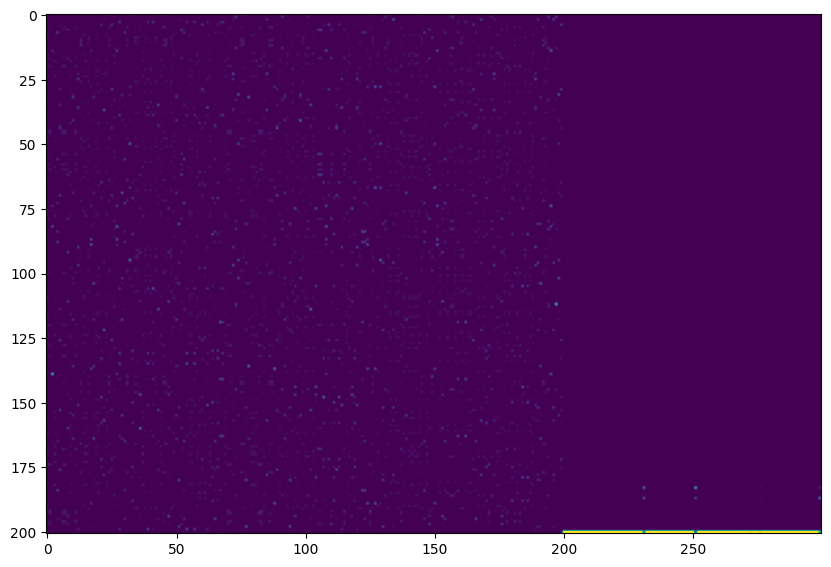

2.336979866027832
#####
13
0.01546257969580221
7.268021916256131e-13
1.0


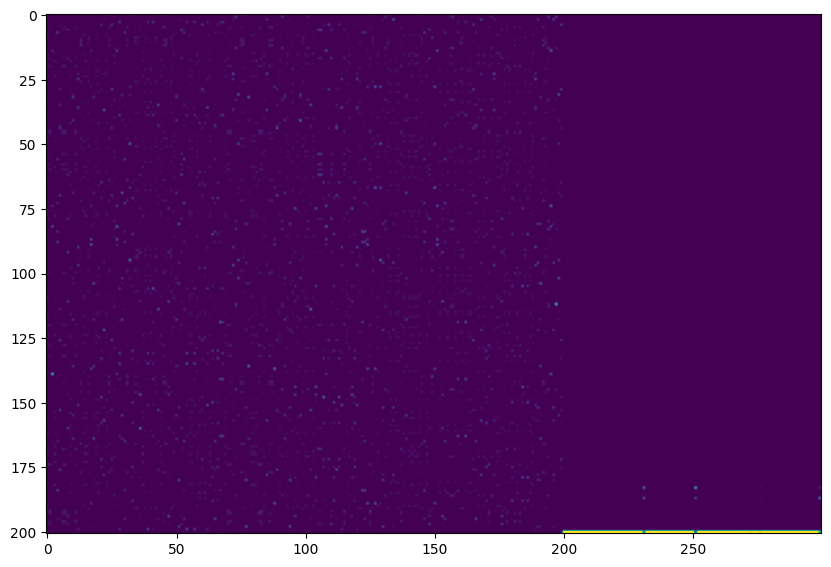

2.286928415298462
#####
14
0.015462579695802019
9.077869913538031e-14
1.0


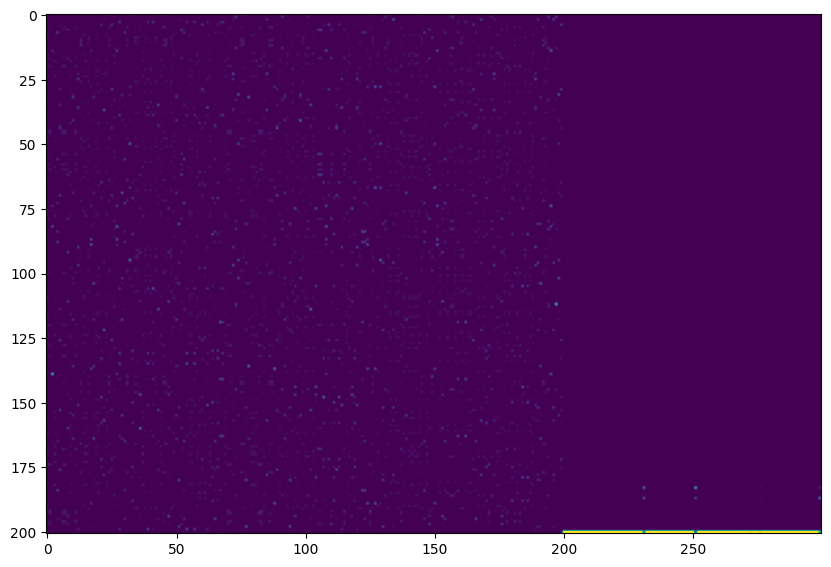

2.288553476333618
#####
15
0.01546257969580201
5.933183344926333e-14
1.0


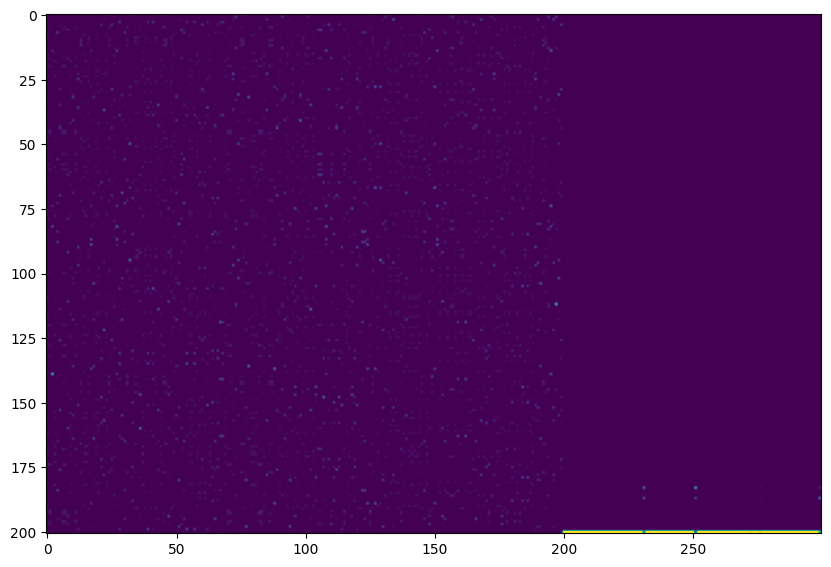

2.2121005058288574
#####
16
0.015462579695802009
4.605276391568734e-14
1.0


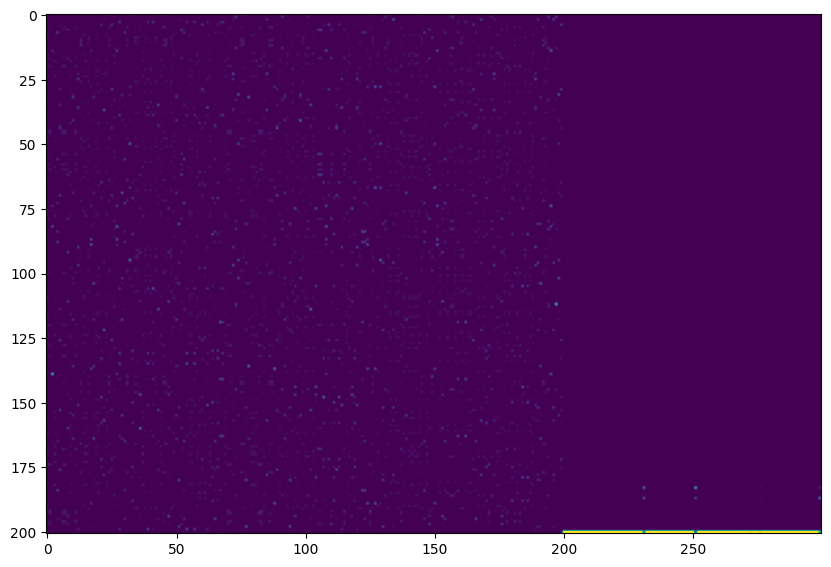

2.189075231552124
#####
17
0.015462579695802005
4.404308510615853e-14
1.0


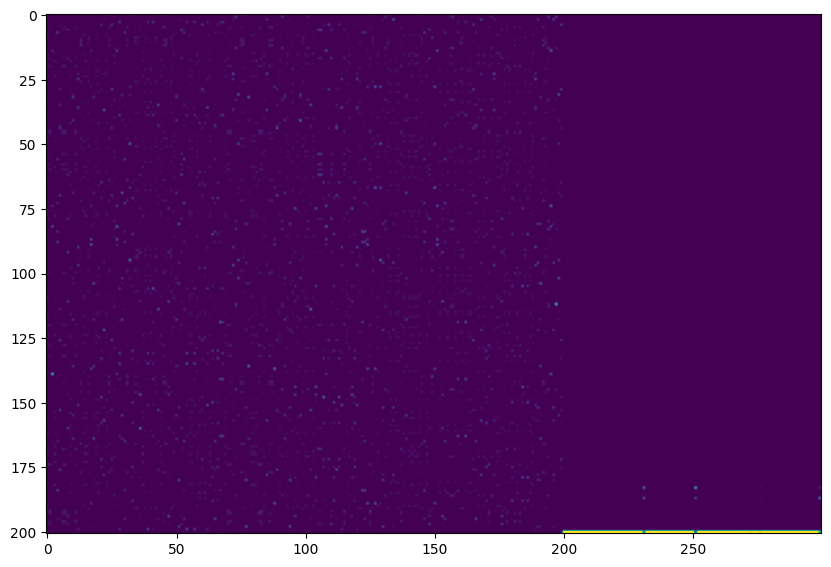

2.4972033500671387
#####
18
0.015462579695802016
4.6352013297077157e-14
0.9999999999999999


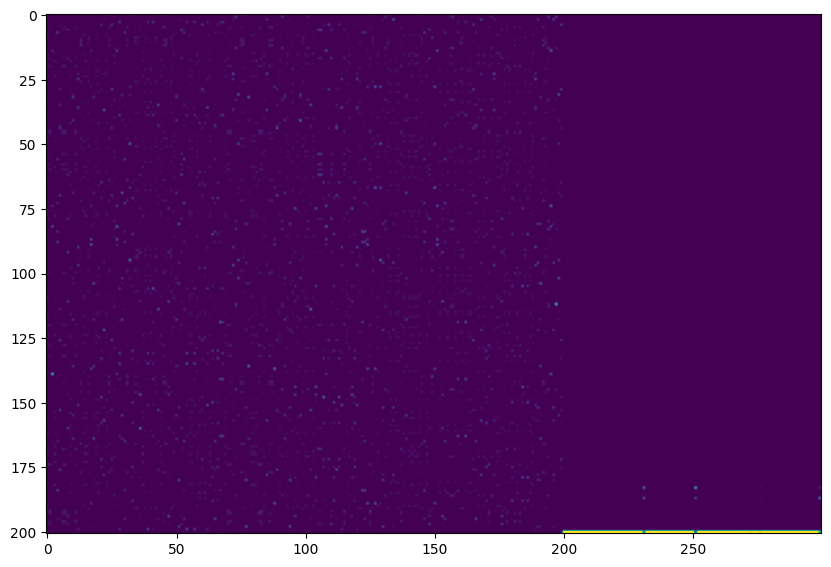

2.1628637313842773
#####
19
0.015462579695802005
4.3821442569934664e-14
1.0


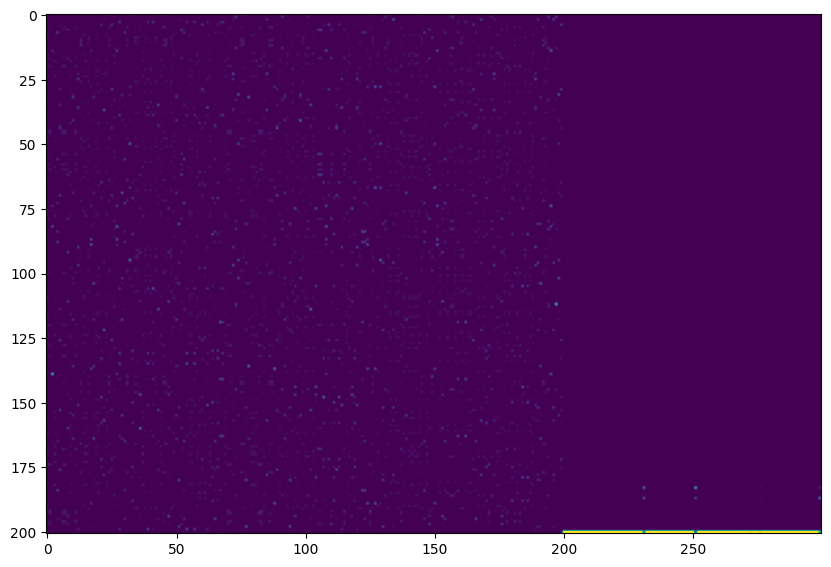

2.177482843399048
#####
20
0.015462579695802009
4.457790668611186e-14
1.0


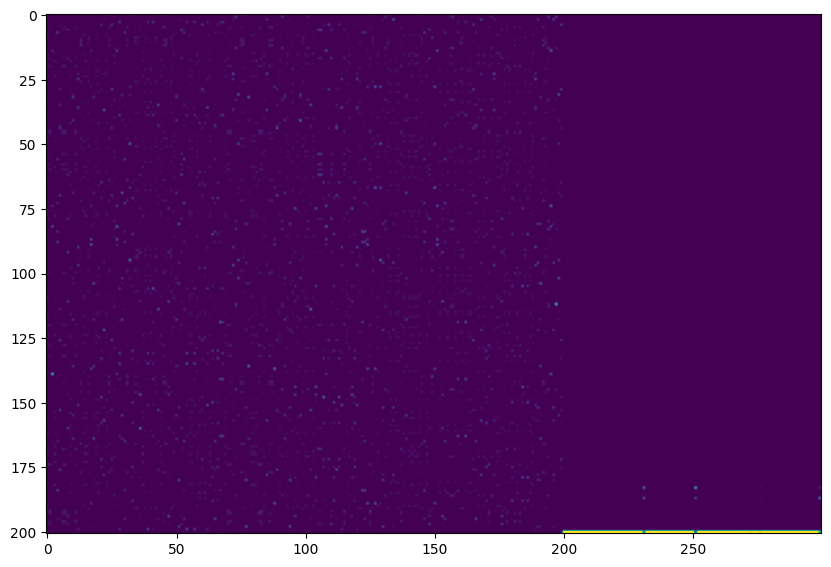

2.096147060394287
#####
21
0.015462579695802005
4.2543661051169795e-14
1.0


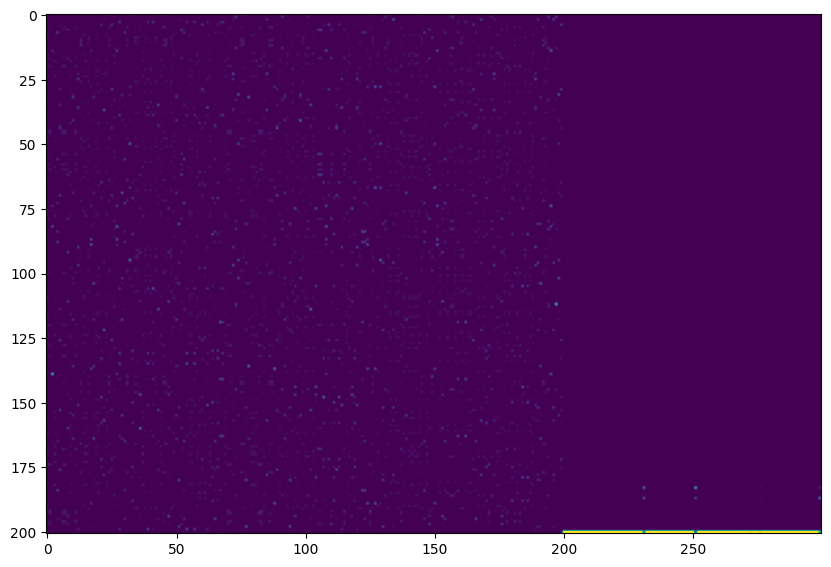

2.2517030239105225
#####
22
0.015462579695802003
4.480114549041236e-14
1.0


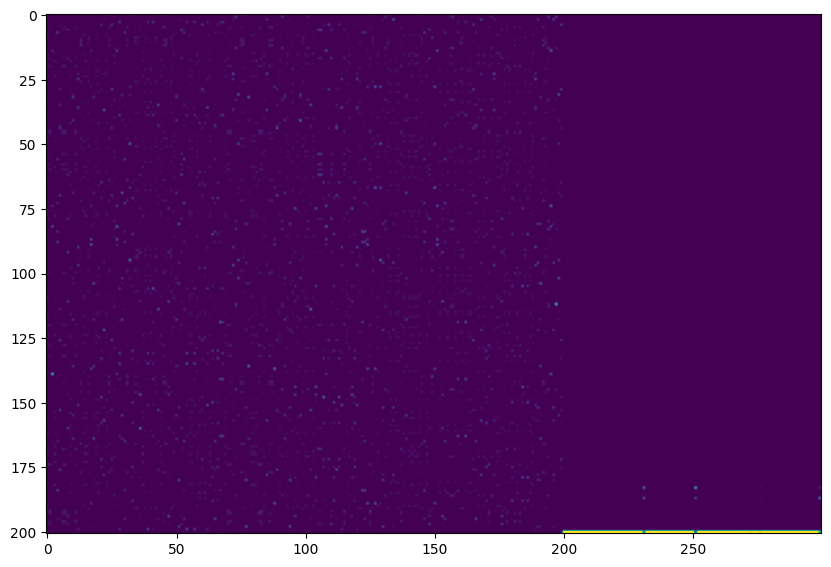

2.222461462020874
#####
23
0.015462579695802016
4.518492539963573e-14
0.9999999999999999


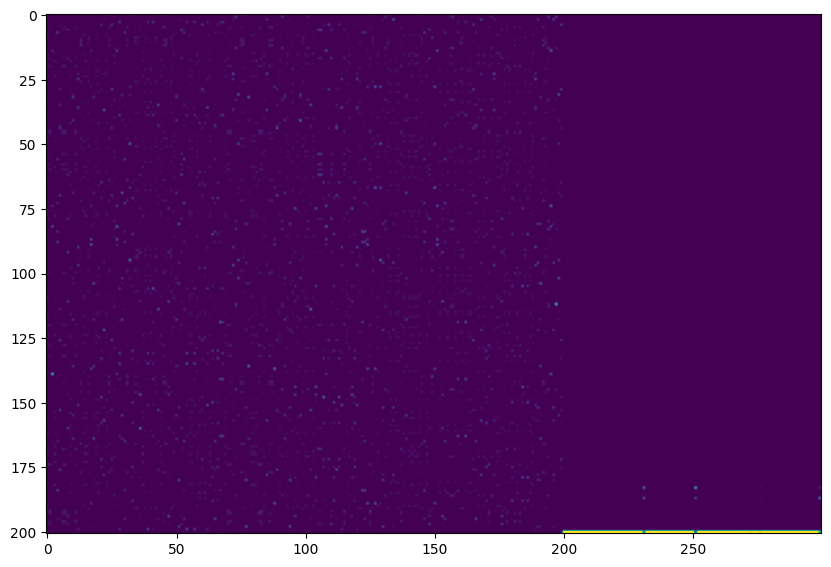

1.9787733554840088
#####
24
0.015462579695802016
3.729782992092076e-14
1.0


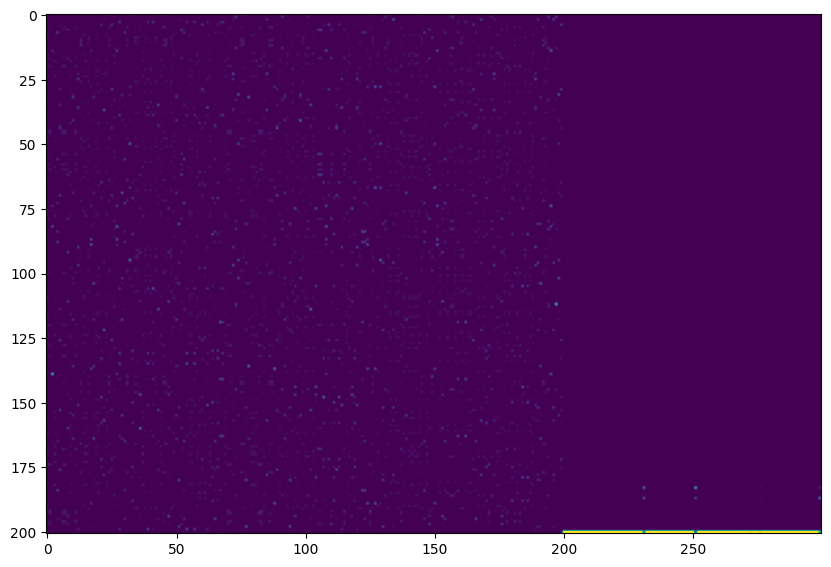

2.2173869609832764
#####
25
0.015462579695802016
3.643615888273324e-14
0.9999999999999998


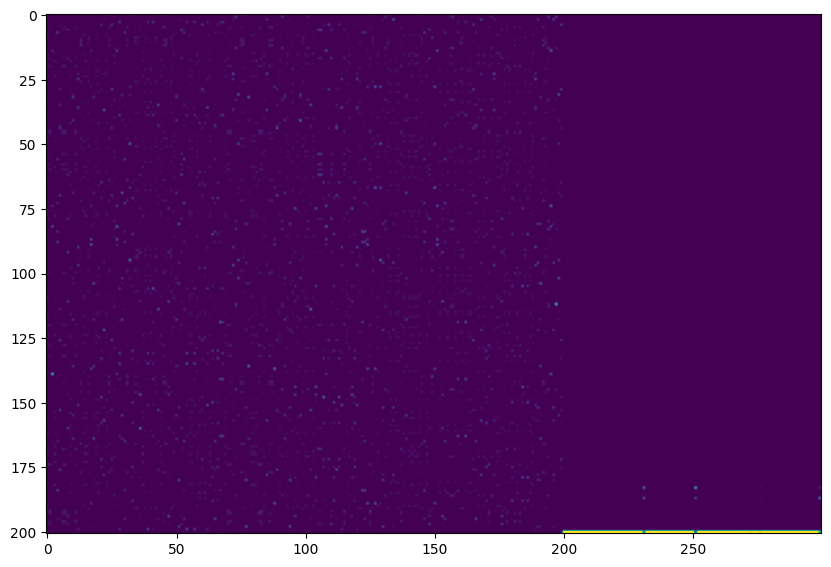

2.4027788639068604
#####
26
0.015462579695802003
4.1153997608975464e-14
1.0


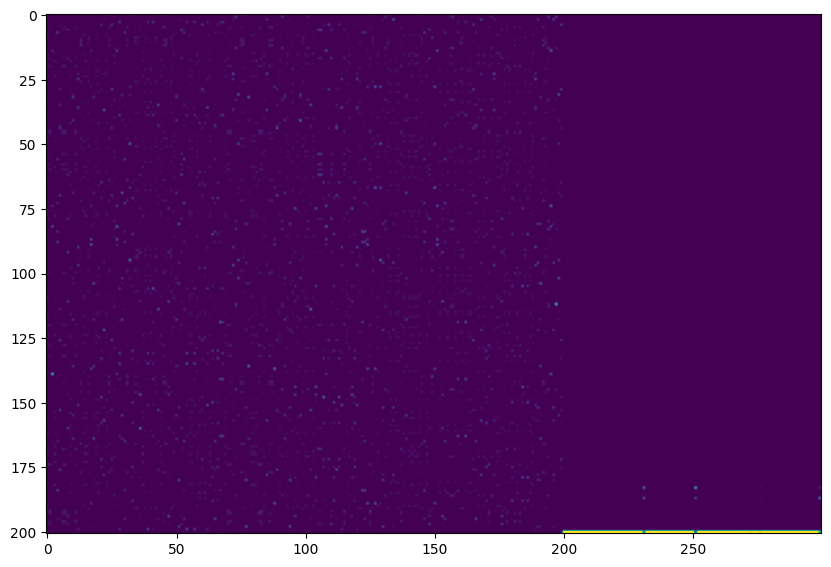

2.229198932647705
#####
27
0.015462579695802005
4.2600460855435933e-14
1.0


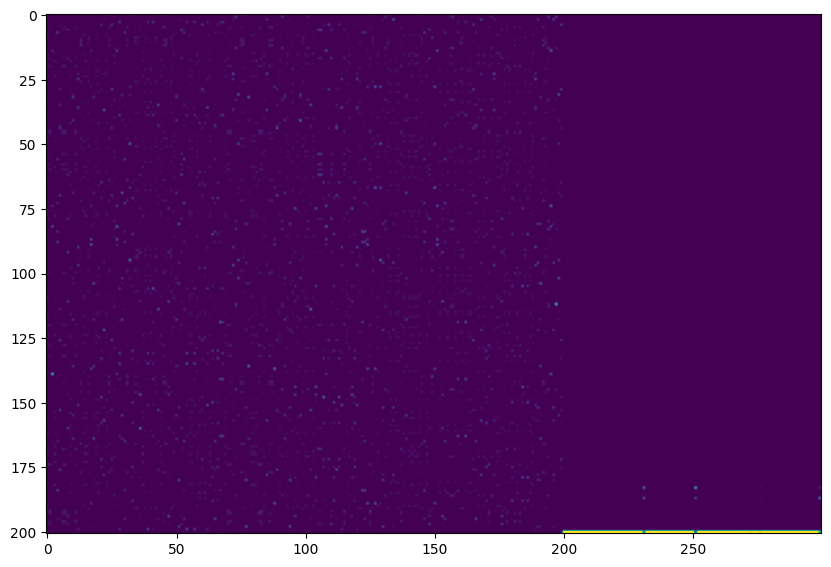

2.3708105087280273
#####
28
0.015462579695802005
3.817062670549376e-14
1.0


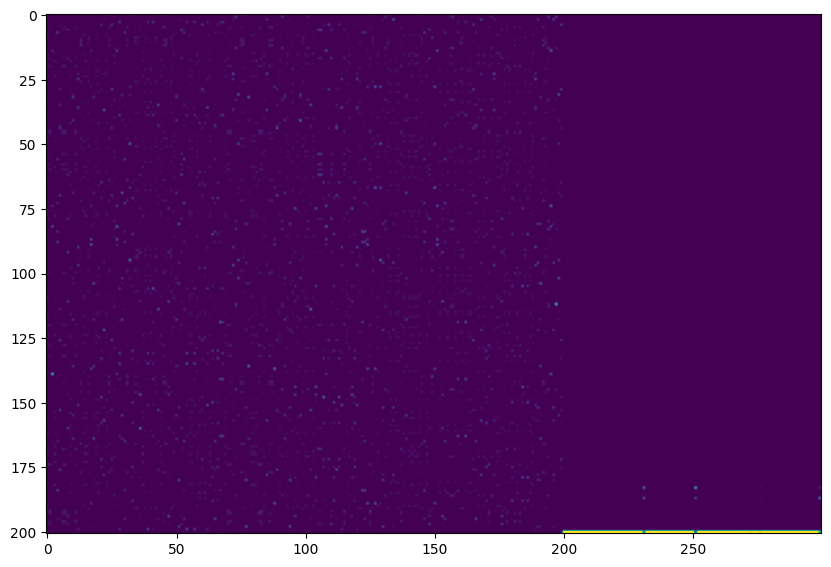

1.937817096710205
#####
29
0.015462579695802016
4.469005189802654e-14
1.0


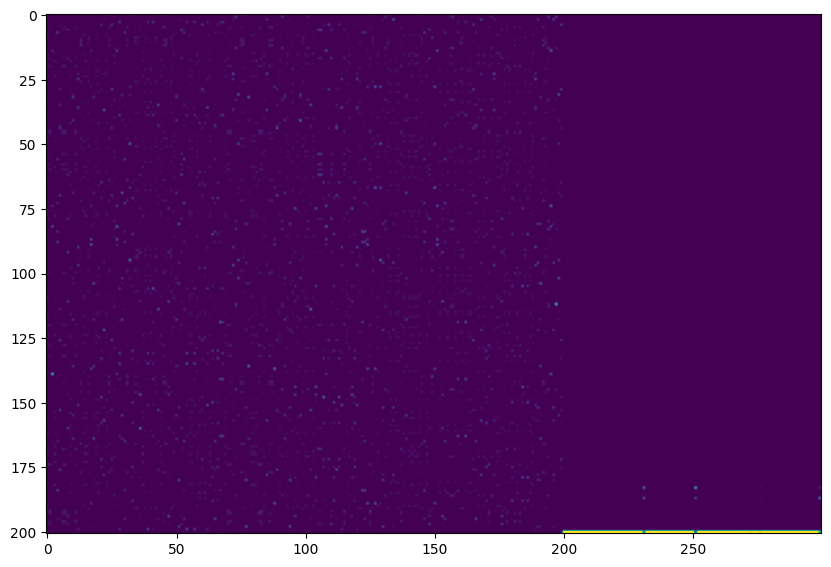

1.8589773178100586
#####
30
0.015462579695802016
4.164713446300672e-14
1.0


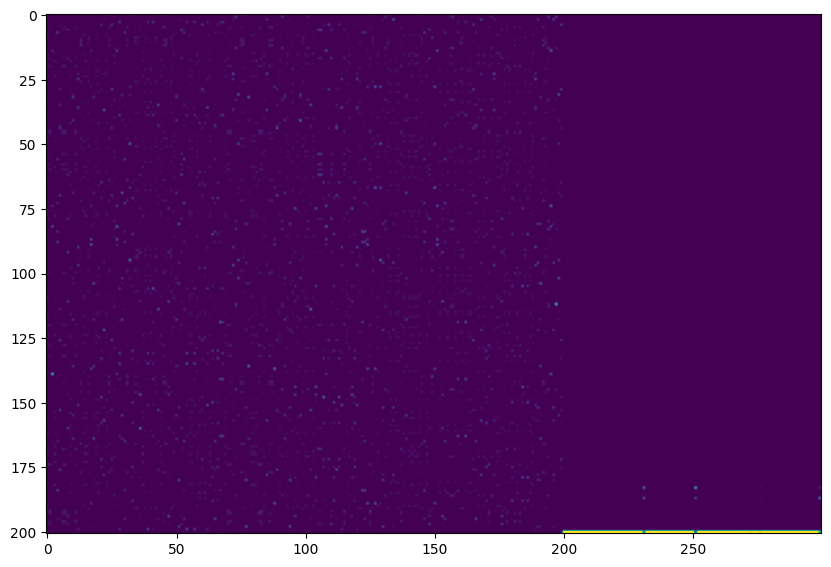

2.391010046005249
#####
31
0.015462579695802016
3.6881162423884476e-14
1.0


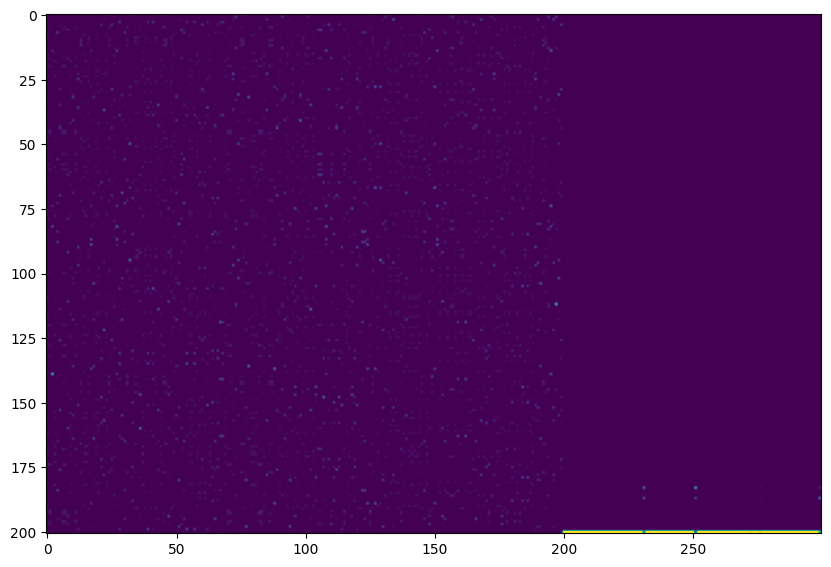

2.078904867172241
#####
32
0.015462579695802009
4.133467116369918e-14
1.0


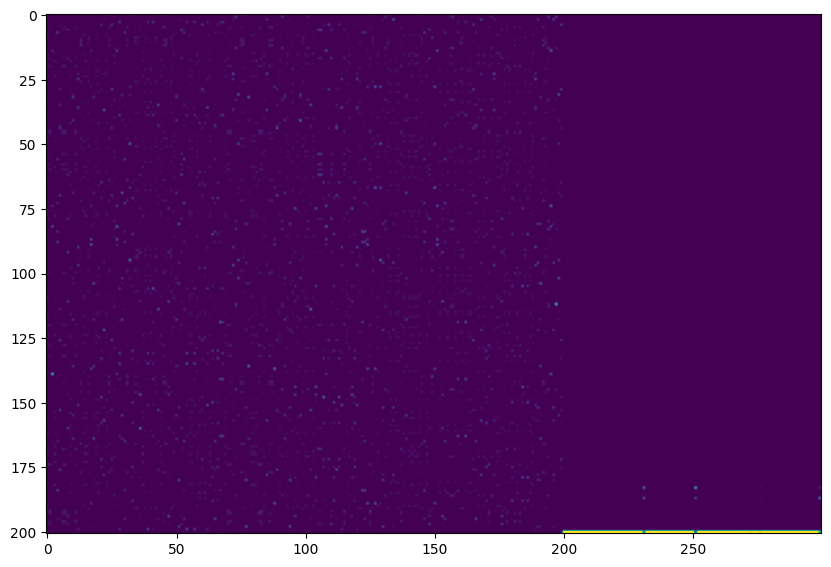

2.3730807304382324
#####
33
0.015462579695802005
4.5698964427841155e-14
1.0


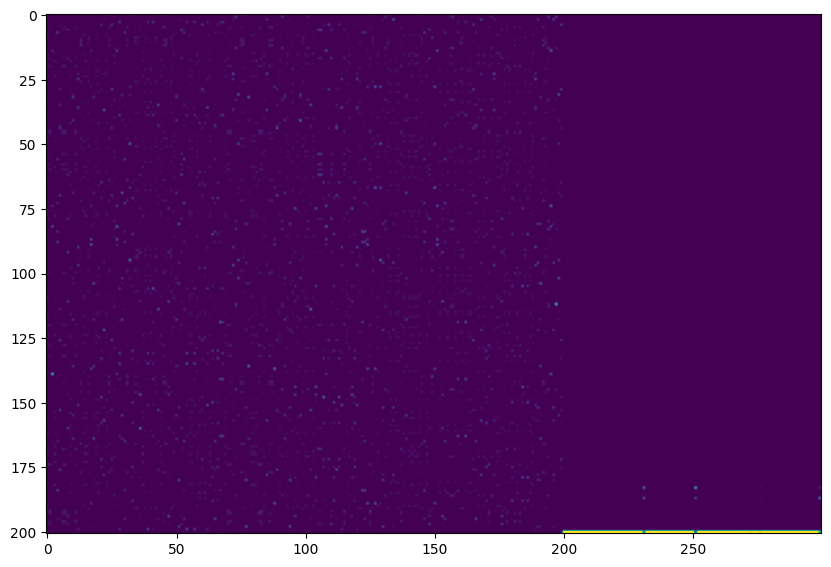

2.2320141792297363
#####
34
0.015462579695802003
4.1028878223265897e-14
1.0


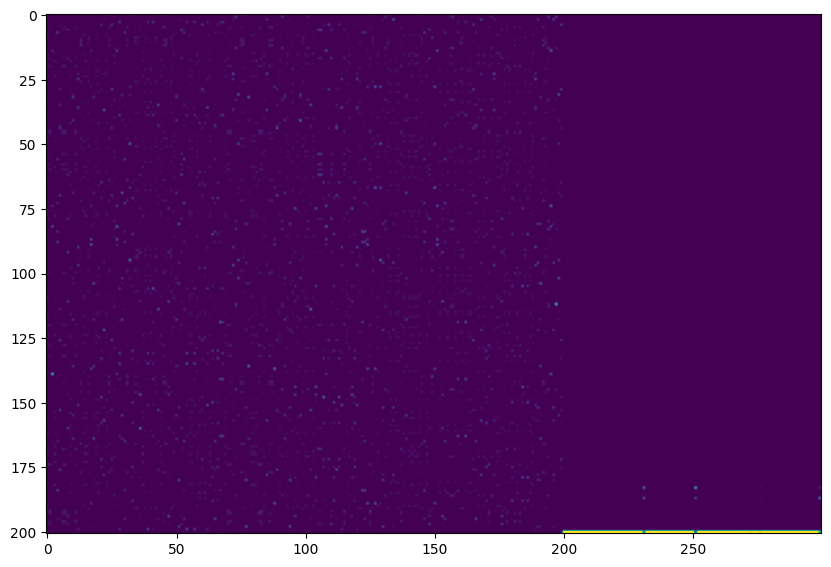

2.0462324619293213
#####
35
0.015462579695802016
4.3406421315384143e-14
1.0


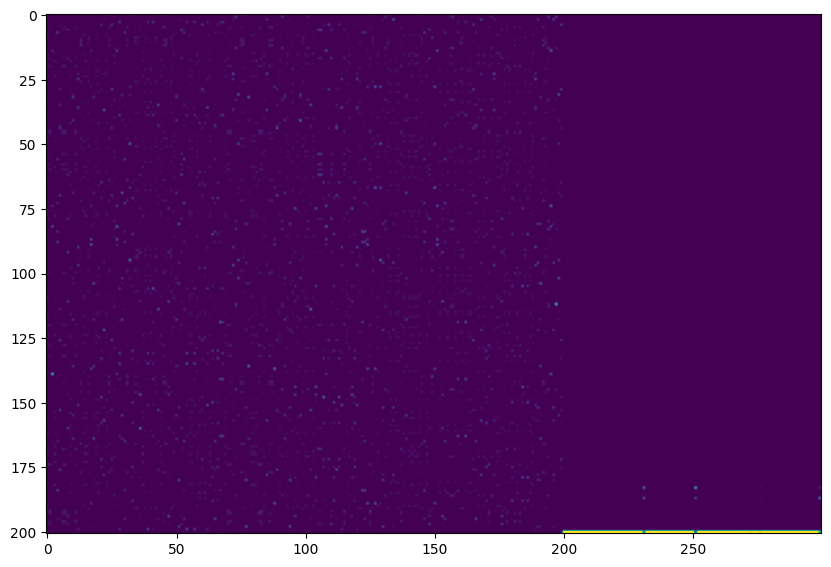

1.9059700965881348
#####
36
0.015462579695802005
4.4598682978185936e-14
1.0


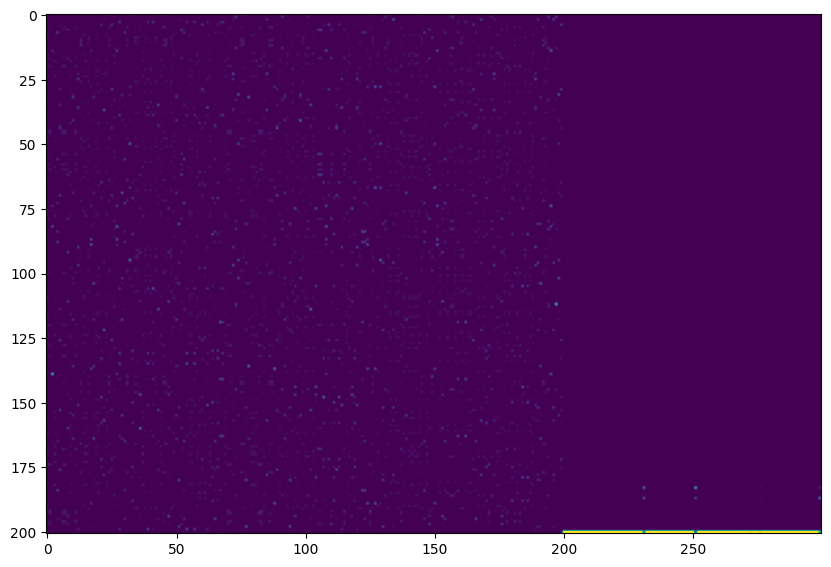

2.2180707454681396
#####
37
0.015462579695802005
3.601027437497074e-14
1.0


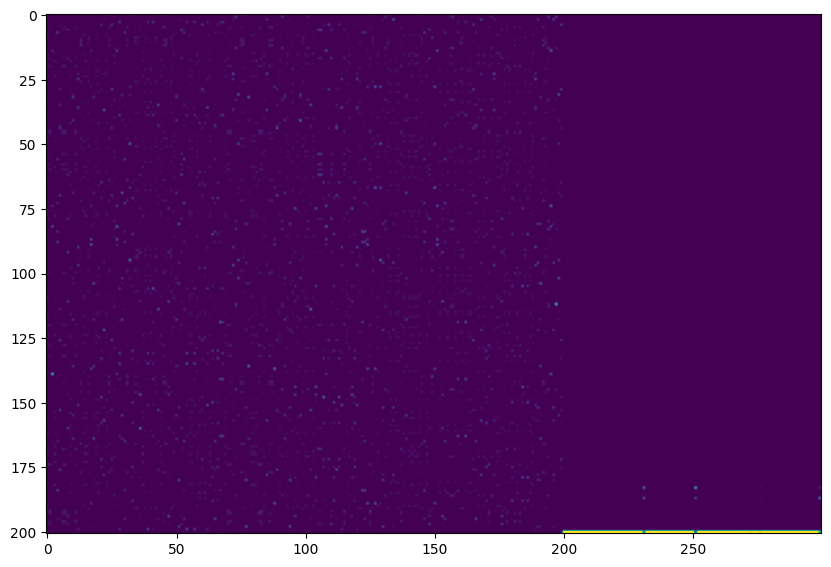

1.7711238861083984
#####
38
0.015462579695802009
4.511514528407367e-14
1.0


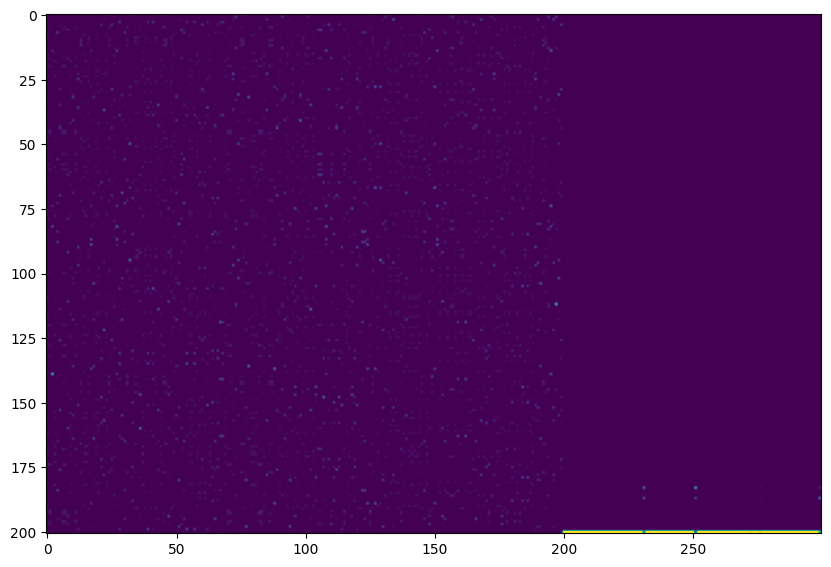

2.193207263946533
#####
39
0.015462579695802003
4.632590964391124e-14
1.0


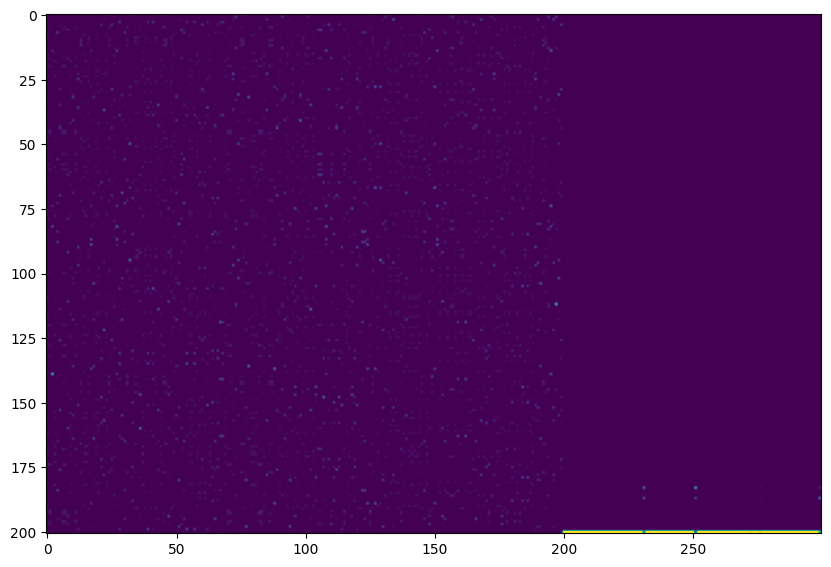

2.1858606338500977
#####
40
0.015462579695802003
4.410935287987973e-14
1.0


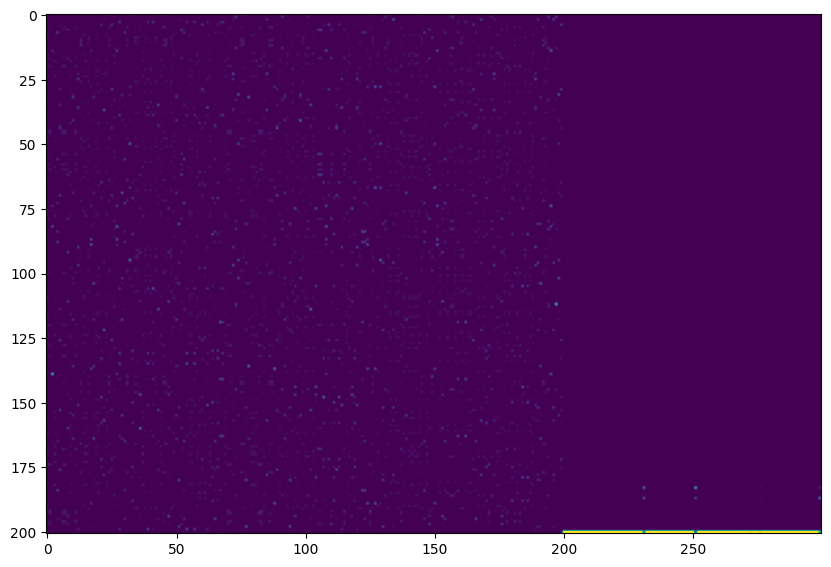

2.263601303100586
#####
41
0.015462579695802016
4.4558169947345866e-14
1.0


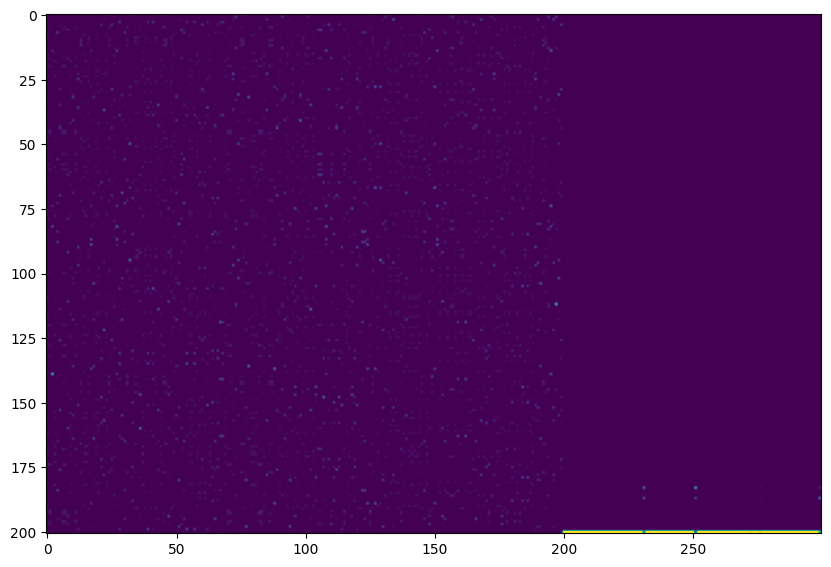

1.9995920658111572
#####
42
0.015462579695802016
4.430357443500453e-14
1.0


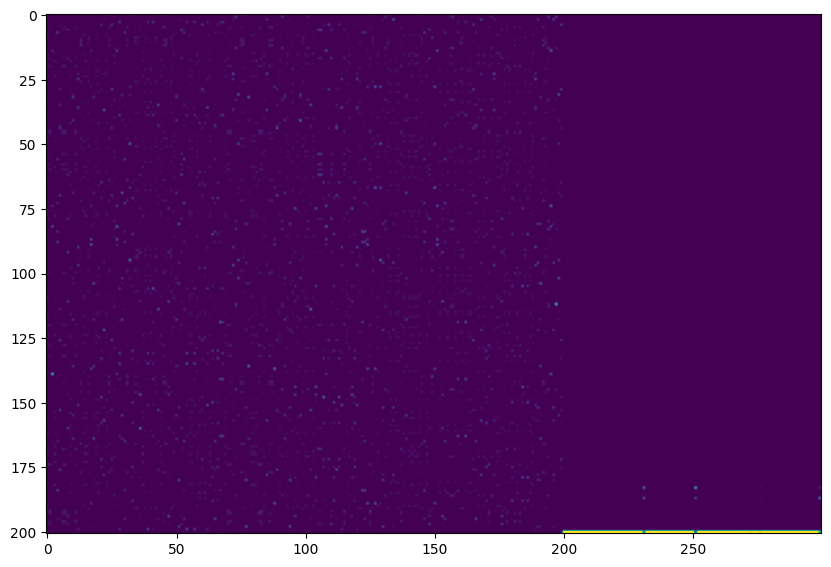

2.1867053508758545
#####
43
0.015462579695802003
4.492041107898868e-14
1.0


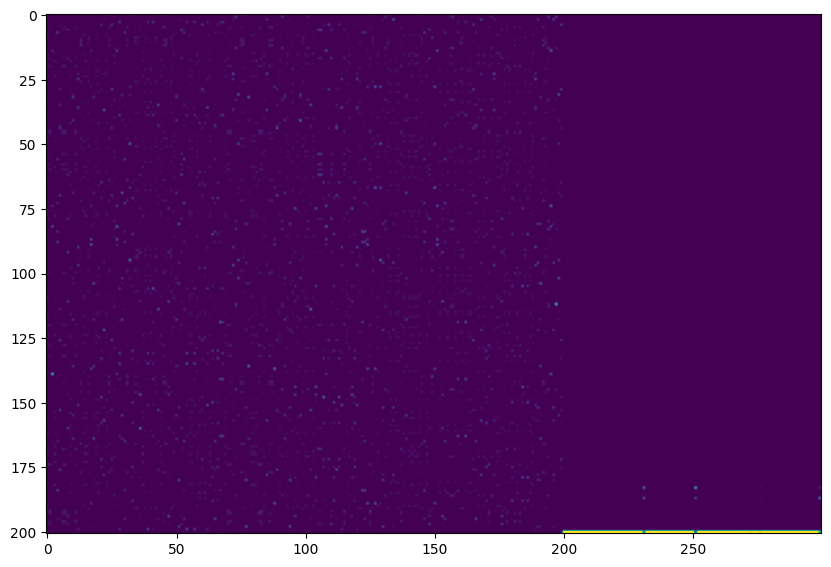

2.13163685798645
#####
44
0.015462579695802009
4.211555122102965e-14
0.9999999999999998


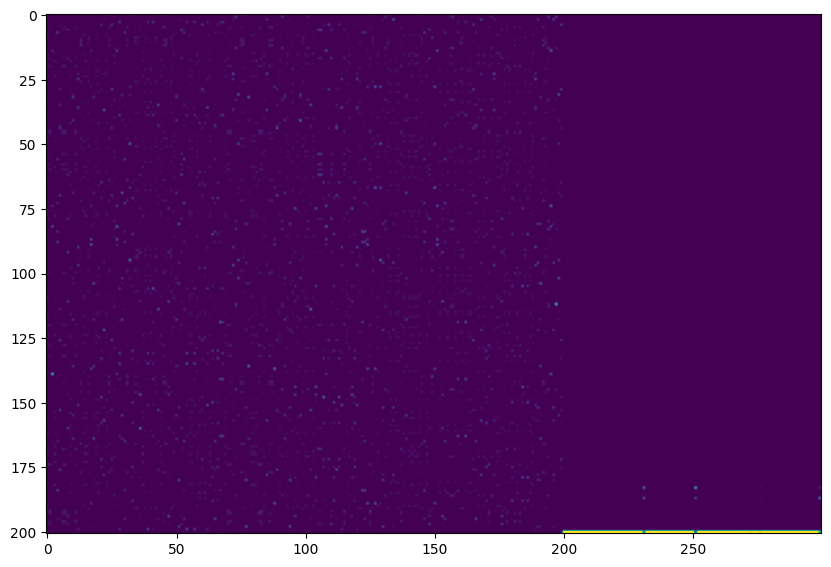

2.075218677520752
#####
45
0.015462579695802019
4.3442407585631376e-14
1.0


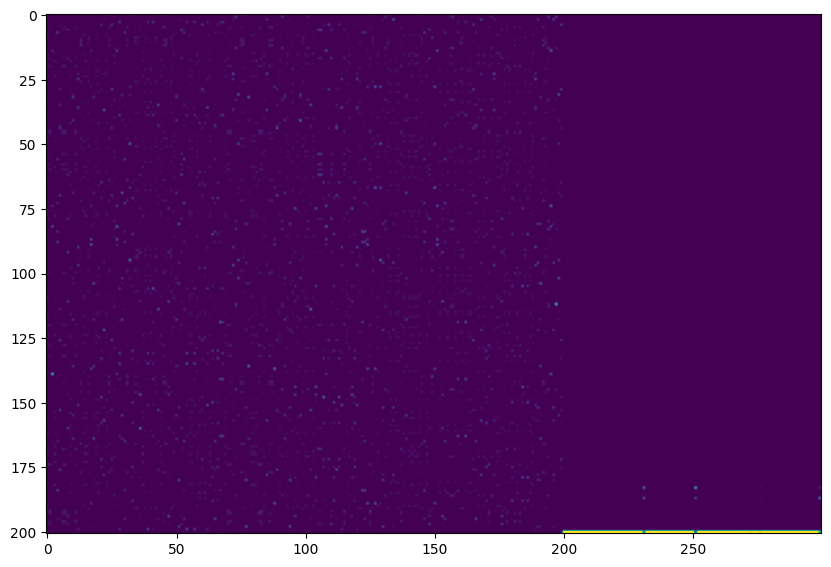

2.0190813541412354
#####
46
0.015462579695802003
4.335282934404015e-14
1.0


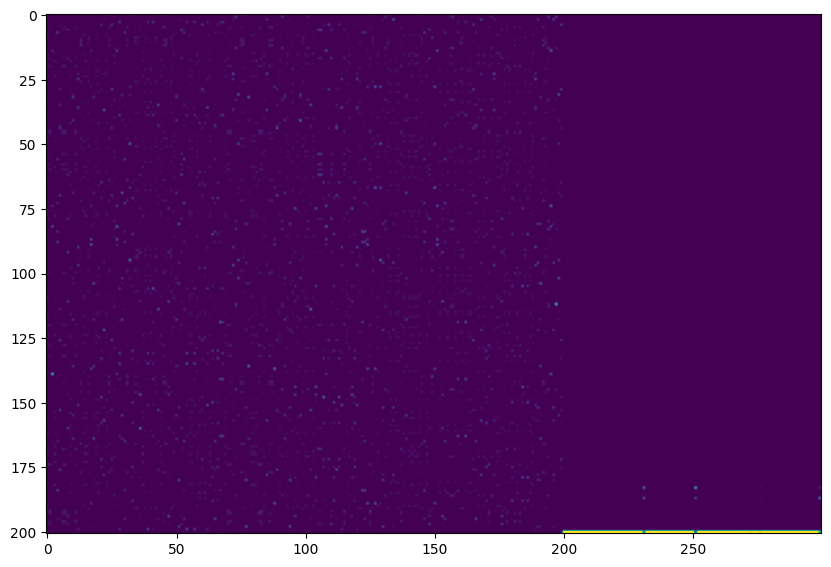

1.860468864440918
#####
47
0.015462579695802003
3.843341004439024e-14
1.0


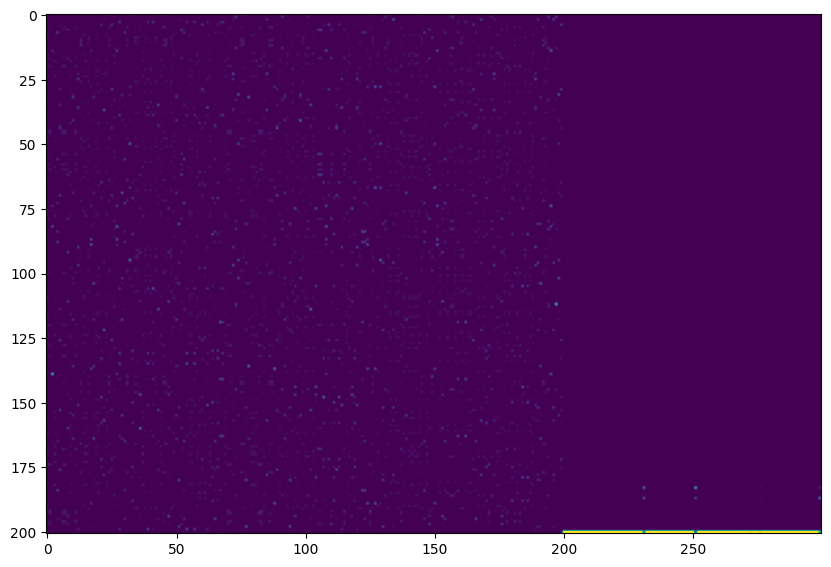

2.136979103088379
#####
48
0.015462579695802009
4.106502330545868e-14
1.0


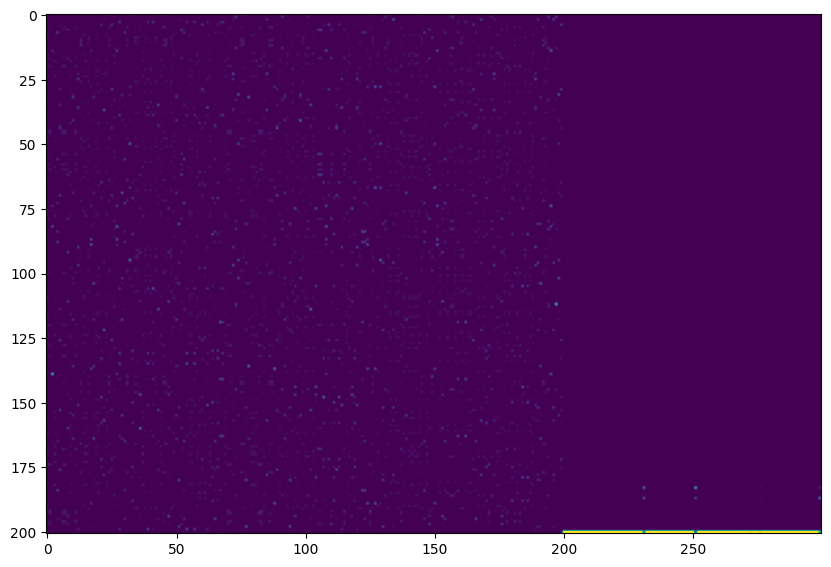

2.2159905433654785
#####
49
0.015462579695802005
4.4800210402326725e-14
1.0


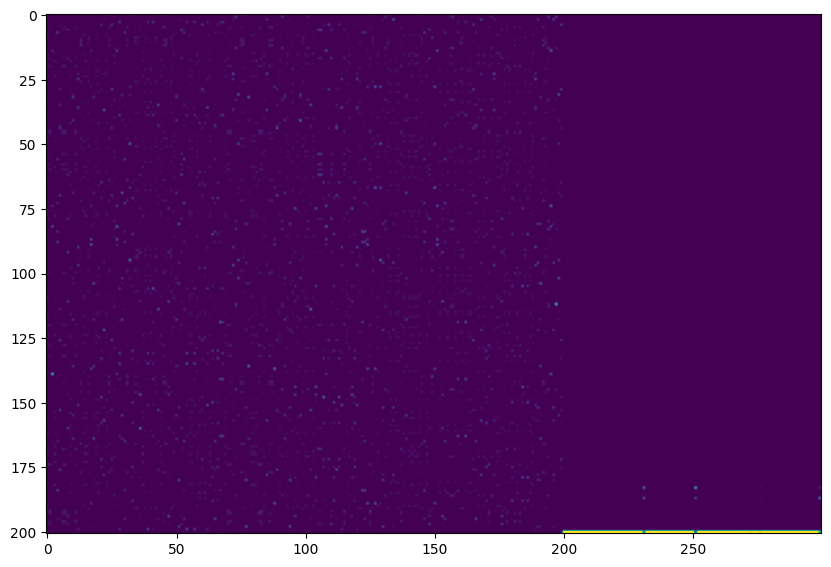

2.216236114501953
107.5694522857666


In [40]:
eta = 1
import time
alpha = 1e-1
cur_mu = np.outer(mu_x, mu_y)
print(cur_mu.sum())
dif = []
costs = []
mus = []
t0 = time.time()
for i in range(50):
    t = time.time()
    c = gamma(cur_mu, d_x, i_x, d_y)
    c_o = c
    c -= c.min()
    c = (c**eta) * (cur_mu**(1-eta))
    
#     plt.imshow(c)
#     plt.show()
#     print(c)
    
    
    k = 1/c.sum() *c.shape[0] * c.shape[1]
    c = c*k
    alpha1=alpha*k
    mu = ot.sinkhorn(mu_x, mu_y, c, alpha1)
    print('#####')
    print(i)
    print(k)
    print(abs(mu - cur_mu).sum())
    print(mu.sum())
    dif.append(abs(mu - cur_mu).sum())
    costs.append(cost(c_o, cur_mu))
    plt.imshow(cur_mu)
    plt.show()
#     plt.imshow(c)
    plt.show()
    cur_mu = mu
#     if dif[-1] < 1e-4:
#         cur_mu = np.random.rand(mu.shape[0], mu.shape[1])
#         cur_mu /= cur_mu.sum()
    mus.append(cur_mu)
    print(time.time() - t)
print(time.time() - t0)

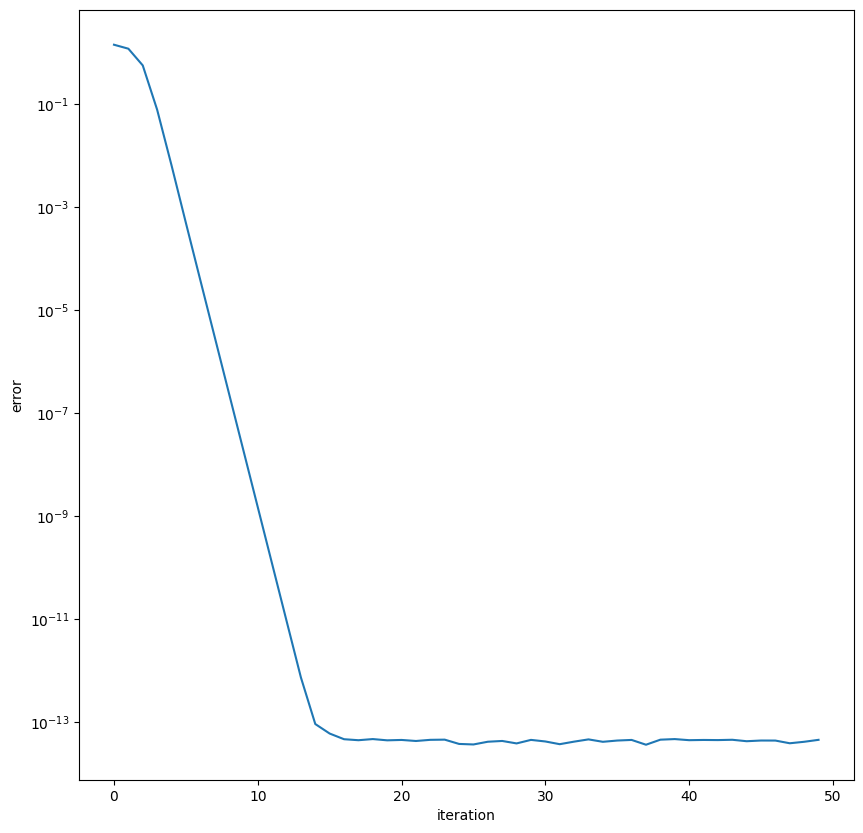

In [41]:
plt.plot(dif)
plt.yscale('log')
plt.ylabel('error')
plt.xlabel('iteration')
plt.show()

0.0001


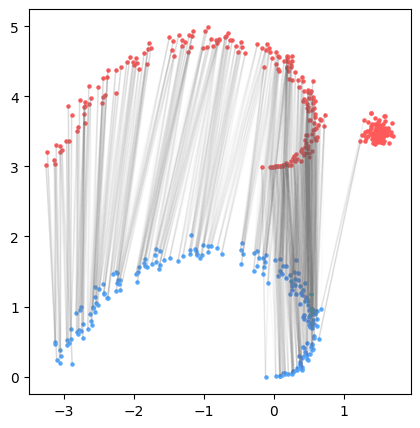

In [43]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 3, c='#ff5a5a', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(mus[-1].shape[0] - 1):
    for j in range(mus[-1].shape[1]):
        if mus[-1][i,j] > thresh:
#             print(i,j)
            ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'gray', 
                    alpha=100*mus[-1][i][j], lw=1)
plt.savefig('Data/partial/JGW-coupling.svg')
plt.show()

In [44]:
mus[-1].max()

0.003393732195763071

In [45]:
a = [1/points_x[0].shape[0]] * points_x[0].shape[0]
b = [1/points_y.shape[0]] * points_y.shape[0]
n = points_x[0].shape[0]
dx = np.zeros((n, n))
for i in range(n):
    for j in range(n):
        dx[i][j] = np.linalg.norm(points_x[0][i] - points_x[0][j])

n = points_y.shape[0]
dy = np.zeros((n, n))
for i in range(n):
    for j in range(n):
        dy[i][j] = np.linalg.norm(points_y[i] - points_y[j])

a = torch.from_numpy(np.array(a))
b = torch.from_numpy(np.array(b))
dx = torch.from_numpy(np.array(dx))
dy = torch.from_numpy(np.array(dy))

In [46]:
eps=1
rho=10000
rho2=10000
nits_plan=100
tol_plan=1e-10
nits_sinkhorn=100
tol_sinkhorn=1e-10

In [47]:
t0 = time.time()
pi, gamma = log_ugw_sinkhorn(a, dx, b, dy, eps=1e-2, two_outputs=True)
print(time.time() - t0)

181.50255179405212


In [48]:
pi

tensor([[ 1.7249e-04,  3.6436e-53,  0.0000e+00,  ...,  7.1455e-25,
          2.0945e-23,  3.3535e-19],
        [ 1.5338e-15,  9.3050e-52, 4.3962e-314,  ...,  1.0755e-05,
          5.5075e-06,  2.7385e-06],
        [4.0834e-111,  9.3173e-54,  1.7632e-49,  ..., 8.0309e-214,
         3.4596e-210, 2.2128e-192],
        ...,
        [ 1.2436e-07,  1.4999e-30, 4.0412e-311,  ...,  1.0376e-55,
          1.9823e-53,  2.2181e-43],
        [2.7180e-121,  9.2291e-69,  2.5995e-34,  ..., 1.0116e-220,
         3.5698e-217, 3.2375e-201],
        [ 1.0721e-85,  1.1268e-31,  1.0760e-79,  ..., 4.5836e-185,
         1.3804e-181, 7.5546e-163]], dtype=torch.float64)

0.0001


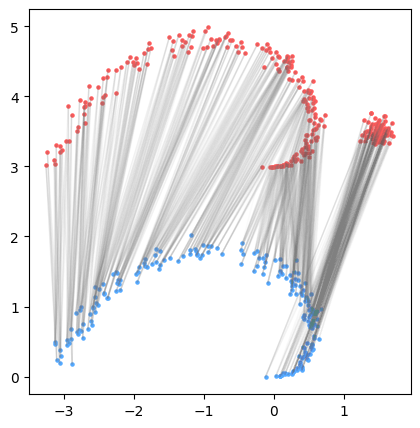

In [49]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 3, c='#ff5a5a', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(pi.shape[0] - 1):
    for j in range(pi.shape[1]):
        if pi[i,j] > thresh:
#             print(i,j)
            ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'gray', 
                    alpha=100*float(pi[i][j]), lw=1)
plt.savefig('Data/partial/UGW-coupling.svg')
plt.show()

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torch
import ot
from sklearn.datasets import make_moons
import os

from pgwlib.unbalanced_gromov_wasserstein.unbalancedgw.vanilla_ugw_solver import exp_ugw_sinkhorn,log_ugw_sinkhorn
from pgwlib.unbalanced_gromov_wasserstein.unbalancedgw._vanilla_utils import ugw_cost
from pgwlib.unbalanced_gromov_wasserstein.unbalancedgw.utils import generate_measure
from pgwlib.unbalanced_gromov_wasserstein.unbalancedgw.batch_stable_ugw_solver import log_batch_ugw_sinkhorn
from pgwlib.gromov import gromov_wasserstein, cost_matrix_d, partial_gromov_ver1, GW_dist, MPGW_dist, PGW_dist_with_penalty,partial_gromov_wasserstein

In [51]:
def plot_plan_2d(X, Y, gamma,threshold=1e-8):
    plt.figure(figsize=(8, 6))
    N=X.shape[0]
    plt.scatter(X[:,0], X[:, 1], c='r')
    
    plt.scatter(Y[0:N,0], Y[0:N,1], c='c')
    plt.scatter(Y[N+1:,0],  Y[N+1:,1], c='b')
    
    for i in range(X.shape[0]):
        for j in range(Y.shape[0]):
            if gamma[i, j] > threshold:  plt.plot([X[i, 0], Y[j, 0]], [X[i, 1], Y[j, 1]], 'grey', lw=gamma[i, j]*150, alpha=0.4)

    plt.show()


In [54]:
# apply all methods for moon data 
t0 = time.time()
X1 = points_x[0]
X2 = points_y + 3
lam=10

C1,C2=cost_matrix_d(X1,X1),cost_matrix_d(X2,X2)
C12=cost_matrix_d(X1,X2)

N1,N2=X1.shape[0],X2.shape[0]
    
p = np.ones(N1) / N1
q = np.ones(N2) / N1

G0=ot.emd(p/p.sum(),q/q.sum(),C12)
pgw_gamma = partial_gromov_ver1(C1, C2, p, q, G0=G0, Lambda=lam, thres=1, numItermax=100*N1, tol=1e-5, log=False, verbose=False, line_search=True)
print(time.time() - t0)    

0.5690779685974121


0.0001


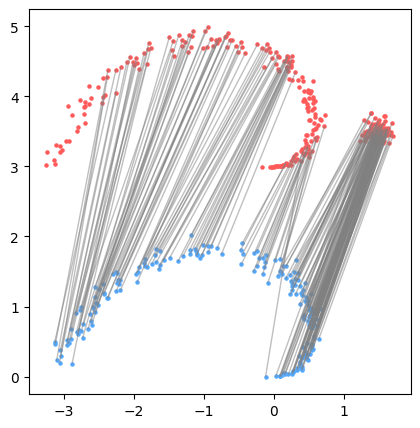

In [55]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 3, c='#ff5a5a', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(pgw_gamma.shape[0]):
    for j in range(pgw_gamma.shape[1]):
        if pgw_gamma[i,j] > thresh:
#             print(i,j)
            ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'gray', 
                    alpha=100*float(pgw_gamma[i][j]), lw=1)
plt.savefig('Data/partial/PGW-coupling.svg')
plt.show()

In [116]:
gamma = ot.partial.partial_gromov_wasserstein(C1, C2, p, q)

In [124]:
d_x[0:-1, 0:-1].shape

(200, 200)

In [125]:
d_y.shape

(300, 300)

In [128]:
mu_x[0:-1,].shape

(200,)

In [130]:
mu_y.shape

(300,)

In [143]:
gamma = ot.partial.partial_gromov_wasserstein(d_x[0:-1, 0:-1], d_y, mu_x[0:-1,], mu_y)

In [139]:
mu_x[0:-1].sum()

0.6666666666666667

In [140]:
gamma.sum()

0.6666666666666666

In [156]:
def create_random_perm_mat(shape):
    perm = np.random.permutation(shape[1])
    t_perm = np.zeros(shape)
    for i in range(shape[1]):
        if perm[i] < shape[0]:
            t_perm[perm[i], i] = 1
    res = t_perm/t_perm.sum()
    noise = np.random.rand(shape[0], shape[1])
    res += noise /noise.sum()
    res /= res.sum()
    return res

0


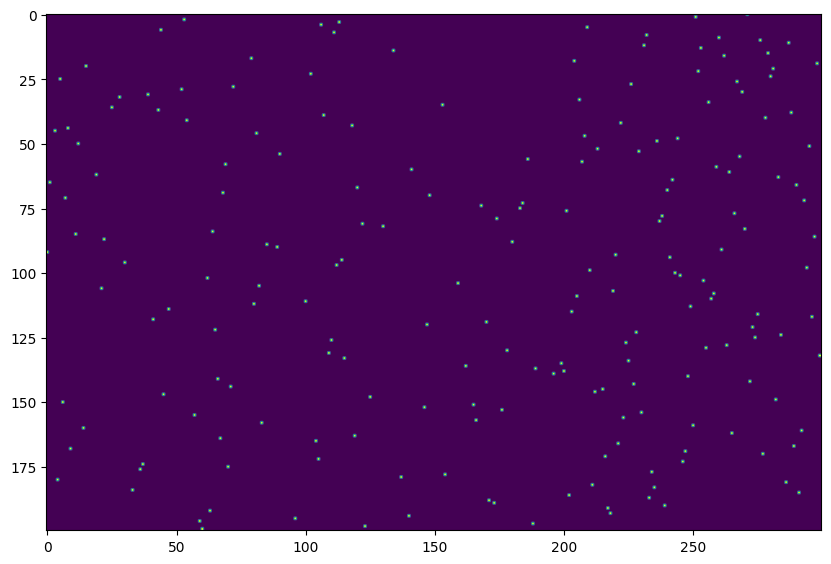

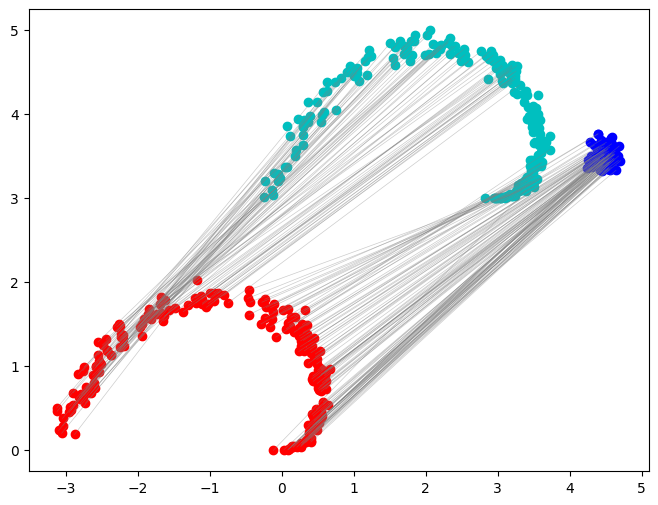

1


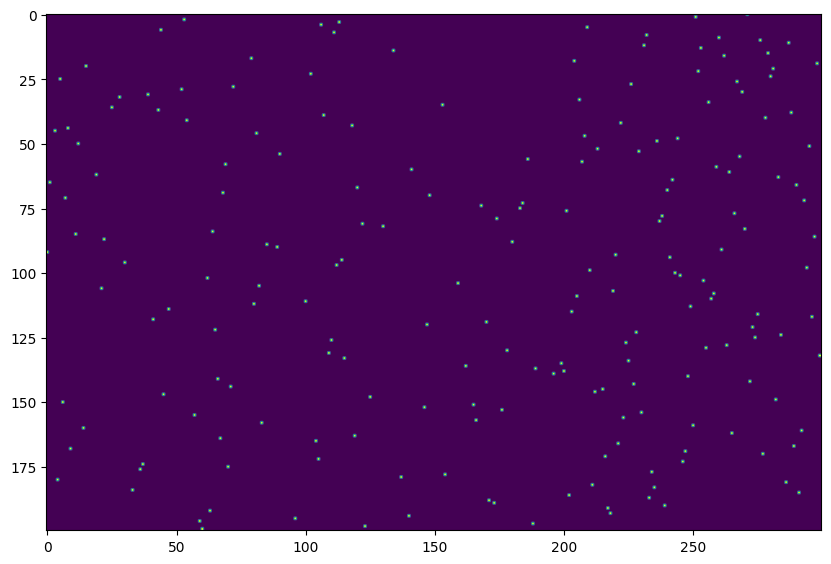

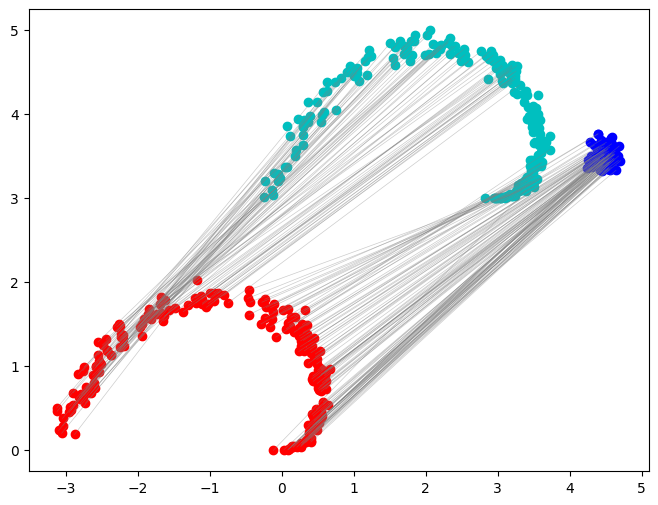

2


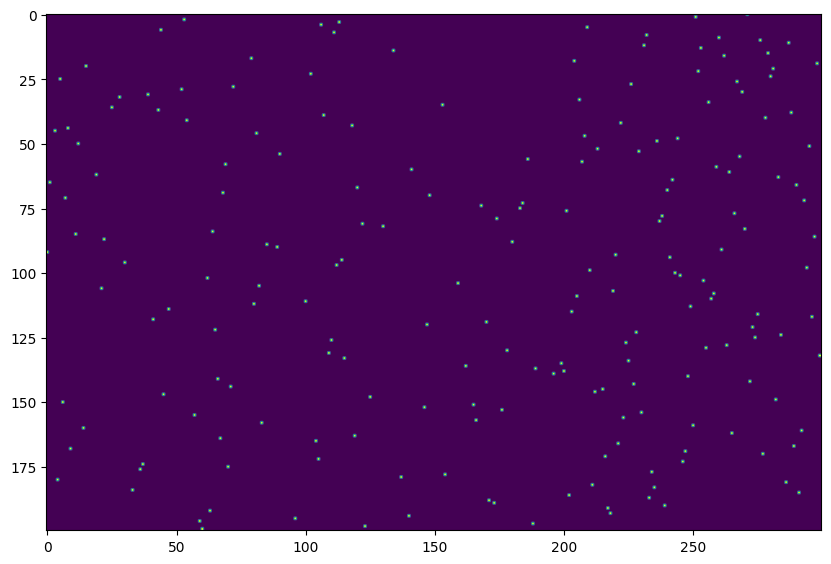

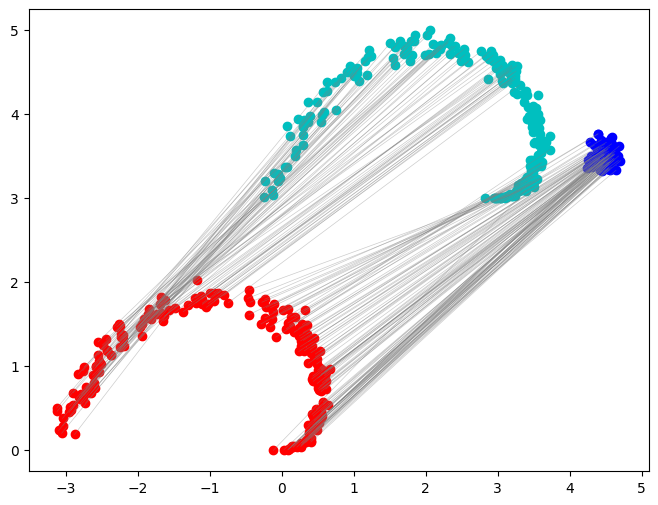

3


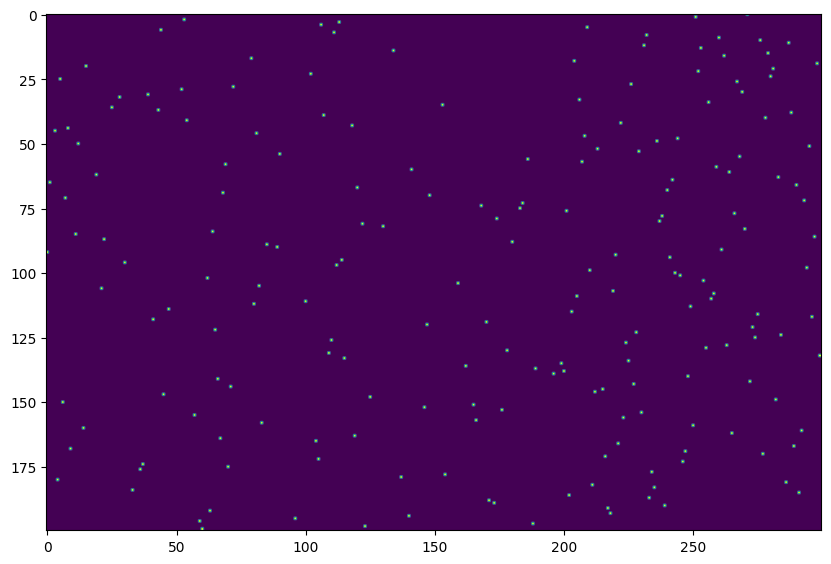

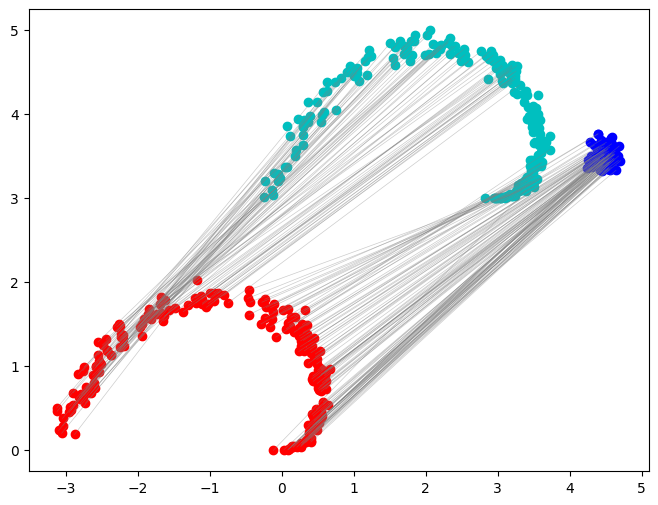

4


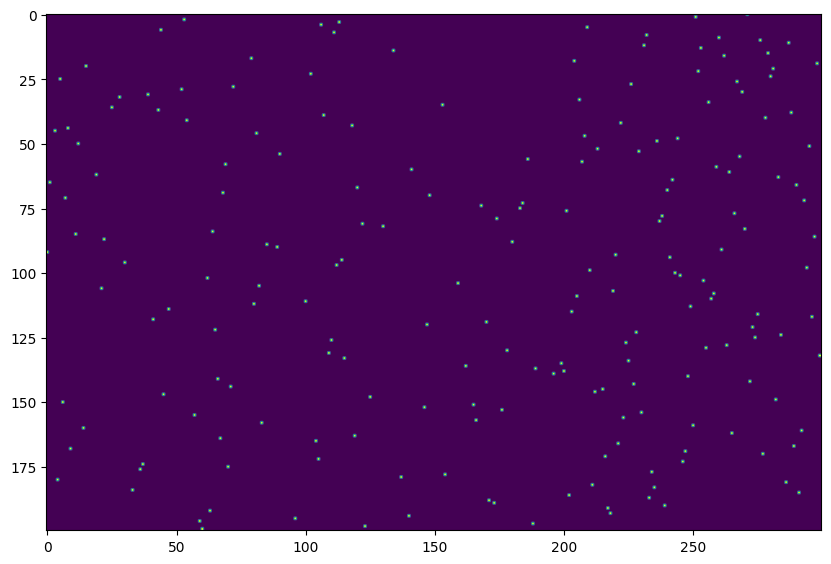

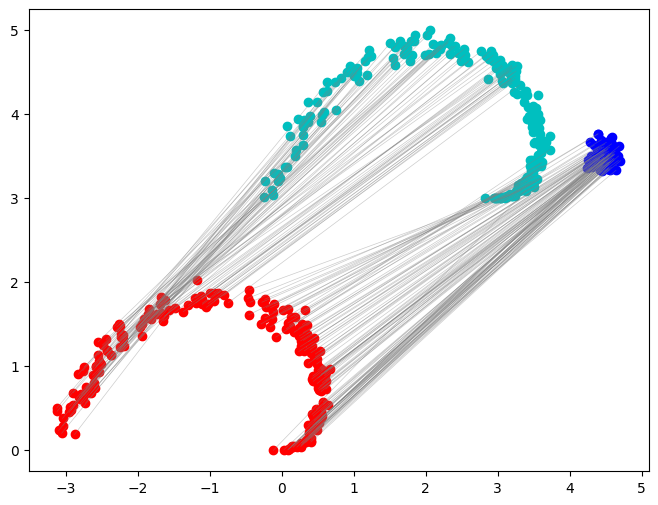

In [211]:
mpgw_gamma = ot.partial.partial_gromov_wasserstein(d_x[0:-1, 0:-1], d_y, mu_x[0:-1,], mu_y)
for k in range(5):
    print(k)
    G0 = create_random_perm_mat(mpgw_gamma.shape)
    mpgw_gamma = ot.partial.partial_gromov_wasserstein(d_x[0:-1, 0:-1], d_y, mu_x[0:-1,], mu_y, G0=G0)
#     plt.imshow(G0)
#     plt.show()
    plt.imshow(mpgw_gamma)
    plt.show()
    plot_plan_2d(X1, X2, mpgw_gamma, threshold=1e-3)

In [56]:
t0 = time.time()
mpgw_gamma = ot.partial.partial_gromov_wasserstein(d_x[0:-1, 0:-1], d_y, mu_x[0:-1,], mu_y, G0=G0)
print(time.time() - t0)

0.596827507019043


0.0001


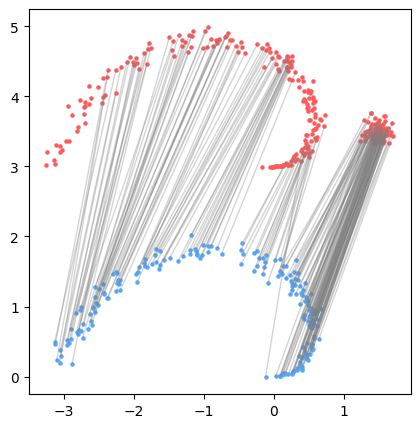

In [57]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 3, c='#ff5a5a', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(mpgw_gamma.shape[0]):
    for j in range(mpgw_gamma.shape[1]):
        if mpgw_gamma[i,j] > thresh:
#             print(i,j)
            ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'gray', 
                    alpha=100*float(mpgw_gamma[i][j]), lw=1)
plt.savefig('Data/partial/mPGW-coupling.svg')
plt.show()

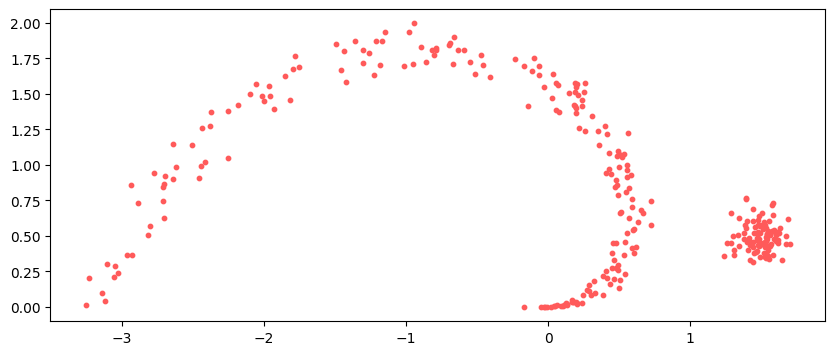

In [74]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[0:200,0], points_y[0:200,1], c='#ff5a5a', s=10)
ax.scatter(points_y[200:300,0], points_y[200:300,1], c='#ff5a5a', s=10)
# ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')
plt.savefig('Data/partial/point-target.svg')
plt.show()

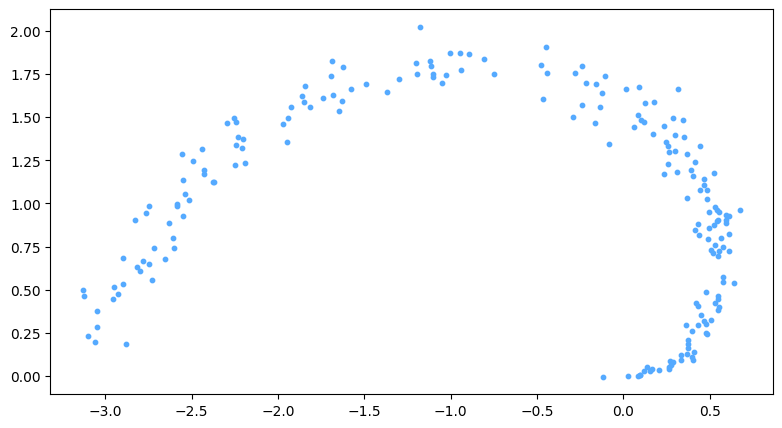

In [73]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
# ax.scatter(points_y[0:200,0], points_y[0:200,1] + 3, c='#ff5a5a', s=5)
# ax.scatter(points_y[200:300,0], points_y[200:300,1] + 3, c='#636363', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=10)
ax.set_aspect('equal', 'box')
plt.savefig('Data/partial/point-source.svg')
plt.show()

In [231]:
times = [0.4949462413787842, 0.4860706329345703, 227.14470434188843, 108.61239552497864]
methods = ['mPGW', 'PGW', 'UGW', 'JGW']

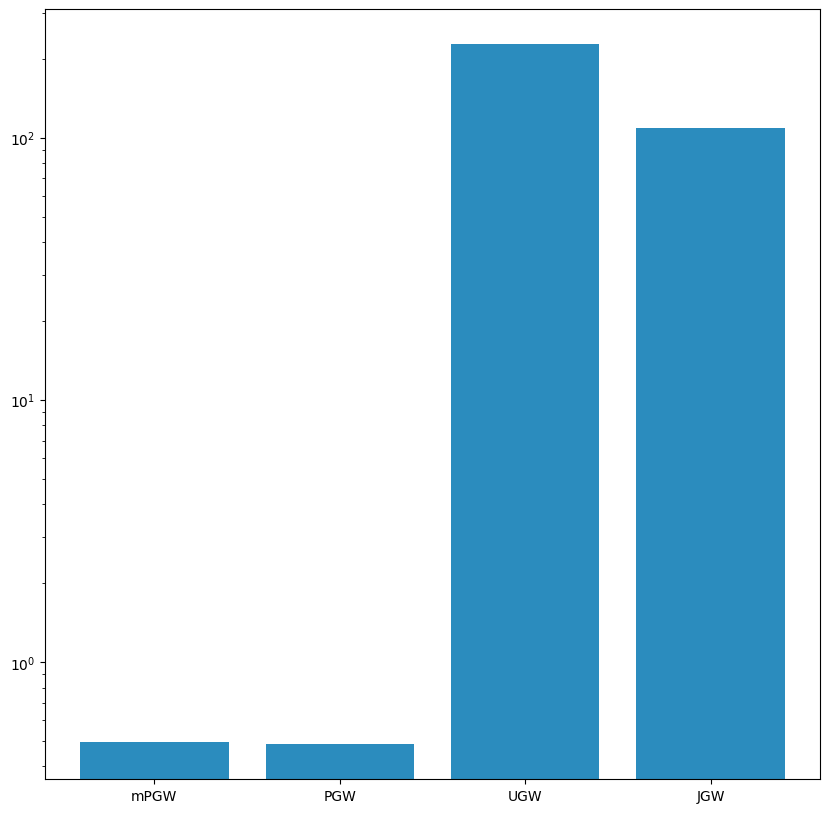

In [238]:
plt.bar(methods, times, log=True, color='#2b8cbe')
plt.savefig('Data/partial/times.svg')
plt.show()

In [58]:
ind = 0
mini = 100
for i in range(points_x[0].shape[0]):
    if points_x[0][i][0] < mini:
        mini = points_x[0][i][0]
        ind = i

In [59]:
ind

74

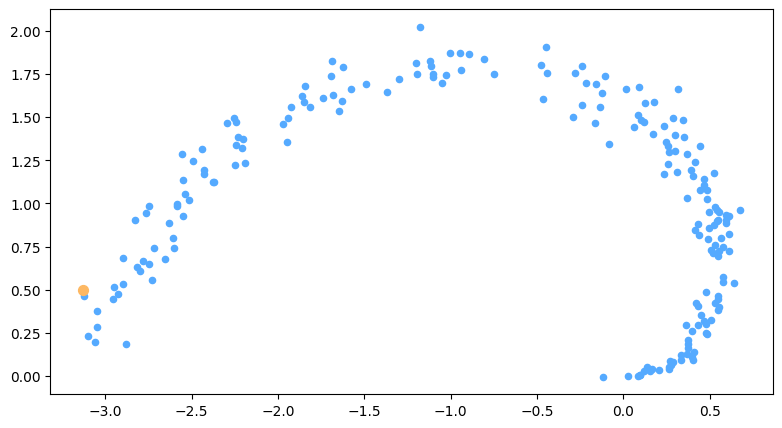

In [320]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
# ax.scatter(points_y[0:200,0], points_y[0:200,1] + 3, c='#ff5a5a', s=5)
# ax.scatter(points_y[200:300,0], points_y[200:300,1] + 3, c='#636363', s=5)
# ind = 0
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=20)
ax.scatter(points_x[0][ind,0], points_x[0][ind,1], c='#fdb863', s=50)
ax.set_aspect('equal', 'box')
plt.savefig('Data/partial/point-source1.svg')
plt.show()

In [244]:
ind

74

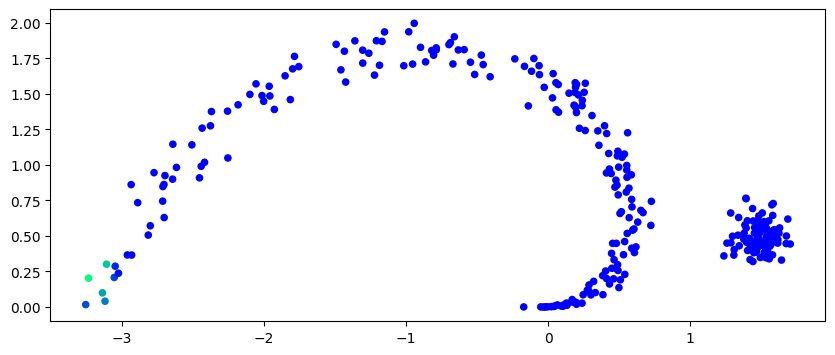

In [278]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] , c=mus[-1][ind], s=20, cmap='winter')
# ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')
plt.savefig('Data/partial/JGW-cor.svg')
plt.show()

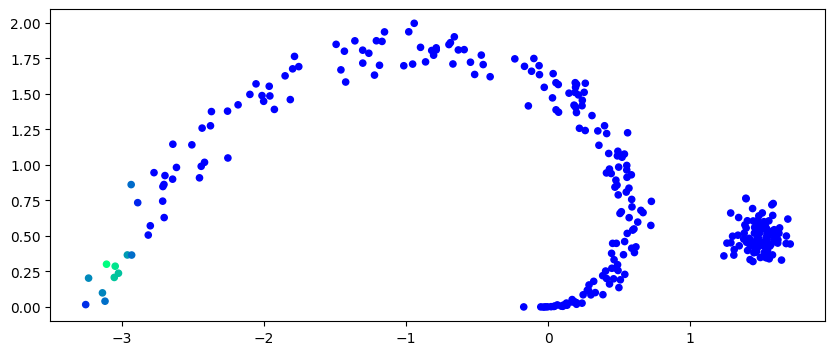

In [279]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] , c=pi[ind], s=20, cmap='winter')
# ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')
plt.savefig('Data/partial/UGW-cor.svg')
plt.show()

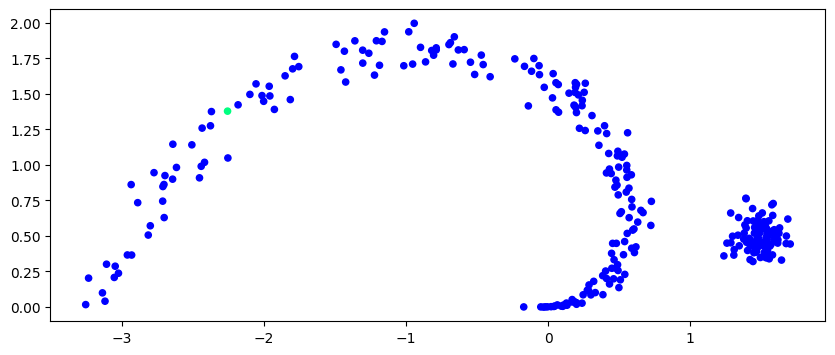

In [280]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] , c=pgw_gamma[ind], s=20, cmap='winter')
# ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')
plt.savefig('Data/partial/PGW-cor.svg')
plt.show()

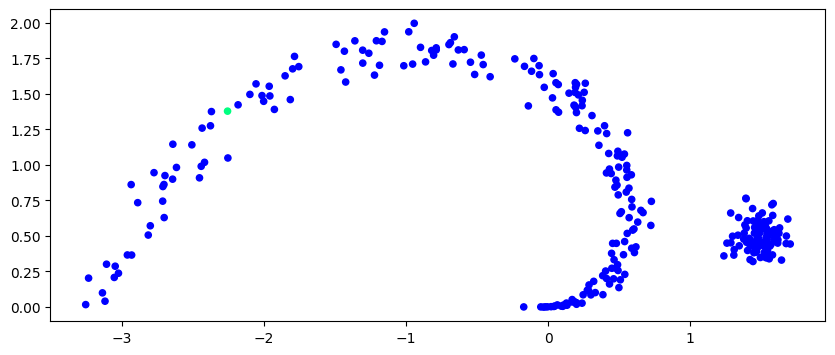

In [281]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] , c=mpgw_gamma[ind], s=20, cmap='winter')
# ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')
plt.savefig('Data/partial/mPGW-cor.svg')
plt.show()

0.0001


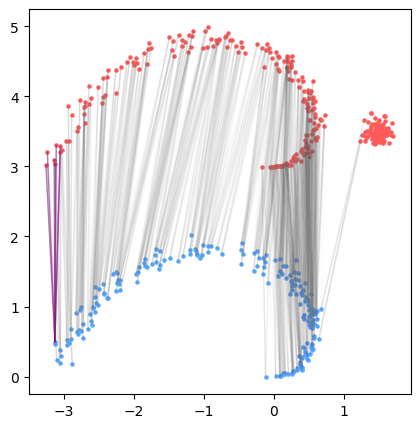

In [69]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 3, c='#ff5a5a', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(mus[-1].shape[0] - 1):
    for j in range(mus[-1].shape[1]):
        if mus[-1][i,j] > thresh:
#             print(i,j)
            if i!= ind:
                ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'gray', 
                        alpha=100*mus[-1][i][j], lw=1)
            else:
                ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'purple', 
                        alpha=0.5, lw=1)
plt.savefig('Data/partial/JGW-coupling-v1.svg')
plt.show()

0.0001


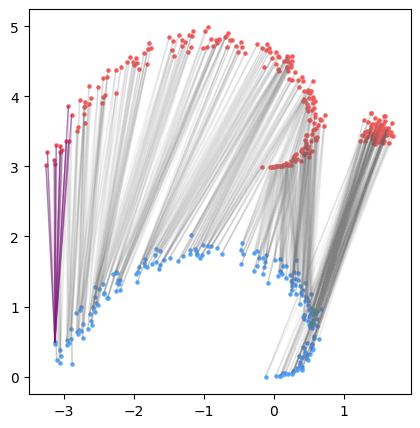

In [70]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 3, c='#ff5a5a', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(pi.shape[0] - 1):
    for j in range(pi.shape[1]):
        if pi[i,j] > thresh:
#             print(i,j)
            if i!= ind:
                ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'gray', 
                        alpha=100*float(pi[i][j]), lw=1)
            else:
                ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'purple', 
                        alpha=0.5, lw=1)
plt.savefig('Data/partial/UGW-coupling-v1.svg')
plt.show()

0.0001


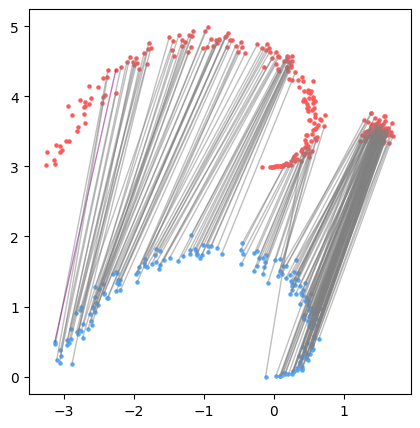

In [71]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 3, c='#ff5a5a', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(pgw_gamma.shape[0]):
    for j in range(pgw_gamma.shape[1]):
        if pgw_gamma[i,j] > thresh:
#             print(i,j)
            if i != ind:
                ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'gray', 
                        alpha=100*float(pgw_gamma[i][j]), lw=1)
            else:
                ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'purple', 
                        alpha=0.5, lw=1)
plt.savefig('Data/partial/PGW-coupling-v1.svg')
plt.show()

0.0001


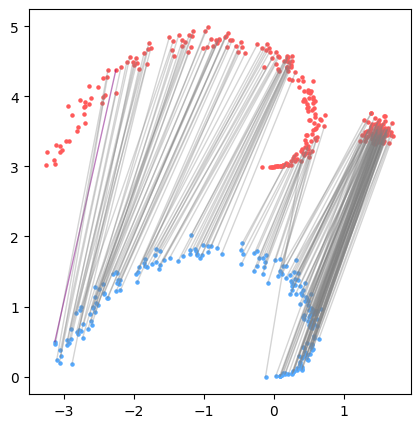

In [72]:
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot()
ax.scatter(points_y[:,0], points_y[:,1] + 3, c='#ff5a5a', s=5)
ax.scatter(points_x[0][:,0], points_x[0][:,1], c='#55aaff', s=5)
ax.set_aspect('equal', 'box')

thresh = 1/10000
print(thresh)
for i in range(mpgw_gamma.shape[0]):
    for j in range(mpgw_gamma.shape[1]):
        if mpgw_gamma[i,j] > thresh:
#             print(i,j)
            if i != ind:
                ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'gray', 
                        alpha=100*float(mpgw_gamma[i][j]), lw=1)
            else:
                ax.plot((points_y[j, 0],points_x[0][i, 0]), (points_y[j, 1] + 3,points_x[0][i, 1]), 'purple', 
                        alpha=0.5, lw=1)
plt.savefig('Data/partial/mPGW-coupling-v1.svg')
plt.show()

In [262]:
np.var(mus[-1][100])

1.801072962027281e-09

In [263]:
np.var(np.array(pi[100]))

2.244505269648876e-09

In [272]:
mus[-1][ind].sum()

0.003333333333333333

In [273]:
np.zeros((2,))

array([0., 0.])

In [283]:
def compute_var(row):
    pr = row/row.sum()
    mean_point = np.zeros((2,))
    for i in range(pr.shape[0]):
        mean_point += points_y[i]*pr[i]
    var = 0
    for i in range(pr.shape[0]):
        residue = mean_point - points_y[i]
        var += pr[i]*(residue[0]**2 + residue[1]**2)
    return var

In [284]:
compute_var(mus[-1][ind])

0.014382804452411618

In [286]:
compute_var(np.array(pi[ind]))

0.04518068549409967

In [287]:
compute_var(pgw_gamma[ind])

0.0

In [282]:
mus[-1][ind].shape

(300,)

In [292]:
jgw_vars = []
for i in range(points_x[0].shape[0]):
    jgw_vars.append(compute_var(mus[-1][i]))
print(np.mean(jgw_vars))

0.02918342422415944


In [293]:
ugw_vars = []
for i in range(points_x[0].shape[0]):
    ugw_vars.append(compute_var(np.array(pi[i])))
print(np.mean(ugw_vars))

0.03836086968845475


In [294]:
pgw_vars = []
for i in range(points_x[0].shape[0]):
    pgw_vars.append(compute_var(pgw_gamma[i]))
print(np.mean(pgw_vars))

0.0


In [295]:
mpgw_vars = []
for i in range(points_x[0].shape[0]):
    mpgw_vars.append(compute_var(mpgw_gamma[i]))
print(np.mean(mpgw_vars))

0.0


In [296]:
var = [0.0, 0.0, 0.03836086968845475, 0.02918342422415944]
methods = ['mPGW', 'PGW', 'UGW', 'JGW']

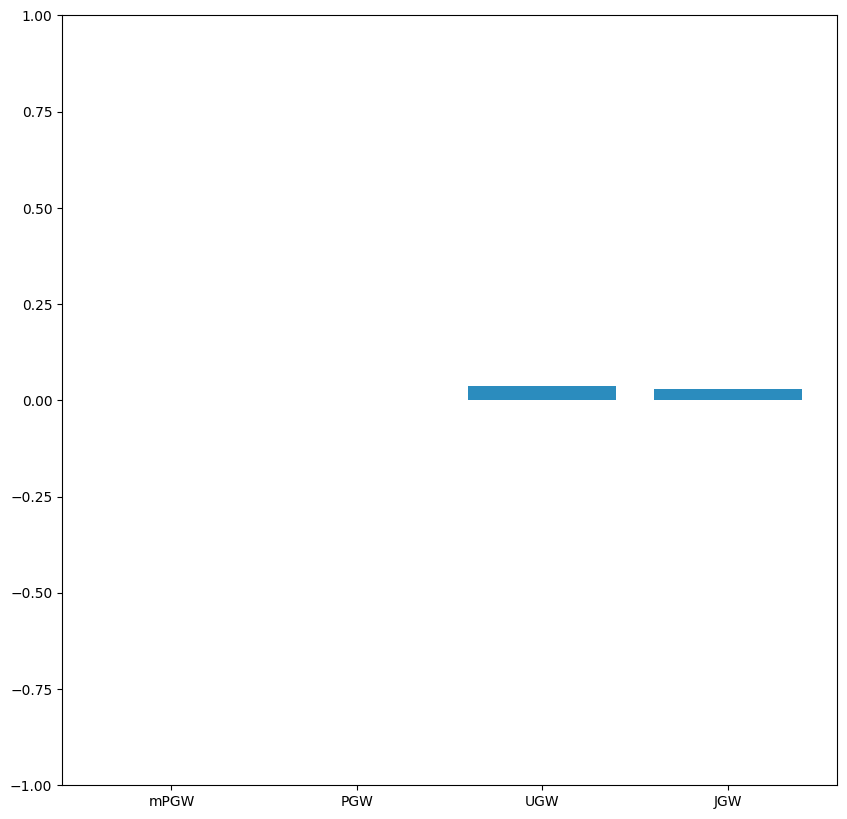

In [300]:
plt.bar(methods, var, log=False, color='#2b8cbe')
plt.ylim(-1,1)
plt.savefig('Data/partial/vars.svg')
plt.show()

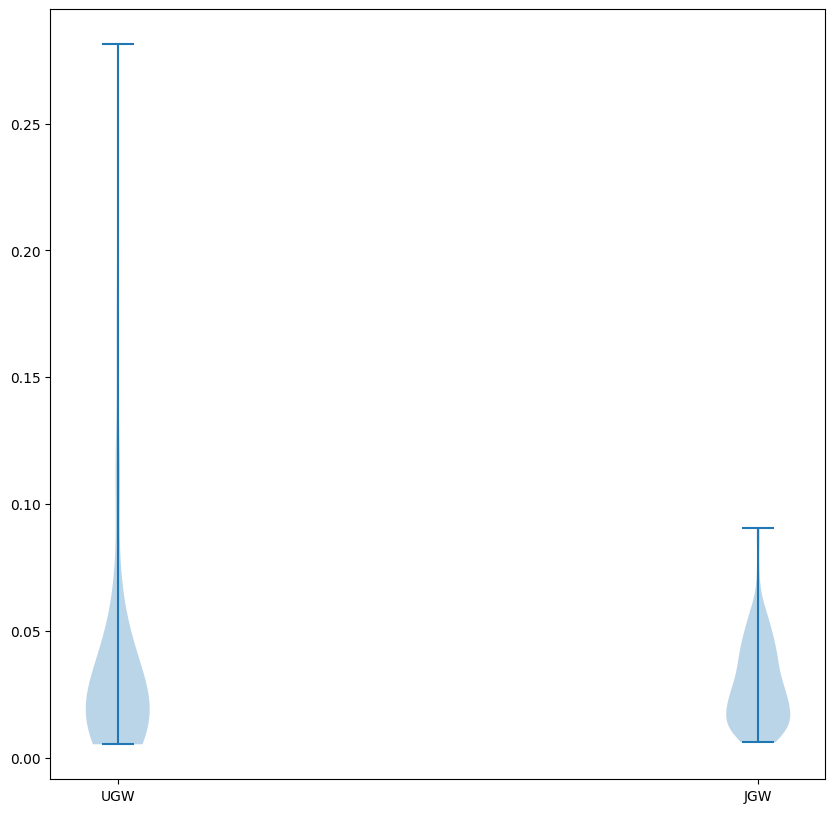

In [317]:
plt.violinplot([ugw_vars, jgw_vars], widths=0.1, showmeans=False, showextrema=True, showmedians=False)
plt.xticks([1,2], labels=['UGW', 'JGW'])
plt.savefig('Data/partial/vars1.svg')
plt.show()

In [325]:
import numpy as np
from tempfile import TemporaryFile
# outfile = open('Data/partial/points.npz', 'wb')
np.savez('Data/partial/points.npz', x=points_x, y=points_y)

In [31]:
points_x = np.load('Data/partial/points.npz', allow_pickle=True)['x']
points_y = np.load('Data/partial/points.npz', allow_pickle=True)['y']

In [33]:
mu_y = [1/points_y.shape[0]] * points_y.shape[0]
mu_x = [1/points_y.shape[0]] * points_x[0].shape[0] + [1 - points_x[0].shape[0]/points_y.shape[0]]

In [330]:
mus[-1][0:200, 200:300].sum()

0.006018672429681013

In [332]:
np.array(pi)[:,200:300].sum()

0.3333338119468937

In [333]:
pgw_gamma[:,200:300].sum()

0.49000000000000005

In [334]:
mpgw_gamma[:, 200:300].sum()

0.32666666666666666

In [335]:
mus[-1][0:200, :].sum()

0.6666666666666666

In [336]:
np.array(pi)[:,:].sum()

1.0000000000000004

In [337]:
pgw_gamma[:,:].sum()

1.0

In [338]:
mpgw_gamma[:,:].sum()

0.6666666666666666

In [339]:
mus[-1][0:200, 200:300].sum() / mus[-1][0:200, :].sum()

0.00902800864452152

In [340]:
np.array(pi)[:,200:300].sum() / np.array(pi)[:,:].sum()

0.33333381194689354

In [341]:
pgw_gamma[:,200:300].sum() / pgw_gamma[:,:].sum()

0.49000000000000005

In [342]:
mpgw_gamma[:, 200:300].sum() / mpgw_gamma[:,:].sum()

0.49